**Table of contents**<a id='toc0_'></a>    
- 1. [Intro](#toc1_)    
- 2. [Data preprocessing](#toc2_)    
  - 2.1. [Clean data](#toc2_1_)    
  - 2.2. [Encode the categories](#toc2_2_)    
  - 2.3. [Encode time](#toc2_3_)    
  - 2.4. [Load data](#toc2_4_)    
- 3. [Examine the dataset](#toc3_)    
  - 3.1. [Feature distributions](#toc3_1_)    
    - 3.1.1. [Numeric features](#toc3_1_1_)    
    - 3.1.2. [Ordinal features](#toc3_1_2_)    
    - 3.1.3. [Nominative features](#toc3_1_3_)    
  - 3.2. [NaN values](#toc3_2_)    
  - 3.3. [Pairwise correlation for features](#toc3_3_)    
  - 3.4. [Mutual information scores between features](#toc3_4_)    
  - 3.5. [Correlation with hierarchy, only numeric features](#toc3_5_)    
  - 3.6. [Target distribution](#toc3_6_)    
- 4. [Start pipeline](#toc4_)    
  - 4.1. [Build pipeline functions and classes](#toc4_1_)    
  - 4.2. [Build performance testing functions](#toc4_2_)    
- 5. [Baseline score with pipeline](#toc5_)    
- 6. [Ensemble regression baseline](#toc6_)    
  - 6.1. [Voting regressor](#toc6_1_)    
  - 6.2. [Stacking regressors](#toc6_2_)    
- 7. [Log-transform skewed numeric features](#toc7_)    
- 8. [Quantile-transform numeric features](#toc8_)    
- 9. [PCA for outliers](#toc9_)    
  - 9.1. [Check for outliers in PCA space](#toc9_1_)    
  - 9.2. [Check performance with PCA outliers scored](#toc9_2_)    
- 10. [Mutual information](#toc10_)    
  - 10.1. [Check feature/target MI scores](#toc10_1_)    
  - 10.2. [Drop features with MI score below some threshold](#toc10_2_)    
- 11. [Mathematical transforms](#toc11_)    
  - 11.1. [Two or more features, combined mathematically](#toc11_1_)    
  - 11.2. [Single feature transforms: area to linear](#toc11_2_)    
- 12. [Coalesce complex feature categories into fewer / simpler categories](#toc12_)    
- 13. [Interactions](#toc13_)    
  - 13.1. [Interaction between GrLivArea and BldgType](#toc13_1_)    
  - 13.2. [Qual / Cond interactions](#toc13_2_)    
  - 13.3. [Categorical / numeric interactions](#toc13_3_)    
- 14. [Group one feature by another feature](#toc14_)    
- 15. [k-Means clustering for area features](#toc15_)    
  - 15.1. [Visualize area feature clusters](#toc15_1_)    
  - 15.2. [Create cluster labels feature](#toc15_2_)    
  - 15.3. [Check cluster labels against the target](#toc15_3_)    
  - 15.4. [Create cluster distance features](#toc15_4_)    
- 16. [PCA for numeric features](#toc16_)    
  - 16.1. [Visualize PCA](#toc16_1_)    
  - 16.2. [Replace all numeric features with some PCA components](#toc16_2_)    
- 17. [PCA-based clustering for numeric features](#toc17_)    
  - 17.1. [Visualize clustering in PCA space](#toc17_1_)    
  - 17.2. [Cluster PCA components, use cluster labels as a feature](#toc17_2_)    
  - 17.3. [Cluster PCA components, use cluster distances as features](#toc17_3_)    
- 18. [PCA-inspired feature creation](#toc18_)    
  - 18.1. [Basement square-footage features](#toc18_1_)    
- 19. [Target Encoding](#toc19_)    
- 20. [Drop columns](#toc20_)    
  - 20.1. [Drop columns for excessive NaN](#toc20_1_)    
- 21. [Impute NaN](#toc21_)    
- 22. [Build model pipelines with all steps included](#toc22_)    
  - 22.1. [Pipeline helper functions](#toc22_1_)    
  - 22.2. [Create / load Optuna studies](#toc22_2_)    
  - 22.3. [Run loop](#toc22_3_)    
  - 22.4. [Check loop results](#toc22_4_)    
    - 22.4.1. [Best parameters](#toc22_4_1_)    
    - 22.4.2. [Optuna plots](#toc22_4_2_)    
    - 22.4.3. [Slice plots](#toc22_4_3_)    
      - 22.4.3.1. [One model, choose five parameters](#toc22_4_3_1_)    
      - 22.4.3.2. [One parameter, all models](#toc22_4_3_2_)    
    - 22.4.4. [All model-specific parameters](#toc22_4_4_)    
      - 22.4.4.1. [xgboost](#toc22_4_4_1_)    
      - 22.4.4.2. [lgbm](#toc22_4_4_2_)    
      - 22.4.4.3. [catboost](#toc22_4_4_3_)    
      - 22.4.4.4. [ridge](#toc22_4_4_4_)    
      - 22.4.4.5. [enet](#toc22_4_4_5_)    
  - 22.5. [Rebuild best models](#toc22_5_)    
  - 22.6. [Best models performance test](#toc22_6_)    
  - 22.7. [Feature importance](#toc22_7_)    
    - 22.7.1. [xgboost](#toc22_7_1_)    
    - 22.7.2. [lgbm](#toc22_7_2_)    
    - 22.7.3. [catboost](#toc22_7_3_)    
    - 22.7.4. [ridge](#toc22_7_4_)    
    - 22.7.5. [enet](#toc22_7_5_)    
- 23. [Ensemble models](#toc23_)    
  - 23.1. [Voting regressor](#toc23_1_)    
  - 23.2. [Stacking regressors](#toc23_2_)    
    - 23.2.1. [Ridge final estimator](#toc23_2_1_)    
      - 23.2.1.1. [All base estimators, no optimization](#toc23_2_1_1_)    
      - 23.2.1.2. [Optuna loop](#toc23_2_1_2_)    
    - 23.2.2. [ElasticNet final estimator](#toc23_2_2_)    
      - 23.2.2.1. [All base estimators, no optimization](#toc23_2_2_1_)    
      - 23.2.2.2. [Optuna loop](#toc23_2_2_2_)    
    - 23.2.3. [LightGBM final estimator](#toc23_2_3_)    
- 24. [Final words](#toc24_)    

<!-- vscode-jupyter-toc-config
	numbering=true
	anchor=true
	flat=false
	minLevel=1
	maxLevel=6
	/vscode-jupyter-toc-config -->
<!-- THIS CELL WILL BE REPLACED ON TOC UPDATE. DO NOT WRITE YOUR TEXT IN THIS CELL -->

# 1. <a id='toc1_'></a>[Intro](#toc0_)

This is essentially a regression problem. Several techniques are shown here:

- feature engineering
- using pipelines
- ensemble models (voting, stacking)

For feature engineering, inspiration is drawn from:

- PCA
- interactions
- k-means clustering
- target encoding
- and more

TLDR: Create features and build models (standalone and ensemble) using pipelines.

https://www.kaggle.com/c/house-prices-advanced-regression-techniques

https://github.com/FlorinAndrei/predict-sale-prices-regression


In [1]:
import time
import os
from pathlib import Path
from pprint import pprint
import json
import math
from itertools import combinations

import numpy as np
import pandas as pd
from pandas.api.types import CategoricalDtype

import matplotlib.pyplot as plt
from matplotlib.ticker import ScalarFormatter, FixedLocator

import plotly.express as px
import plotly.io as pio

import seaborn as sns
from IPython.display import display
import PIL

# from tqdm.notebook import tqdm
from tqdm import tqdm

from category_encoders import TargetEncoder

import statsmodels.api as sm

from sklearn.base import TransformerMixin, BaseEstimator

from sklearn.preprocessing import (
    OneHotEncoder,
    StandardScaler,
    FunctionTransformer,
    QuantileTransformer,
    PowerTransformer,
    scale,
)
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.feature_selection import mutual_info_regression, mutual_info_classif
from sklearn.model_selection import KFold, cross_val_score
from sklearn.metrics import mean_squared_error, mean_squared_log_error, make_scorer
from sklearn.compose import (
    ColumnTransformer,
    TransformedTargetRegressor,
    make_column_selector,
    make_column_transformer,
)

from sklearn.linear_model import (
    Ridge,
    RidgeCV,
    LassoCV,
    ElasticNet,
    ElasticNetCV,
)

from sklearn.ensemble import StackingRegressor, VotingRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.neighbors import KNeighborsRegressor

from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import SimpleImputer, IterativeImputer
from sklearn.pipeline import Pipeline

from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer

import missingno as msno

import umap.plot

from pca import pca as pca_obj

from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from catboost import CatBoostRegressor

import scipy

import optuna

from pipeline_pandas_utils import (
    make_mi_scores,
    plot_mi_scores,
    plot_variance,
    SimpleImputerKeepCategories,
)

pd.options.mode.copy_on_write = True

# Set Matplotlib defaults
plt.style.use("seaborn-whitegrid")
plt.rc("figure", autolayout=True)
plt.rc("axes", labelweight="bold", titleweight="bold")

pio.templates.default = "plotly"

import multiprocess

cpu_count = multiprocess.cpu_count()
# if you have lots of CPUs, use one fold per CPU
# the code is written to run folds in parallel
# more folds = hopefully better estimates
if cpu_count < 8:
    num_folds = 8
else:
    num_folds = cpu_count

/home/florin/.local/lib/python3.11/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/home/florin/.local/lib/python3.11/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/home/florin/.local/lib/python3.11/site-packages/umap/distances.py:1086: NumbaDeprecationWarning: Th

# 2. <a id='toc2_'></a>[Data preprocessing](#toc0_)

## 2.1. <a id='toc2_1_'></a>[Clean data](#toc0_)

Fix typos in category names.

In [2]:
data_dir = Path("../input/house-prices-advanced-regression-techniques/")
df_train = pd.read_csv(data_dir / "train.csv", index_col="Id")

df_test = pd.read_csv(data_dir / "test.csv", index_col="Id")
df_test['SalePrice'] = np.full(df_test.shape[0], np.nan)

df = pd.concat([df_train, df_test])
df

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
Id,,,,,,,,,,,,,,,,,,,,,
1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500.0
2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500.0
3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500.0
4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000.0
5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2915,160,RM,21.0,1936,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NaN,NaN,NaN,0,6,2006,WD,Normal,NaN
2916,160,RM,21.0,1894,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NaN,NaN,NaN,0,4,2006,WD,Abnorml,NaN
2917,20,RL,160.0,20000,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NaN,NaN,NaN,0,9,2006,WD,Abnorml,NaN


In [3]:
na_values = pd.DataFrame(df.isna().sum().sort_values(ascending=False)).head(40)
na_values

,0
PoolQC,2909
MiscFeature,2814
Alley,2721
Fence,2348
MasVnrType,1766
SalePrice,1459
FireplaceQu,1420
LotFrontage,486
GarageFinish,159
GarageQual,159


In [4]:
def clean(df_orig):
    df = df_orig.copy(deep=True)
    df["Exterior2nd"] = df["Exterior2nd"].replace({"Brk Cmn": "BrkComm", "CmentBd": "CemntBd", "Wd Shng": "WdShing"})
    df["BldgType"] = df['BldgType'].replace({"2fmCon": "2FmCon", "Duplex": "Duplx", 'Twnhs': 'TwnhsI'})
    df["Neighborhood"] = df["Neighborhood"].replace({"NAmes": "Names"})
    df['MSZoning'] = df['MSZoning'].replace({'C (all)': 'C'})

    # Some values of GarageYrBlt are corrupt
    # df["GarageYrBlt"] = df["GarageYrBlt"].where(df.GarageYrBlt <= 2010, df.YearBuilt)
    df["GarageYrBlt"] = df["GarageYrBlt"].where(df.GarageYrBlt <= 2010, df['YearRemodAdd'])

    # Names beginning with numbers are awkward to work with
    df.rename(
        columns={
            "1stFlrSF": "FirstFlrSF",
            "2ndFlrSF": "SecondFlrSF",
            "3SsnPorch": "ThreeSeasonPorch",
        },
        inplace=True,
    )
    return df

## 2.2. <a id='toc2_2_'></a>[Encode the categories](#toc0_)

nominative, numeric, ordinal

In [5]:
def cat_to_num(X):
    X = X.copy()
    for c in X.columns.to_list():
        if X[c].dtype.name == 'category':
            X[c] = X[c].cat.codes
    return X


def encode(df_orig, features_numeric, features_ordinal, features_nominative):
    df = df_orig.copy(deep=True)
    # Nominal categories
    for name in features_nominative:
        df[name] = df[name].astype("category")
        # Add a None category for missing values
        if "NA" not in df[name].cat.categories:
            df[name] = df[name].cat.add_categories("NA")
            # make sure NA is the first element in the category list
            # it is already first element for the ordered levels
            cat_list = df[name].cat.categories.to_list()
            last_cat = cat_list.pop()
            cat_list = [last_cat] + cat_list
            df[name] = df[name].cat.reorder_categories(cat_list)

    # numeric features
    for name in features_numeric:
        df[name] = df[name].astype(float)

    # Ordinal categories
    for name, levels in features_ordinal.items():
        df[name] = df[name].astype(CategoricalDtype(levels, ordered=True))

    return df

## 2.3. <a id='toc2_3_'></a>[Encode time](#toc0_)

In [6]:
def encode_time(df_orig):
    # year alone, or month alone, don't do much
    # year + month together have more value
    df = df_orig.copy()
    df['YrSold'] = df['YrSold'].astype(int)
    df['MoSold'] = df['MoSold'].astype(int)
    df['YrMoSold'] = pd.to_datetime(df['YrSold'].astype(str) + '-' + df['MoSold'].astype(str) + '-01').astype(int)
    df.drop(columns=['YrSold', 'MoSold'], inplace=True)
    return df

## 2.4. <a id='toc2_4_'></a>[Load data](#toc0_)

Apply all transformations created above, and load the dataset.

In [7]:
def load_data():
    # Read data
    data_dir = Path("../input/house-prices-advanced-regression-techniques/")
    df_train = pd.read_csv(data_dir / "train.csv", index_col="Id")
    df_test = pd.read_csv(data_dir / "test.csv", index_col="Id")
    # Merge the splits so we can process them together
    df = pd.concat([df_train, df_test])

    # The nominative (unordered) categorical features
    features_nominative = [
        "MSSubClass",
        "MSZoning",
        "Alley",
        "LotShape",
        "LotConfig",
        "LandSlope",
        "Neighborhood",
        "Condition1",
        "Condition2",
        "BldgType",
        "HouseStyle",
        "RoofStyle",
        "RoofMatl",
        "Exterior1st",
        "Exterior2nd",
        "MasVnrType",
        "Foundation",
        "BsmtFinType1",
        "BsmtFinType2",
        "Heating",
        "CentralAir",
        # "BsmtFullBath",
        # "BsmtHalfBath",
        # "BedroomAbvGr",
        # "KitchenAbvGr",
        "GarageType",
        "MiscFeature",
        "SaleType",
        "SaleCondition",
        # "Fence",
    ]

    features_numeric = [
        "LotFrontage",
        "LotArea",
        "YearBuilt",
        "YearRemodAdd",
        "MasVnrArea",
        "BsmtFinSF1",
        "BsmtFinSF2",
        "BsmtUnfSF",
        "TotalBsmtSF",
        "FirstFlrSF",
        "SecondFlrSF",
        "LowQualFinSF",
        "GrLivArea",
        "BsmtFullBath",
        "BsmtHalfBath",
        "FullBath",
        "HalfBath",
        "BedroomAbvGr",
        "KitchenAbvGr",
        "TotRmsAbvGrd",
        "Fireplaces",
        "GarageYrBlt",
        "GarageCars",
        "GarageArea",
        "WoodDeckSF",
        "OpenPorchSF",
        "EnclosedPorch",
        "ThreeSeasonPorch",
        "ScreenPorch",
        "PoolArea",
        "MiscVal",
        "MoSold",
        "YrSold",
    ]

    # The ordinal (ordered) categorical features

    # Pandas calls the categories "levels"
    five_levels = ["Po", "Fa", "TA", "Gd", "Ex"]
    ten_levels = list(range(11))

    features_ordinal = {
        "OverallQual": ten_levels,
        "OverallCond": ten_levels,
        "ExterQual": five_levels,
        "ExterCond": five_levels,
        "BsmtQual": five_levels,
        "BsmtCond": five_levels,
        "HeatingQC": five_levels,
        "KitchenQual": five_levels,
        "FireplaceQu": five_levels,
        "GarageQual": five_levels,
        "GarageCond": five_levels,
        "PoolQC": five_levels,
        "Street": ["Grvl", "Pave"],
        "LandContour": ["Bnk", "Lvl", "Low", "HLS"],
        "BsmtExposure": ["No", "Mn", "Av", "Gd"],
        # "BsmtFinType1": ["Unf", "LwQ", "Rec", "BLQ", "ALQ", "GLQ"],
        # "BsmtFinType2": ["Unf", "LwQ", "Rec", "BLQ", "ALQ", "GLQ"],
        "Functional": ["Sal", "Sev", "Maj2", "Maj1", "Mod", "Min2", "Min1", "Typ"],
        "GarageFinish": ["Unf", "RFn", "Fin"],
        "PavedDrive": ["N", "P", "Y"],
        "Utilities": ["ELO", "NoSeWa", "NoSewr", "AllPub"],
        "CentralAir": ["N", "Y"],
        "Electrical": ["Mix", "FuseP", "FuseF", "FuseA", "SBrkr"],
        "Fence": ["MnWw", "GdWo", "MnPrv", "GdPrv"],
    }

    # Add a None level for missing values
    features_ordinal = {key: ["NA"] + value for key, value in features_ordinal.items()}

    # Preprocessing
    df = clean(df)
    df = encode(df, features_numeric, features_ordinal, features_nominative)

    df = encode_time(df)
    features_numeric.remove('MoSold')
    features_numeric.remove('YrSold')
    features_numeric = features_numeric + ['YrMoSold']

    # Reform splits
    df_train = df.loc[df_train.index, :]
    df_test = df.loc[df_test.index, :]
    return df_train, df_test, features_numeric, features_ordinal, features_nominative


df_train, df_test, features_numeric, features_ordinal, features_nominative = load_data()

In [8]:
# Peek at the values
display(df_train)
# display(df_test)

# Display information about dtypes and missing values
display(df_train.info())
# display(df_test.info())

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,...,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,SaleType,SaleCondition,SalePrice,YrMoSold
Id,,,,,,,,,,,,,,,,,,,,,
1,60,RL,65.0,8450.0,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0.0,0.0,NaN,NaN,NaN,0.0,WD,Normal,208500.0,1201824000000000000
2,20,RL,80.0,9600.0,Pave,NaN,Reg,Lvl,AllPub,FR2,...,0.0,0.0,NaN,NaN,NaN,0.0,WD,Normal,181500.0,1177977600000000000
3,60,RL,68.0,11250.0,Pave,NaN,IR1,Lvl,AllPub,Inside,...,0.0,0.0,NaN,NaN,NaN,0.0,WD,Normal,223500.0,1220227200000000000
4,70,RL,60.0,9550.0,Pave,NaN,IR1,Lvl,AllPub,Corner,...,0.0,0.0,NaN,NaN,NaN,0.0,WD,Abnorml,140000.0,1138752000000000000
5,60,RL,84.0,14260.0,Pave,NaN,IR1,Lvl,AllPub,FR2,...,0.0,0.0,NaN,NaN,NaN,0.0,WD,Normal,250000.0,1228089600000000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1456,60,RL,62.0,7917.0,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0.0,0.0,NaN,NaN,NaN,0.0,WD,Normal,175000.0,1185926400000000000
1457,20,RL,85.0,13175.0,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0.0,0.0,NaN,MnPrv,NaN,0.0,WD,Normal,210000.0,1264982400000000000
1458,70,RL,66.0,9042.0,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0.0,0.0,NaN,GdPrv,Shed,2500.0,WD,Normal,266500.0,1272672000000000000


<class 'pandas.core.frame.DataFrame'>
Index: 1460 entries, 1 to 1460
Data columns (total 79 columns):
 #   Column            Non-Null Count  Dtype   
---  ------            --------------  -----   
 0   MSSubClass        1460 non-null   category
 1   MSZoning          1460 non-null   category
 2   LotFrontage       1201 non-null   float64 
 3   LotArea           1460 non-null   float64 
 4   Street            1460 non-null   category
 5   Alley             91 non-null     category
 6   LotShape          1460 non-null   category
 7   LandContour       1460 non-null   category
 8   Utilities         1460 non-null   category
 9   LotConfig         1460 non-null   category
 10  LandSlope         1460 non-null   category
 11  Neighborhood      1460 non-null   category
 12  Condition1        1460 non-null   category
 13  Condition2        1460 non-null   category
 14  BldgType          1460 non-null   category
 15  HouseStyle        1460 non-null   category
 16  OverallQual       1460 non-nu

None

In [9]:
df_train, df_test, features_numeric, features_ordinal, features_nominative = load_data()
X = df_train.copy()
y = X.pop("SalePrice")

X_test = df_test.copy()
# should be NaN
y_test = X_test.pop('SalePrice')

# 3. <a id='toc3_'></a>[Examine the dataset](#toc0_)

## 3.1. <a id='toc3_1_'></a>[Feature distributions](#toc0_)

### 3.1.1. <a id='toc3_1_1_'></a>[Numeric features](#toc0_)

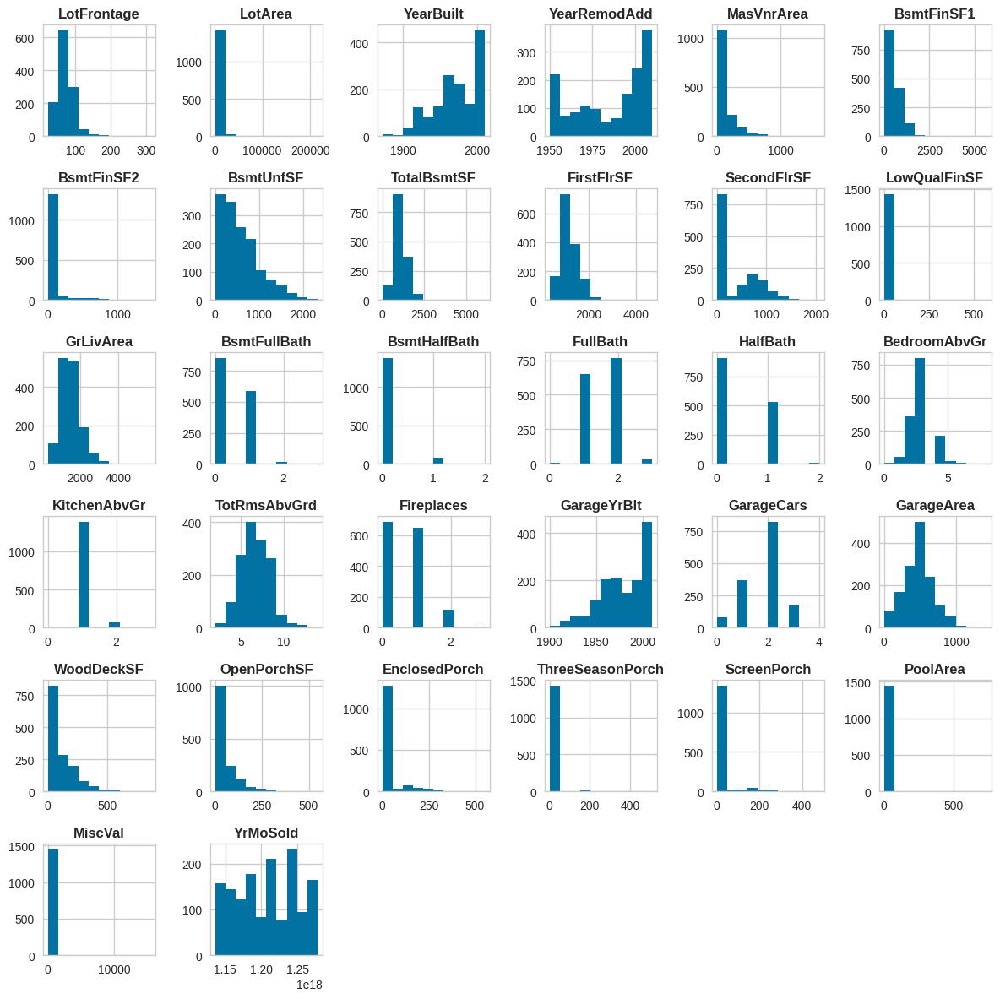

In [10]:
_ = X[features_numeric].hist(figsize=(12, 12))

### 3.1.2. <a id='toc3_1_2_'></a>[Ordinal features](#toc0_)

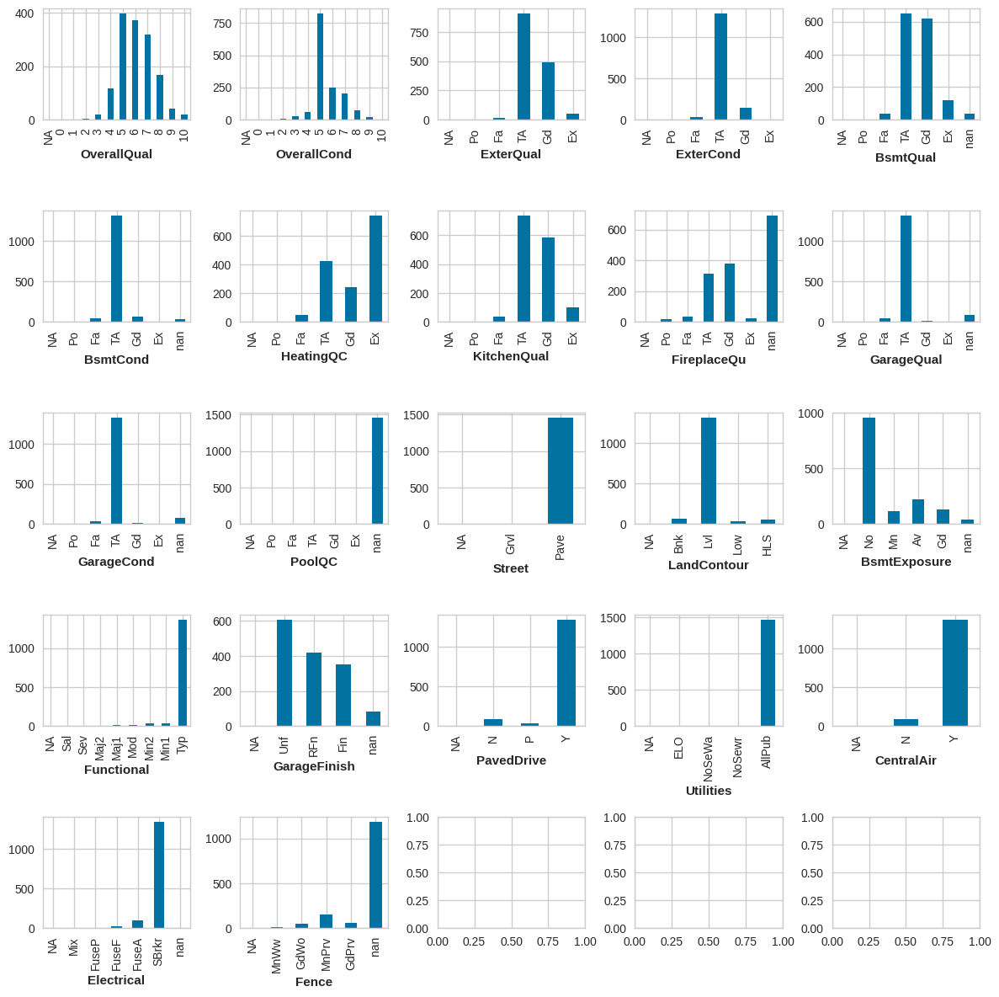

In [11]:
n_features_ordinal = len(list(features_ordinal.keys()))
n_col_f_ord = math.ceil(np.sqrt(n_features_ordinal))
n_row_f_ord = math.ceil(n_features_ordinal / n_col_f_ord)
fig, ax = plt.subplots(nrows=n_row_f_ord, ncols=n_col_f_ord, figsize=(12, 12))
for i in range(0, n_col_f_ord):
    for j in range(0, n_row_f_ord):
        f_index = j + i * n_col_f_ord
        if f_index >= n_features_ordinal:
            continue
        _ = X[list(features_ordinal.keys())[f_index]].value_counts(sort=False, dropna=False).plot.bar(ax=ax[i, j])
plt.show()

### 3.1.3. <a id='toc3_1_3_'></a>[Nominative features](#toc0_)

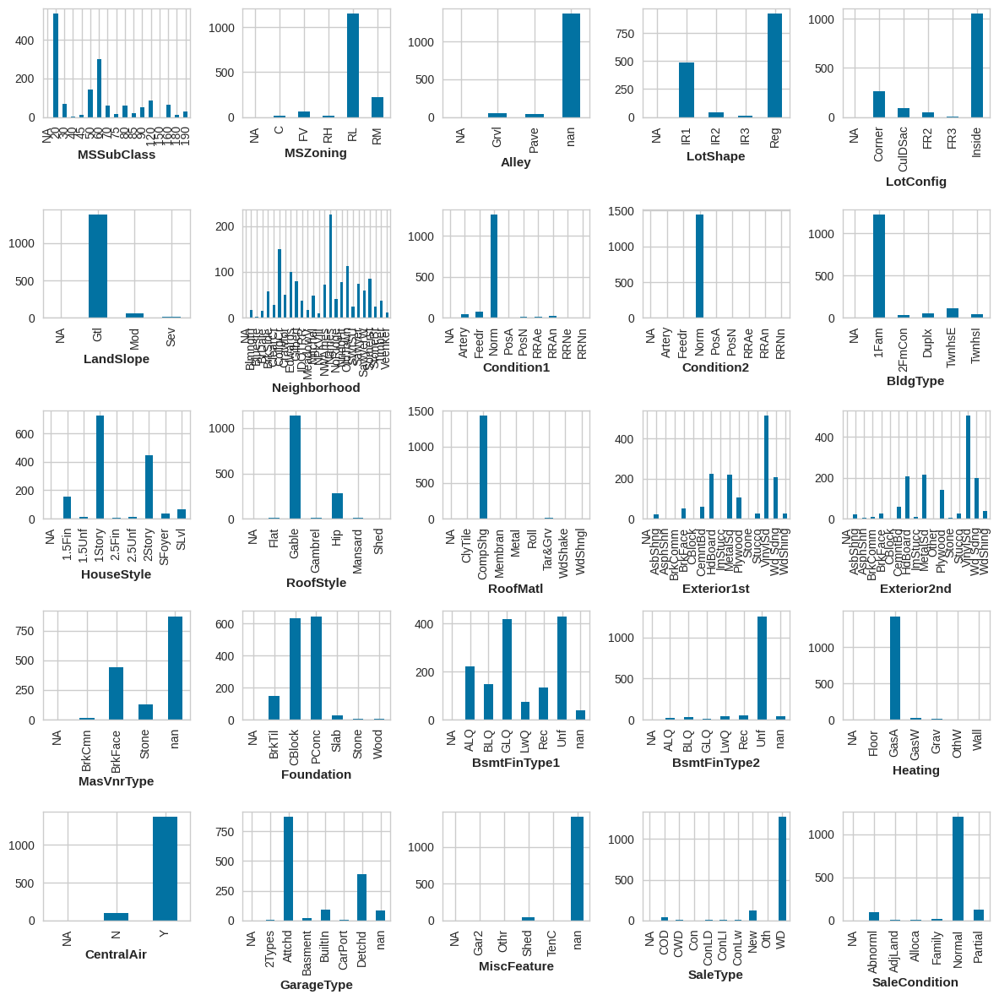

In [12]:
n_features_nominative = len(features_nominative)
n_col_f_nom = math.ceil(np.sqrt(n_features_nominative))
n_row_f_nom = math.ceil(n_features_nominative / n_col_f_nom)
fig, ax = plt.subplots(nrows=n_row_f_nom, ncols=n_col_f_nom, figsize=(12, 12))
for i in range(0, n_col_f_nom):
    for j in range(0, n_row_f_nom):
        f_index = j + i * n_col_f_nom
        if f_index >= n_features_nominative:
            continue
        _ = X[list(features_nominative)[f_index]].value_counts(sort=False, dropna=False).plot.bar(ax=ax[i, j])
plt.show()

## 3.2. <a id='toc3_2_'></a>[NaN values](#toc0_)

In [13]:
X.isna().mean().sort_values(ascending=False).head(20)

PoolQC          0.995205
MiscFeature     0.963014
Alley           0.937671
Fence           0.807534
MasVnrType      0.597260
FireplaceQu     0.472603
LotFrontage     0.177397
GarageFinish    0.055479
GarageType      0.055479
GarageCond      0.055479
GarageQual      0.055479
BsmtExposure    0.026027
BsmtFinType2    0.026027
BsmtCond        0.025342
BsmtFinType1    0.025342
BsmtQual        0.025342
MasVnrArea      0.005479
Electrical      0.000685
MSSubClass      0.000000
TotRmsAbvGrd    0.000000
dtype: float64

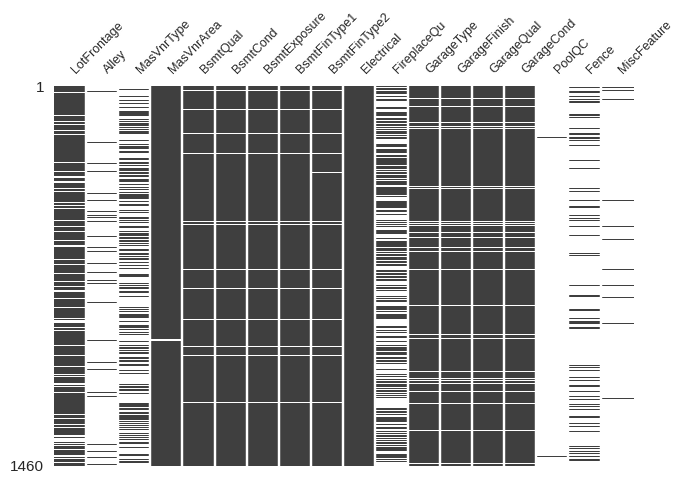

In [14]:
# distribution of NaN

features_with_nan = X.columns[X.isna().any()].to_list()
_ = msno.matrix(X[features_with_nan], labels=True, figsize=(7, 5), fontsize=9, sparkline=False)

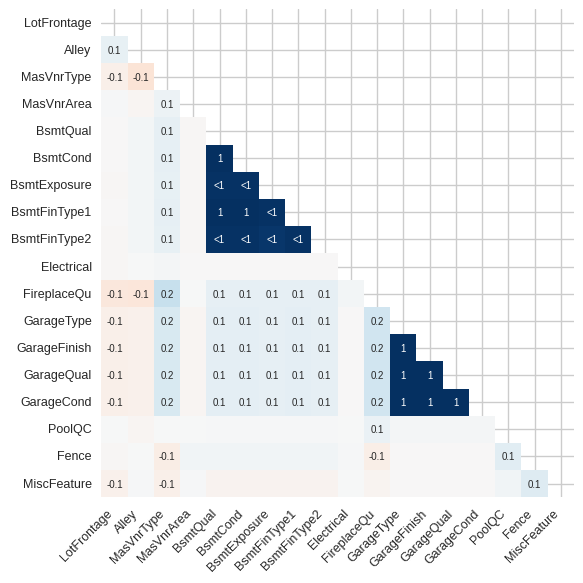

In [15]:
# correlation of NaN

_ = msno.heatmap(X[features_with_nan], figsize=(6, 6), fontsize=9, cbar=False)

## 3.3. <a id='toc3_3_'></a>[Pairwise correlation for features](#toc0_)

/home/florin/.local/lib/python3.11/site-packages/sklearn/preprocessing/_function_transformer.py:345: UserWarning: With transform="pandas", `func` should return a DataFrame to follow the set_output API.
  warnings.warn(


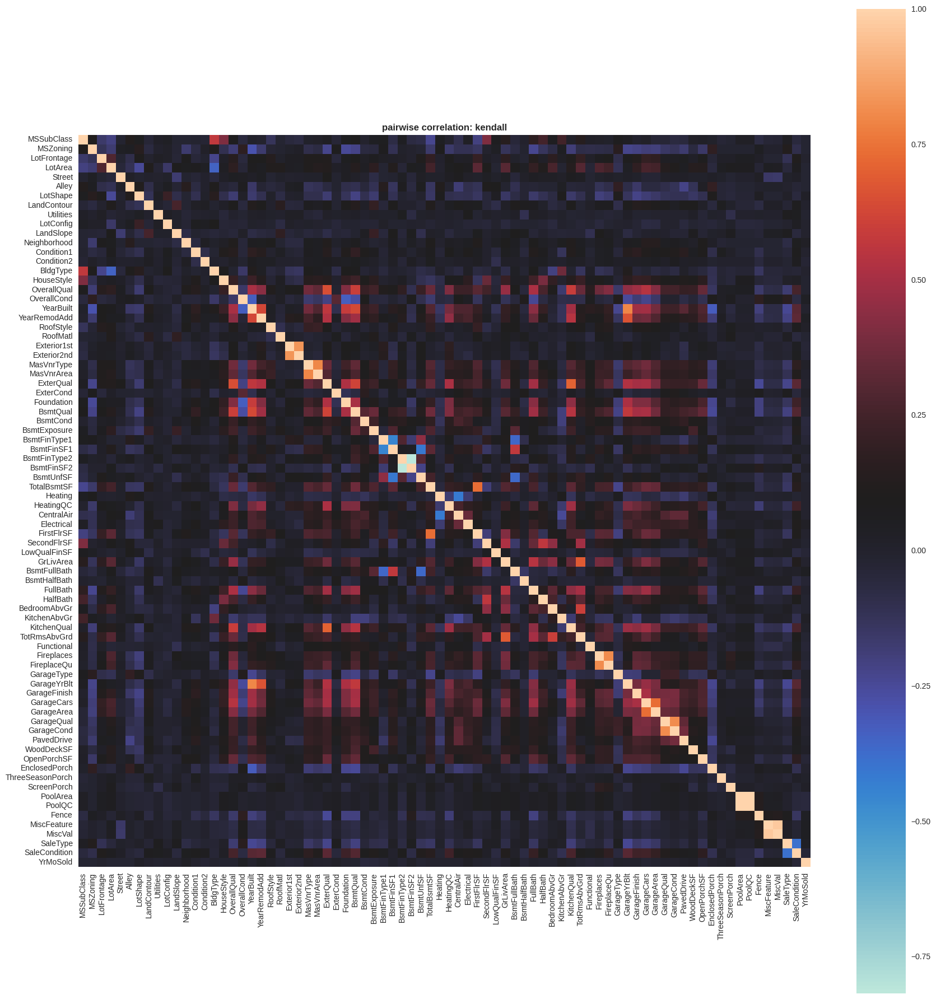

In [18]:
fig, ax = plt.subplots(1, 1, figsize=(18, 18))
# Pearson assumes normal distributions, use Kendall instead
corr_method = 'kendall'
decode_categories = FunctionTransformer(func=cat_to_num)
decode_categories.set_output(transform='pandas')

ax.set_title(f'pairwise correlation: {corr_method}')
ax = sns.heatmap(
    # ctnp.fit_transform(X).fillna(-1).corr(method=corr_method, numeric_only=False),
    decode_categories.fit_transform(X).fillna(-1).corr(method=corr_method, numeric_only=False),
    cmap='icefire',
    cbar=True,
    square=True,
)

## 3.4. <a id='toc3_4_'></a>[Mutual information scores between features](#toc0_)

Also check if some features are informative of other features.

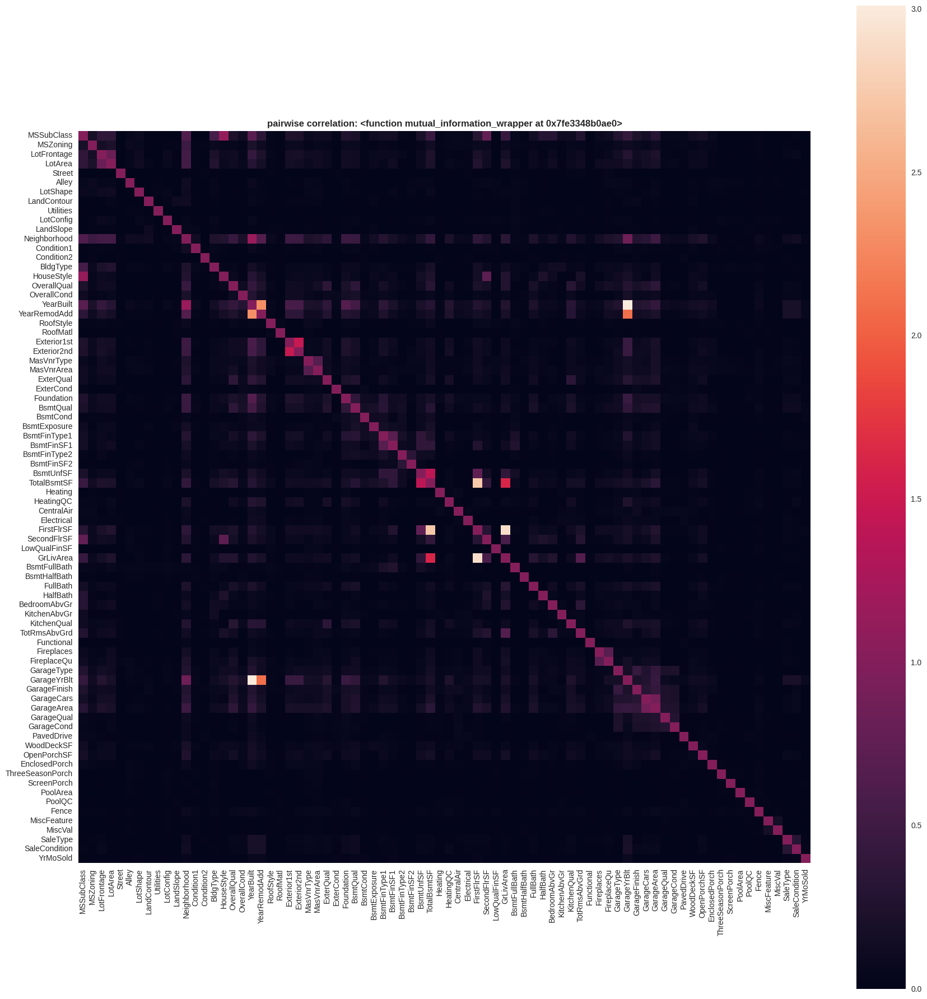

In [19]:
def mutual_information_wrapper(arr1, arr2):
    return mutual_info_regression(arr1.reshape(-1, 1), arr2, random_state=0)


fig, ax = plt.subplots(1, 1, figsize=(18, 18))
corr_method = mutual_information_wrapper
ax.set_title(f'pairwise correlation: {corr_method}')
ax = sns.heatmap(
    decode_categories.fit_transform(X).fillna(-1).corr(method=corr_method, numeric_only=False),
    cbar=True,
    square=True,
)

## 3.5. <a id='toc3_5_'></a>[Correlation with hierarchy, only numeric features](#toc0_)

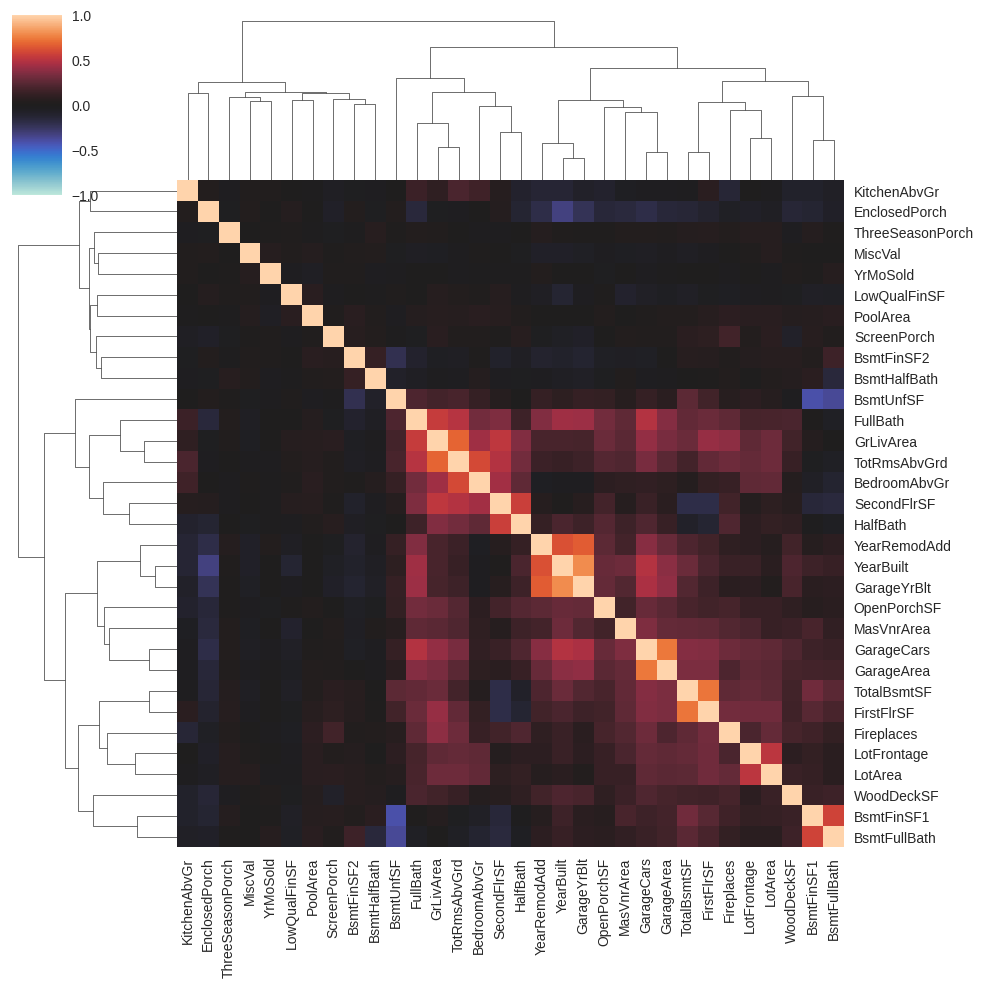

In [20]:
def corrplot(df, method="kendall", annot=True, **kwargs):
    df = df.copy()
    for colname in df.select_dtypes(["category"]):
        df[colname] = df[colname].cat.codes
    sns.clustermap(df.corr(method), vmin=-1.0, vmax=1.0, cmap="icefire", method="complete", annot=annot, **kwargs)


corrplot(X[features_numeric], annot=None)

## 3.6. <a id='toc3_6_'></a>[Target distribution](#toc0_)

/tmp/ipykernel_35469/1812137861.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(y, fit=scipy.stats.norm, ax=ax[1])
/tmp/ipykernel_35469/1812137861.py:7: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


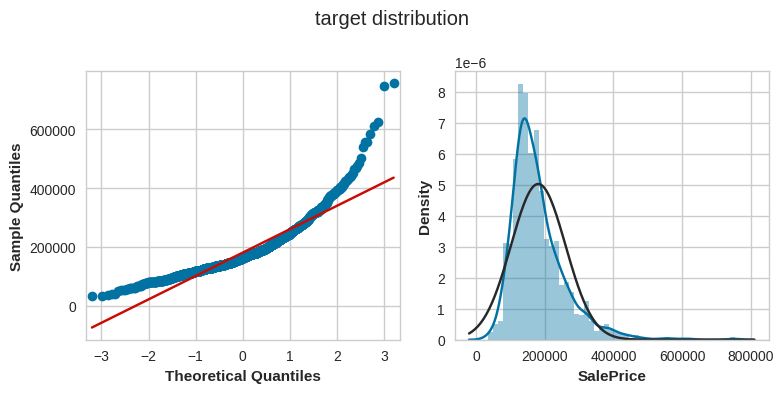

In [19]:
fig, ax = plt.subplots(1, 2, figsize=(8, 4))
sm.qqplot(y, line='s', ax=ax[0])
pd.options.mode.copy_on_write = False
sns.distplot(y, fit=scipy.stats.norm, ax=ax[1])
pd.options.mode.copy_on_write = True
fig.suptitle('target distribution')
fig.show()

In [20]:
# compare categories in train and test
# to detect categories in test missing from train, if any
for c in df_train.select_dtypes(include='category'):
    idx_train = df_train[c].cat.categories
    idx_test = df_test[c].cat.categories
    if not idx_train.equals(idx_test):
        print(f'different train/test categorical index: {c}')

# 4. <a id='toc4_'></a>[Start pipeline](#toc0_)

## 4.1. <a id='toc4_1_'></a>[Build pipeline functions and classes](#toc0_)

All functions and classes that are the building blocks for the pipeline and the models.

In [21]:
class SKPipeDataViewer(BaseEstimator, TransformerMixin):
    """
    Print out the X dataframe within the pipeline.
    """

    def __init__(self, show_dtypes=False, show_na=False, head_only=True, **kwargs):
        super().__init__(**kwargs)
        self.show_dtypes = show_dtypes
        self.show_na = show_na
        self.head_only = head_only
        for k, v in kwargs.items():
            setattr(self, k, v)

    def transform(self, X):
        self.dtypes = X.dtypes.to_dict()
        if self.head_only:
            display(X.head())
        else:
            display(X)
        if self.show_na == True:
            if self.head_only:
                print(X.isna().sum().sort_values(ascending=False).head())
            else:
                print(X.isna().sum().sort_values(ascending=False))
        if self.show_dtypes == True:
            pprint(self.dtypes, indent=2)
        return X

    def fit(self, X, y=None, **kwargs):
        return self

    def set_output(self, transform):
        pass


def make_impute_standardize_num_ohe_cat(ohe_drop=None):
    """
    Impute and standardize numeric features.
    One-hot encode categorical.
    Set ohe_drop='first' for plain linear models, if any.
    """
    steps_impute_num_ohe_cat = [
        (
            'impute_standardize_numeric',
            Pipeline(
                [
                    ('simple_imputer', SimpleImputer(strategy='mean')),
                    ('standard_scaler', StandardScaler()),
                ]
            ),
            make_column_selector(dtype_include='number'),
        ),
        (
            'one_hot_encode_categorical',
            OneHotEncoder(
                sparse_output=False,
                dtype=int,
                handle_unknown='infrequent_if_exist',
                min_frequency=1,
                drop=ohe_drop,
            ),
            make_column_selector(dtype_exclude='number'),
        ),
    ]
    impute_numeric_OHE_categorical = ColumnTransformer(
        steps_impute_num_ohe_cat,
        remainder='drop',
        n_jobs=1,
        verbose_feature_names_out=False,
    )
    impute_numeric_OHE_categorical.set_output(transform='pandas')
    return impute_numeric_OHE_categorical


def make_impute_num_ohe_cat_standardize(ohe_drop=None):
    """
    Impute numeric. One-hot encode categorical.
    Standardize the output.
    Set ohe_drop='first' for plain linear models, if any.
    """
    steps_impute_num_ohe_cat = [
        (
            'impute_numeric',
            SimpleImputer(strategy='mean'),
            make_column_selector(dtype_include='number'),
        ),
        (
            'one_hot_encode_categorical',
            OneHotEncoder(
                sparse_output=False,
                dtype=int,
                handle_unknown='infrequent_if_exist',
                min_frequency=1,
                drop=ohe_drop,
            ),
            make_column_selector(dtype_exclude='number'),
        ),
    ]
    impute_numeric_OHE_categorical = ColumnTransformer(
        steps_impute_num_ohe_cat,
        remainder='drop',
        n_jobs=1,
        verbose_feature_names_out=False,
    )
    impute_numeric_OHE_categorical_standardize = Pipeline(
        [
            ('impute_numeric_OHE_categorical', impute_numeric_OHE_categorical),
            ('standard_scaler', StandardScaler()),
        ]
    )
    impute_numeric_OHE_categorical_standardize.set_output(transform='pandas')
    return impute_numeric_OHE_categorical_standardize


def rebuild_xgboost(pipe_preproc, model_args={'random_state': 0, 'verbosity': 0, 'n_jobs': 1}):
    # xgboost performs worse with undecoded categories
    steps = [
        ('preprocessing', pipe_preproc),
        ('categorical_to_numeric', FunctionTransformer(func=cat_to_num)),
        ('xgboost', XGBRegressor(**model_args)),
    ]
    pipe = Pipeline(steps=steps, verbose=False)
    pipe.set_output(transform='pandas')
    return pipe


def rebuild_lgbm(pipe_preproc, model_args={'random_state': 0, 'n_jobs': 1, 'verbose': -1}):
    # lgbm can take categorical features, NaN-riddled features, etc.
    steps = [
        ('preprocessing', pipe_preproc),
        ('lgbm', LGBMRegressor(**model_args)),
    ]
    pipe = Pipeline(steps=steps, verbose=False)
    pipe.set_output(transform='pandas')
    return pipe


def rebuild_catboost(
    pipe_preproc,
    model_args={'random_state': 0, 'logging_level': 'Silent', 'thread_count': 1},
):
    steps = [
        ('preprocessing', pipe_preproc),
        ('categorical_to_numeric', FunctionTransformer(func=cat_to_num)),
        ('catboost', CatBoostRegressor(**model_args)),
    ]
    pipe = Pipeline(steps=steps, verbose=False)
    pipe.set_output(transform='pandas')
    return pipe


def rebuild_ridge(pipe_preproc, model_args={'random_state': 0}):
    steps = [
        ('preprocessing', pipe_preproc),
        (
            'impute_standardize_numeric_OHE_categorical',
            make_impute_standardize_num_ohe_cat(),
        ),
        # Ridge benefits from a transformed target
        (
            'ridge',
            TransformedTargetRegressor(
                regressor=Ridge(**model_args),
                transformer=QuantileTransformer(output_distribution='normal', random_state=0),
            ),
        ),
    ]
    pipe = Pipeline(steps=steps, verbose=False)
    pipe.set_output(transform='pandas')
    return pipe


def rebuild_enet(pipe_preproc, model_args={'random_state': 0, 'max_iter': 10000}):
    steps = [
        ('preprocessing', pipe_preproc),
        (
            'impute_numeric_OHE_categorical_standardize',
            make_impute_num_ohe_cat_standardize(),
        ),
        # ElasticNet performs worse with a transformed target
        ('enet', ElasticNet(**model_args)),
    ]
    pipe = Pipeline(steps=steps, verbose=False)
    pipe.set_output(transform='pandas')
    return pipe


def rebuild_all_pipelines(steps_preproc):
    """
    Return two objects:
    - the base (preproc) pipeline with steps from the argument
    - a dictionary with all the model pipelines
    """
    # placeholder for steps added later
    pipe_preproc = Pipeline(steps=steps_preproc, verbose=False)
    pipe_preproc.set_output(transform='pandas')

    pipe = {}
    pipe['xgboost'] = rebuild_xgboost(pipe_preproc)
    pipe['lgbm'] = rebuild_lgbm(pipe_preproc)
    pipe['catboost'] = rebuild_catboost(pipe_preproc)
    pipe['ridge'] = rebuild_ridge(pipe_preproc)
    pipe['enet'] = rebuild_enet(pipe_preproc)

    return pipe_preproc, pipe

## 4.2. <a id='toc4_2_'></a>[Build performance testing functions](#toc0_)

Functions that will be used to evaluate model performance.

In [22]:
def test_performance(pipe, X, y, n_splits=num_folds, n_jobs=cpu_count):
    """
    pipe: a pipeline containing a model

    Returns model performance.
    """
    cv = KFold(n_splits=n_splits, shuffle=False)
    scores = cross_val_score(
        pipe,
        X,
        y,
        cv=cv,
        verbose=0,
        n_jobs=n_jobs,
        error_score='raise',
        scoring=make_scorer(mean_squared_log_error, squared=False),
    )
    return np.mean(scores)


def test_all_models(test_name, pipe, X, y, n_splits=num_folds, n_jobs=cpu_count):
    """
    test_name: generic name for the test being run
    pipe: a dictionary with keys for model names, and values for pipelines with models

    If TEST_PIPELINES=True, all models are tested, performance is saved to disk.
    If TEST_PIPELINES=False, performance is read from disk and displayed (no tests are run).
    """
    perf_dir = 'performance_files'
    if not os.path.isdir(perf_dir):
        os.makedirs(perf_dir)
    if TEST_PIPELINES:
        # persist results to disk
        name_len_max = max([len(n) for n in pipe.keys()])
        with open(perf_dir + '/performance_' + test_name + '.txt', 'w') as perf_file:
            for model_name in tqdm(pipe.keys()):
                mean_score = test_performance(
                    pipe[model_name],
                    X,
                    y,
                    n_splits=n_splits,
                    n_jobs=n_jobs,
                )
                print(
                    f'{model_name.ljust(name_len_max, " ")} {str(mean_score)}',
                    file=perf_file,
                )
            # tqdm bug
            time.sleep(0.1)
    # read results from disk and display them
    print(test_name)
    with open(perf_dir + '/performance_' + test_name + '.txt', 'r') as perf_file:
        print(perf_file.read())


def submission_file_name(model_name, test_name):
    sub_dir = 'submission_files'
    if not os.path.isdir(sub_dir):
        os.makedirs(sub_dir)
    return sub_dir + '/submission_' + model_name + '_' + test_name + '.csv'


def make_submission(model, model_name, X_train, y_train, X_test, test_name):
    X_train = X_train.copy()
    y_train = y_train.copy()
    X_test = X_test.copy()
    model.fit(X_train, y_train)
    predictions = model.predict(X_test)
    # predictions = np.expm1(predictions)
    output = pd.DataFrame({'Id': X_test.index, 'SalePrice': predictions})
    sf = submission_file_name(model_name, test_name)
    output.to_csv(sf, index=False)
    print(f'file created {sf}')


def make_submission_all(pipe, X_train, y_train, X_test, test_name):
    if TEST_PIPELINES:
        for model_name in pipe.keys():
            make_submission(pipe[model_name], model_name, X_train, y_train, X_test, test_name)

In [23]:
steps_preproc = [
    ('passthrough', 'passthrough'),
    # ('pdv', SKPipeDataViewer()),
]

pipe_preproc, pipe = rebuild_all_pipelines(steps_preproc)

for k in list(pipe.keys()):
    display(pipe[k])

/home/florin/.local/lib/python3.11/site-packages/sklearn/preprocessing/_function_transformer.py:345: UserWarning: With transform="pandas", `func` should return a DataFrame to follow the set_output API.
  warnings.warn(


Pipeline(steps=[('preprocessing',
                 Pipeline(steps=[('passthrough', 'passthrough')])),
                ('categorical_to_numeric',
                 FunctionTransformer(func=<function cat_to_num at 0x7ff036d65bc0>)),
                ('xgboost',
                 XGBRegressor(base_score=None, booster=None, callbacks=None,
                              colsample_bylevel=None, colsample_bynode=None,
                              colsample_bytree=None, early_stopping_rounds=None,
                              enable_categoric...
                              feature_types=None, gamma=None, gpu_id=None,
                              grow_policy=None, importance_type=None,
                              interaction_constraints=None, learning_rate=None,
                              max_bin=None, max_cat_threshold=None,
                              max_cat_to_onehot=None, max_delta_step=None,
                              max_depth=None, max_leaves=None,
                              min_child_weight=None, missing=nan,
                              monotone_constraints=None, n_estimators=100,
                              n_jobs=1, num_parallel_tree=None, predictor=None,
                              random_state=0, ...))])

Pipeline(steps=[('preprocessing',
                 Pipeline(steps=[('passthrough', 'passthrough')])),
                ('lgbm', LGBMRegressor(n_jobs=1, random_state=0, verbose=-1))])

Pipeline(steps=[('preprocessing',
                 Pipeline(steps=[('passthrough', 'passthrough')])),
                ('categorical_to_numeric',
                 FunctionTransformer(func=<function cat_to_num at 0x7ff036d65bc0>)),
                ('catboost',
                 <catboost.core.CatBoostRegressor object at 0x7ff00f343590>)])

Pipeline(steps=[('preprocessing',
                 Pipeline(steps=[('passthrough', 'passthrough')])),
                ('impute_standardize_numeric_OHE_categorical',
                 ColumnTransformer(n_jobs=1,
                                   transformers=[('impute_standardize_numeric',
                                                  Pipeline(steps=[('simple_imputer',
                                                                   SimpleImputer()),
                                                                  ('standard_scaler',
                                                                   StandardScaler())]),
                                                  <sklearn.compose._column_transformer.make_column_selector obje...
                                                  OneHotEncoder(dtype=<class 'int'>,
                                                                handle_unknown='infrequent_if_exist',
                                                                min_frequency=1,
                                                                sparse_output=False),
                                                  <sklearn.compose._column_transformer.make_column_selector object at 0x7ff0073edd10>)],
                                   verbose_feature_names_out=False)),
                ('ridge',
                 TransformedTargetRegressor(regressor=Ridge(random_state=0),
                                            transformer=QuantileTransformer(output_distribution='normal',
                                                                            random_state=0)))])

Pipeline(steps=[('preprocessing',
                 Pipeline(steps=[('passthrough', 'passthrough')])),
                ('impute_numeric_OHE_categorical_standardize',
                 Pipeline(steps=[('impute_numeric_OHE_categorical',
                                  ColumnTransformer(n_jobs=1,
                                                    transformers=[('impute_numeric',
                                                                   SimpleImputer(),
                                                                   <sklearn.compose._column_transformer.make_column_selector object at 0x7ff007374210>),
                                                                  ('one_hot_encode_categorical',
                                                                   OneHotEncoder(dtype=<class 'int'>,
                                                                                 handle_unknown='infrequent_if_exist',
                                                                                 min_frequency=1,
                                                                                 sparse_output=False),
                                                                   <sklearn.compose._column_transformer.make_column_selector object at 0x7ff0073dee50>)],
                                                    verbose_feature_names_out=False)),
                                 ('standard_scaler', StandardScaler())])),
                ('enet', ElasticNet(max_iter=10000, random_state=0))])

# 5. <a id='toc5_'></a>[Baseline score with pipeline](#toc0_)

Check performance for baseline models before creating any features or optimizing any models.

In [24]:
# whether to actually re-run all performance tests
# if False, simply display most recent results
TEST_PIPELINES = False

In [25]:
features_to_drop = []

steps_preproc = [
    ('passthrough', 'passthrough'),
    # ('pdv', SKPipeDataViewer()),
]

pipe_preproc, pipe = rebuild_all_pipelines(steps_preproc)
test_all_models('baseline', pipe, X, y)

baseline
xgboost  0.1362956720421577
lgbm     0.1285616308772774
catboost 0.11849045145088107
ridge    0.1350399777015928
enet     0.1369316049020572



In [26]:
make_submission_all(pipe, X, y, X_test, 'baseline')

# 6. <a id='toc6_'></a>[Ensemble regression baseline](#toc0_)

Check performance for ensemble models (voting / stacking).

## 6.1. <a id='toc6_1_'></a>[Voting regressor](#toc0_)

In [27]:
vr = VotingRegressor(
    estimators=[('pipe_' + m, pipe[m]) for m in pipe.keys()],
    n_jobs=1,
)

test_all_models(
    'VotingRegressor_baseline',
    {'VotingRegressor': vr},
    X,
    y,
    n_splits=num_folds,
    n_jobs=cpu_count,
)

VotingRegressor_baseline
VotingRegressor 0.11698648818353263



In [28]:
make_submission_all({'VotingRegressor': vr}, X, y, X_test, 'VotingRegressor_baseline')

## 6.2. <a id='toc6_2_'></a>[Stacking regressors](#toc0_)

In [29]:
sr_fe_pipe_ridgecv = Pipeline(
    [
        ('standard_scaler', StandardScaler()),
        ('ridgecv', RidgeCV()),
    ]
)

sr_ridge = StackingRegressor(
    estimators=[('pipe_' + m, pipe[m]) for m in pipe.keys()],
    final_estimator=sr_fe_pipe_ridgecv,
    cv=KFold(n_splits=num_folds, shuffle=False),
    n_jobs=1,
)

sr_fe_pipe_lassocv = Pipeline(
    [
        ('standard_scaler', StandardScaler()),
        ('lassocv', LassoCV(n_jobs=1, random_state=0)),
    ]
)

sr_lasso = StackingRegressor(
    estimators=[('pipe_' + m, pipe[m]) for m in pipe.keys()],
    final_estimator=sr_fe_pipe_lassocv,
    cv=KFold(n_splits=num_folds, shuffle=False),
    n_jobs=1,
)

sr_fe_pipe_enetcv = Pipeline(
    [
        # poor performance with SS enabled
        # ('standard_scaler', StandardScaler()),
        ('enetcv', ElasticNetCV(n_jobs=1, random_state=0)),
    ]
)

sr_enet = StackingRegressor(
    estimators=[('pipe_' + m, pipe[m]) for m in pipe.keys()],
    final_estimator=sr_fe_pipe_enetcv,
    cv=KFold(n_splits=num_folds, shuffle=False),
    n_jobs=1,
)

sr_fe_pipe_knnr = Pipeline(
    [
        ('standard_scaler', StandardScaler()),
        ('knnregressor', KNeighborsRegressor(n_jobs=1)),
    ]
)

sr_knn = StackingRegressor(
    estimators=[('pipe_' + m, pipe[m]) for m in pipe.keys()],
    final_estimator=sr_fe_pipe_knnr,
    cv=KFold(n_splits=num_folds, shuffle=False),
    n_jobs=1,
)

sr_fe_pipe_mlpr = Pipeline(
    [
        ('standard_scaler', StandardScaler()),
        (
            'transformed_target_mlpregressor',
            TransformedTargetRegressor(
                regressor=MLPRegressor(random_state=0),
                transformer=QuantileTransformer(output_distribution='normal', random_state=0),
            ),
        ),
    ]
)

sr_mlpr = StackingRegressor(
    estimators=[('pipe_' + m, pipe[m]) for m in pipe.keys()],
    final_estimator=sr_fe_pipe_mlpr,
    cv=KFold(n_splits=num_folds, shuffle=False),
    n_jobs=1,
)

test_all_models(
    'StackingRegressor_baseline',
    {
        'StackingRegressor_Ridge': sr_ridge,
        'StackingRegressor_Lasso': sr_lasso,
        'StackingRegressor_ENet': sr_enet,
        'StackingRegressor_KNN': sr_knn,
        'StackingRegressor_MLPRegressor': sr_mlpr,
    },
    X,
    y,
    n_splits=num_folds,
    n_jobs=cpu_count,
)

StackingRegressor_baseline
StackingRegressor_Ridge        0.11854964144139617
StackingRegressor_Lasso        0.11942221026912289
StackingRegressor_ENet         0.11852654308298499
StackingRegressor_KNN          0.12415051057307841
StackingRegressor_MLPRegressor 0.1213023628997334



In [30]:
sr_ridge = StackingRegressor(
    estimators=[('pipe_' + m, pipe[m]) for m in pipe.keys()],
    final_estimator=sr_fe_pipe_ridgecv,
    cv=KFold(n_splits=num_folds, shuffle=False),
    n_jobs=cpu_count,
)

sr_lasso = StackingRegressor(
    estimators=[('pipe_' + m, pipe[m]) for m in pipe.keys()],
    final_estimator=sr_fe_pipe_lassocv,
    cv=KFold(n_splits=num_folds, shuffle=False),
    n_jobs=cpu_count,
)

sr_enet = StackingRegressor(
    estimators=[('pipe_' + m, pipe[m]) for m in pipe.keys()],
    final_estimator=sr_fe_pipe_enetcv,
    cv=KFold(n_splits=num_folds, shuffle=False),
    n_jobs=cpu_count,
)

sr_knn = StackingRegressor(
    estimators=[('pipe_' + m, pipe[m]) for m in pipe.keys()],
    final_estimator=sr_fe_pipe_knnr,
    cv=KFold(n_splits=num_folds, shuffle=False),
    n_jobs=cpu_count,
)

sr_mlpr = StackingRegressor(
    estimators=[('pipe_' + m, pipe[m]) for m in pipe.keys()],
    final_estimator=sr_fe_pipe_mlpr,
    cv=KFold(n_splits=num_folds, shuffle=False),
    n_jobs=cpu_count,
)

make_submission_all(
    {
        'StackingRegressor_Ridge': sr_ridge,
        'StackingRegressor_Lasso': sr_lasso,
        'StackingRegressor_ENet': sr_enet,
        'StackingRegressor_KNN': sr_knn,
        'StackingRegressor_MLPRegressor': sr_mlpr,
    },
    X,
    y,
    X_test,
    'StackingRegressor_baseline',
)

# 7. <a id='toc7_'></a>[Log-transform skewed numeric features](#toc0_)

Some numeric features have skewed distributions. Log-transform them and test model performance.

log_transform
xgboost  0.13506784578614034
lgbm     0.1286483077106619
catboost 0.11837461919873822
ridge    0.12753219857904963
enet     0.13929755320744852



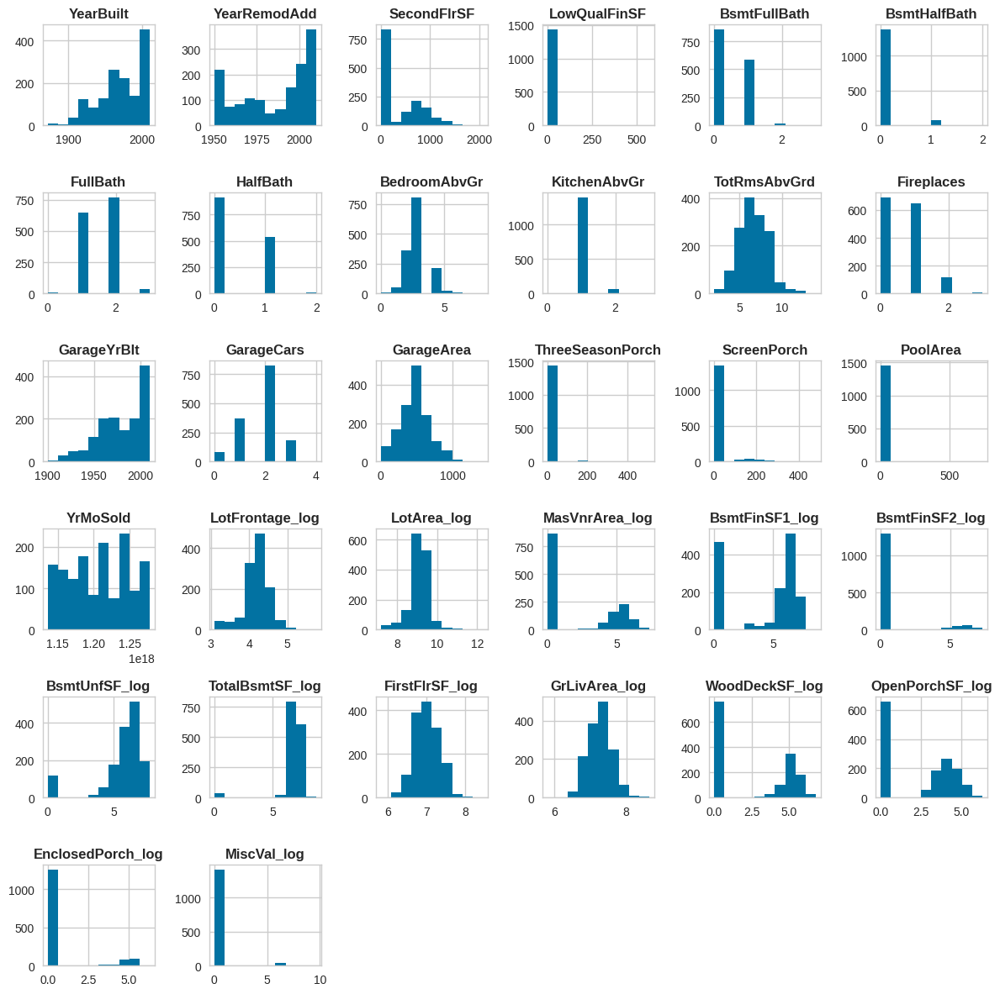

In [31]:
def compute_log(X, features, drop_original=True):
    X = X.copy()
    for c in features:
        X[c + '_log'] = np.log1p(X[c])
    if drop_original:
        X.drop(columns=features, inplace=True)
    return X


def make_steps_log_transform(features, drop_now=False, enable=True):
    if enable:
        steps = [
            (
                'log_transform',
                FunctionTransformer(
                    func=compute_log,
                    kw_args={'features': features, 'drop_original': drop_now},
                ),
            )
        ]
        drop_features = features
    else:
        steps = []
        drop_features = []
    return steps, drop_features


log_transform_features = [
    'LotFrontage',
    'LotArea',
    'MasVnrArea',
    'BsmtFinSF1',
    'BsmtFinSF2',
    'BsmtUnfSF',
    'TotalBsmtSF',
    'FirstFlrSF',
    'GrLivArea',
    'WoodDeckSF',
    'OpenPorchSF',
    'EnclosedPorch',
    'MiscVal',
]


# in the final version, original features will not be dropped here
# we will collect features to drop, and drop them at the end of the pipeline
steps_preproc, _ = make_steps_log_transform(log_transform_features, drop_now=True, enable=True)

pipe_preproc, pipe = rebuild_all_pipelines(steps_preproc)
# pipe_preproc
# pipe_preproc.fit_transform(X, y)
_ = pipe_preproc.fit_transform(X[features_numeric], y).hist(figsize=(12, 12))
test_all_models('log_transform', pipe, X, y)

# 8. <a id='toc8_'></a>[Quantile-transform numeric features](#toc0_)

`PowerTransformer()` bug, cannot use it.

https://github.com/scikit-learn/scikit-learn/issues/23319

Quantile transformer will bring all numeric features into similar ranges of values (and normalize them as a bonus).

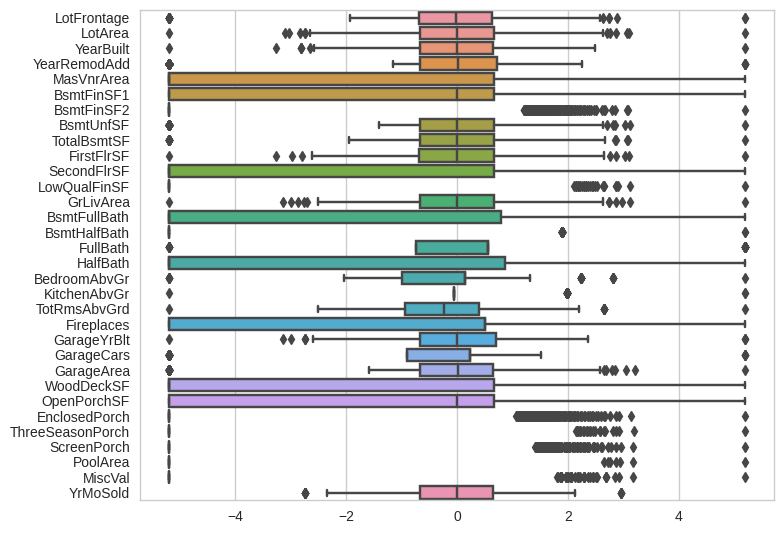

In [32]:
pt = PowerTransformer(method='yeo-johnson', standardize=True, copy=True)
pt.set_output(transform='pandas')

qt = QuantileTransformer(output_distribution='normal', random_state=0)
qt.set_output(transform='pandas')

pd.options.mode.copy_on_write = False
sns.boxplot(qt.fit_transform(X[features_numeric]), orient='h')
pd.options.mode.copy_on_write = True

In [33]:
def make_steps_numeric_quantile_transformer(enable=True):
    if enable:
        ct_qt = ColumnTransformer(
            [
                (
                    'quantile_transformer',
                    QuantileTransformer(output_distribution='normal', random_state=0),
                    features_numeric,
                ),
            ],
            remainder='passthrough',
            n_jobs=1,
            verbose_feature_names_out=False,
        )
        steps = [('numeric_quantile_transformer', ct_qt)]
    else:
        steps = []
    drop_features = []
    return steps, drop_features


steps_preproc, _ = make_steps_numeric_quantile_transformer(enable=True)

pipe_preproc, pipe = rebuild_all_pipelines(steps_preproc)
# pipe_preproc.fit_transform(X, y)
test_all_models('numeric_quantile_transformer', pipe, X, y)

numeric_quantile_transformer
xgboost  0.137896618743097
lgbm     0.12744108790205297
catboost 0.11915351689825118
ridge    0.1290901148937026
enet     0.14338826663446375



/home/florin/.local/lib/python3.11/site-packages/sklearn/preprocessing/_function_transformer.py:345: UserWarning: With transform="pandas", `func` should return a DataFrame to follow the set_output API.
  warnings.warn(


In [34]:
make_submission_all(pipe, X, y, X_test, 'normalize_features')

# 9. <a id='toc9_'></a>[PCA for outliers](#toc0_)

Look for outliers in PCA space, add outlier info as a feature to the dataset.

## 9.1. <a id='toc9_1_'></a>[Check for outliers in PCA space](#toc0_)

In [35]:
steps_outlier_pca = [('impute_num_ohe_cat_standard', make_impute_standardize_num_ohe_cat())]

pipe_outlier_pca = Pipeline(steps=steps_outlier_pca, verbose=False)
pipe_outlier_pca.set_output(transform='pandas')

pca_model = pca_obj(
    n_components=0.95,
    random_state=0,
    verbose=2,
)
X_for_pca = pipe_outlier_pca.fit_transform(X)
# display(X_for_pca)
pca_results = pca_model.fit_transform(X_for_pca)
display(pca_results['outliers'])
# display(pca_results['PC'])
# display(pca_results['explained_var'])

,y_proba,p_raw,y_score,y_bool,y_bool_spe,y_score_spe
1,1.000000,1.000000,91.480418,False,False,2.293311
2,1.000000,0.943230,149.185965,False,False,1.226769
3,1.000000,1.000000,91.372478,False,False,2.642532
4,1.000000,0.481874,178.190867,False,False,1.844994
5,1.000000,0.999613,121.341461,False,False,5.054902
...,...,...,...,...,...,...
1456,1.000000,1.000000,85.433656,False,False,1.938461
1457,1.000000,0.971802,143.797092,False,False,2.148554
1458,0.378591,0.040172,212.324863,False,False,3.279412
1459,0.050034,0.003667,232.714853,False,False,3.658729


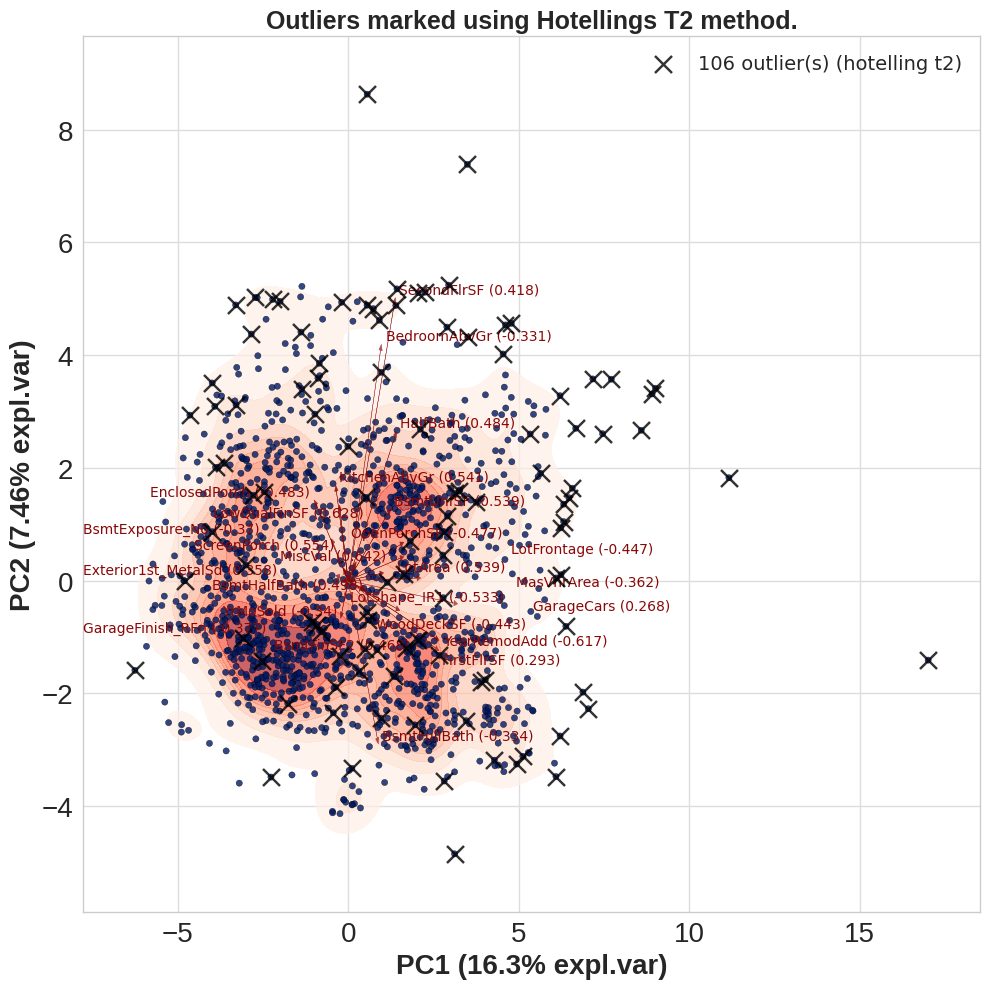

In [36]:
pd.options.mode.copy_on_write = False
# TODO: make this image smaller
pca_model.biplot(
    SPE=False,
    HT2=True,
    density=True,
    title='Outliers marked using Hotellings T2 method.',
    figsize=(10, 10),
    fontsize=10,
    s=20,
)
pd.options.mode.copy_on_write = True

## 9.2. <a id='toc9_2_'></a>[Check performance with PCA outliers scored](#toc0_)

A new feature will be created, containing the PCA outlier score for each observation.

In [37]:
class pcaPandas(pca_obj):
    """
    Determine outliers in PCA space. Return outlier score.
    """

    def transform(self, X):
        X = X.copy()
        pca_transform = super().transform(X, verbose=0)
        output = super().compute_outliers(pca_transform, verbose=0)
        output = np.array(output[0]['y_score'].astype(float))
        if hasattr(self, 'output_format'):
            if self.output_format == 'pandas':
                output = pd.DataFrame({'PCA_outlier_score': output}, index=X.index)
        return output

    def fit_transform(self, X, y=None):
        X = X.copy()
        output = np.array(super().fit_transform(X, verbose=0)['outliers']['y_score'].astype(float))
        if hasattr(self, 'output_format'):
            if self.output_format == 'pandas':
                output = pd.DataFrame({'PCA_outlier_score': output}, index=X.index)
        return output

    def set_output(self, transform=None):
        if transform == 'pandas':
            self.output_format = 'pandas'
        pass


def make_steps_pca_outliers_score(min_explained_variation=0.95, pca_score_distribution='uniform', var_cutoff=0.1):
    """
    min_explained_variation: [0.0, 1.0]
    pca_score_distribution: 'uniform', 'normal'
    var_cutoff: minimum explained variation that will be considered at all

    min_explained_variation < 0.1 means disabled
    min_explained_variation is actually cumulative
    """

    # work around a quirk in the original parameter values
    # (same parameter means many things in the original object)
    mev = min_explained_variation
    if min_explained_variation == 1.0:
        mev = None

    # enforce a low cutoff
    if min_explained_variation >= var_cutoff:
        pca_model = pcaPandas(
            n_components=mev,
            random_state=0,
            verbose=0,
        )
        steps = [
            (
                'mark_pca_outliers',
                ColumnTransformer(
                    [
                        (
                            'mark_pca_outliers',
                            Pipeline(
                                [
                                    (
                                        'impute_num_ohe_cat_standard',
                                        make_impute_standardize_num_ohe_cat(),
                                    ),
                                    ('pca_model', pca_model),
                                    (
                                        'standard_scaler_out',
                                        QuantileTransformer(
                                            output_distribution=pca_score_distribution,
                                            random_state=0,
                                        ),
                                    ),
                                ]
                            ),
                            make_column_selector(dtype_exclude=None),
                        ),
                        (
                            'passthrough_original_features',
                            'passthrough',
                            make_column_selector(dtype_exclude=None),
                        ),
                    ],
                    remainder='drop',
                    verbose_feature_names_out=False,
                ),
            ),
        ]
    else:
        steps = []
    drop_features = []
    return steps, drop_features


steps_preproc, _ = make_steps_pca_outliers_score()

pipe_preproc, pipe = rebuild_all_pipelines(steps_preproc)
display(pipe_preproc)
display(pipe_preproc.fit_transform(X, y))
# _ = pipe_preproc.fit(X, y)
# pipe_preproc.transform(X_test)
test_all_models('pca_outliers_score', pipe, X, y)

/home/florin/.local/lib/python3.11/site-packages/sklearn/preprocessing/_function_transformer.py:345: UserWarning: With transform="pandas", `func` should return a DataFrame to follow the set_output API.
  warnings.warn(


Pipeline(steps=[('mark_pca_outliers',
                 ColumnTransformer(transformers=[('mark_pca_outliers',
                                                  Pipeline(steps=[('impute_num_ohe_cat_standard',
                                                                   ColumnTransformer(n_jobs=1,
                                                                                     transformers=[('impute_standardize_numeric',
                                                                                                    Pipeline(steps=[('simple_imputer',
                                                                                                                     SimpleImputer()),
                                                                                                                    ('standard_scaler',
                                                                                                                     StandardScaler())]),
                                                                                                    <sklearn.compose._column_transformer.make_column_sel...
                                                                   <__main__.pcaPandas object at 0x7ff039906f50>),
                                                                  ('standard_scaler_out',
                                                                   QuantileTransformer(random_state=0))]),
                                                  <sklearn.compose._column_transformer.make_column_selector object at 0x7ff020f3e3d0>),
                                                 ('passthrough_original_features',
                                                  'passthrough',
                                                  <sklearn.compose._column_transformer.make_column_selector object at 0x7ff039513350>)],
                                   verbose_feature_names_out=False))])

,PCA_outlier_score,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,ThreeSeasonPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,SaleType,SaleCondition,YrMoSold
Id,,,,,,,,,,,,,,,,,,,,,
1,0.013569,60,RL,65.0,8450.0,Pave,NaN,Reg,Lvl,AllPub,...,0.0,0.0,0.0,NaN,NaN,NaN,0.0,WD,Normal,1201824000000000000
2,0.620547,20,RL,80.0,9600.0,Pave,NaN,Reg,Lvl,AllPub,...,0.0,0.0,0.0,NaN,NaN,NaN,0.0,WD,Normal,1177977600000000000
3,0.013017,60,RL,68.0,11250.0,Pave,NaN,IR1,Lvl,AllPub,...,0.0,0.0,0.0,NaN,NaN,NaN,0.0,WD,Normal,1220227200000000000
4,0.803558,70,RL,60.0,9550.0,Pave,NaN,IR1,Lvl,AllPub,...,0.0,0.0,0.0,NaN,NaN,NaN,0.0,WD,Abnorml,1138752000000000000
5,0.305013,60,RL,84.0,14260.0,Pave,NaN,IR1,Lvl,AllPub,...,0.0,0.0,0.0,NaN,NaN,NaN,0.0,WD,Normal,1228089600000000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1456,0.000540,60,RL,62.0,7917.0,Pave,NaN,Reg,Lvl,AllPub,...,0.0,0.0,0.0,NaN,NaN,NaN,0.0,WD,Normal,1185926400000000000
1457,0.567560,20,RL,85.0,13175.0,Pave,NaN,Reg,Lvl,AllPub,...,0.0,0.0,0.0,NaN,MnPrv,NaN,0.0,WD,Normal,1264982400000000000
1458,0.894904,70,RL,66.0,9042.0,Pave,NaN,Reg,Lvl,AllPub,...,0.0,0.0,0.0,NaN,GdPrv,Shed,2500.0,WD,Normal,1272672000000000000


pca_outliers_score
xgboost  0.13640358303132188
lgbm     0.1269576028075965
catboost 0.11801030171803623
ridge    0.13509691455271353
enet     0.1373180979968887



# 10. <a id='toc10_'></a>[Mutual information](#toc0_)

## 10.1. <a id='toc10_1_'></a>[Check feature/target MI scores](#toc0_)

In [38]:
steps_preproc = [
    (
        'impute_numeric_decode_categorical',
        ColumnTransformer(
            [
                (
                    'impute_numeric',
                    IterativeImputer(random_state=0),
                    make_column_selector(dtype_include='number'),
                ),
                (
                    'decode_categorical',
                    FunctionTransformer(func=cat_to_num),
                    make_column_selector(dtype_exclude='number'),
                ),
            ],
            remainder='passthrough',
            verbose_feature_names_out=False,
        ),
    ),
]

pipe_preproc, pipe = rebuild_all_pipelines(steps_preproc)

# pipe_preproc
# pipe_preproc.fit_transform(X)

mi_scores = make_mi_scores(pipe_preproc.fit_transform(X), y)
mi_scores.tail(30)

/home/florin/.local/lib/python3.11/site-packages/sklearn/preprocessing/_function_transformer.py:345: UserWarning: With transform="pandas", `func` should return a DataFrame to follow the set_output API.
  warnings.warn(


Fence               0.050665
Electrical          0.043887
BsmtFinType2        0.039734
LandContour         0.035137
ExterCond           0.034941
BsmtCond            0.034163
BsmtFullBath        0.031220
BsmtHalfBath        0.028547
Alley               0.024762
KitchenAbvGr        0.020035
Heating             0.018472
EnclosedPorch       0.015764
LotConfig           0.014472
RoofStyle           0.012409
Condition1          0.011470
MiscFeature         0.010775
ScreenPorch         0.008822
Functional          0.007986
LowQualFinSF        0.007507
Condition2          0.006244
BsmtFinSF2          0.003878
RoofMatl            0.001923
Utilities           0.001381
ThreeSeasonPorch    0.000627
Street              0.000000
YrMoSold            0.000000
PoolQC              0.000000
MiscVal             0.000000
PoolArea            0.000000
LandSlope           0.000000
Name: MI Scores, dtype: float64

/home/florin/kaggle/feature_engineering/pipeline_pandas_utils.py:62: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


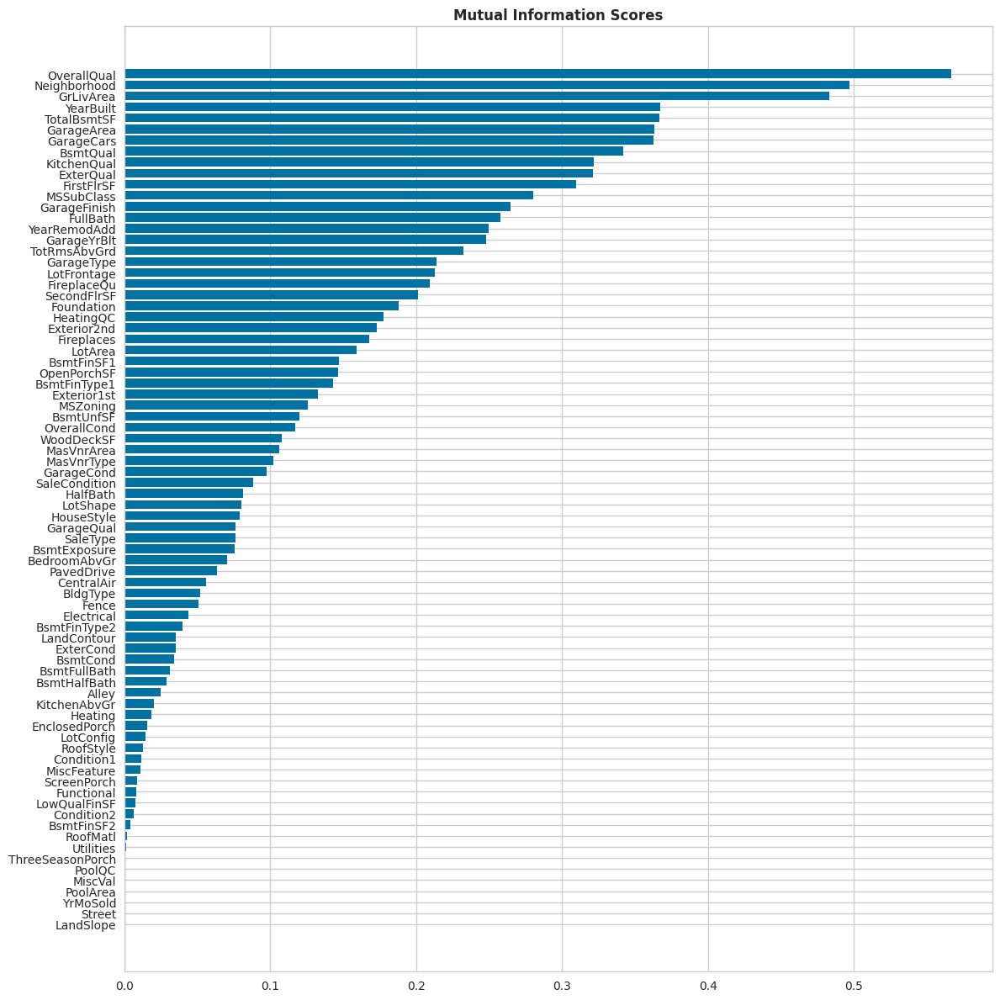

In [39]:
plot_mi_scores(mi_scores)

## 10.2. <a id='toc10_2_'></a>[Drop features with MI score below some threshold](#toc0_)

In [40]:
def drop_uninformative(X, mi_scores, min_score):
    X = X.copy()
    return X[mi_scores.index[mi_scores >= min_score].to_list()]


def make_steps_drop_uninformative(mi_scores, min_score=0.0001, drop_now=False):
    """
    disable: min_score=0.0
    """
    if drop_now and min_score > 0.0:
        # run as a standalone step, not in a big pipeline
        steps = [
            (
                'drop_uninformative',
                FunctionTransformer(
                    func=drop_uninformative,
                    kw_args={'mi_scores': mi_scores, 'min_score': min_score},
                ),
            )
        ]
        drop_features = mi_scores.index[mi_scores < min_score].to_list()
    else:
        if min_score > 0.0:
            # run as intermediate step in a larger pipeline
            # features are dropped at the end of the pipeline
            steps = [('drop_uninformative_later', 'passthrough')]
            drop_features = mi_scores.index[mi_scores < min_score].to_list()
        else:
            # intermediate step in a larger pipeline
            # but disabled
            steps = [('drop_uninformative_later', 'passthrough')]
            drop_features = []
    return steps, drop_features


min_score = 0.0001
steps_preproc, _ = make_steps_drop_uninformative(mi_scores=mi_scores, min_score=min_score, drop_now=True)
print(f'dropped features: {_}')
print()

# fix tqdm bug
time.sleep(0.1)

pipe_preproc, pipe = rebuild_all_pipelines(steps_preproc)
display(pipe_preproc.fit_transform(X, y))
test_all_models('drop_uninformative', pipe, X, y)

dropped features: ['Street', 'YrMoSold', 'PoolQC', 'MiscVal', 'PoolArea', 'LandSlope']



/home/florin/.local/lib/python3.11/site-packages/sklearn/preprocessing/_function_transformer.py:345: UserWarning: With transform="pandas", `func` should return a DataFrame to follow the set_output API.
  warnings.warn(


,OverallQual,Neighborhood,GrLivArea,YearBuilt,TotalBsmtSF,GarageArea,GarageCars,BsmtQual,KitchenQual,ExterQual,...,Condition1,MiscFeature,ScreenPorch,Functional,LowQualFinSF,Condition2,BsmtFinSF2,RoofMatl,Utilities,ThreeSeasonPorch
Id,,,,,,,,,,,,,,,,,,,,,
1,7,CollgCr,1710.0,2003.0,856.0,548.0,2.0,Gd,Gd,Gd,...,Norm,NaN,0.0,Typ,0.0,Norm,0.0,CompShg,AllPub,0.0
2,6,Veenker,1262.0,1976.0,1262.0,460.0,2.0,Gd,TA,TA,...,Feedr,NaN,0.0,Typ,0.0,Norm,0.0,CompShg,AllPub,0.0
3,7,CollgCr,1786.0,2001.0,920.0,608.0,2.0,Gd,Gd,Gd,...,Norm,NaN,0.0,Typ,0.0,Norm,0.0,CompShg,AllPub,0.0
4,7,Crawfor,1717.0,1915.0,756.0,642.0,3.0,TA,Gd,TA,...,Norm,NaN,0.0,Typ,0.0,Norm,0.0,CompShg,AllPub,0.0
5,8,NoRidge,2198.0,2000.0,1145.0,836.0,3.0,Gd,Gd,Gd,...,Norm,NaN,0.0,Typ,0.0,Norm,0.0,CompShg,AllPub,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1456,6,Gilbert,1647.0,1999.0,953.0,460.0,2.0,Gd,TA,TA,...,Norm,NaN,0.0,Typ,0.0,Norm,0.0,CompShg,AllPub,0.0
1457,6,NWAmes,2073.0,1978.0,1542.0,500.0,2.0,Gd,TA,TA,...,Norm,NaN,0.0,Min1,0.0,Norm,163.0,CompShg,AllPub,0.0
1458,7,Crawfor,2340.0,1941.0,1152.0,252.0,1.0,TA,Gd,Ex,...,Norm,Shed,0.0,Typ,0.0,Norm,0.0,CompShg,AllPub,0.0


drop_uninformative
xgboost  0.13448797551289685
lgbm     0.12835534176467855
catboost 0.11842801893224043
ridge    0.13393009886635232
enet     0.13439295721026112



# 11. <a id='toc11_'></a>[Mathematical transforms](#toc0_)

## 11.1. <a id='toc11_1_'></a>[Two or more features, combined mathematically](#toc0_)

In [41]:
def living_lot_ratio_feature(X):
    X = X.copy()
    X_new = pd.DataFrame(index=X.index)
    X_new["LivLotRatio"] = X['GrLivArea'] / X['LotArea']
    return X.join(X_new)


def spaciousness_feature(X):
    X = X.copy()
    X_new = pd.DataFrame(index=X.index)
    X_new["Spaciousness"] = (X['FirstFlrSF'] + X['SecondFlrSF']) / X['TotRmsAbvGrd']
    return X.join(X_new)


def total_outside_sf_feature(X, features):
    """
    Add square footage features.
    """
    X = X.copy()
    X_new = pd.DataFrame(index=X.index)
    X_new["TotalOutsideSF"] = 0.0
    for c in features:
        X_new["TotalOutsideSF"] += X[c]
    return X.join(X_new)


def outdoor_area_type_count(X, features):
    """
    create feature that describes how many kinds of outdoor areas a dwelling has
    """
    X = X.copy()
    X_new = pd.DataFrame()
    X_new["PorchTypes"] = X[features].gt(0.0).sum(axis=1)
    return X.join(X_new)


def make_steps_mathematical_transforms(
    enable_living_lot_ratio=True,
    enable_spaciousness=True,
    enable_outside_sf_features=True,
    enable_outdoor_area_type_count=True,
):
    outside_sf_features = [
        'WoodDeckSF',
        'OpenPorchSF',
        'EnclosedPorch',
        'ThreeSeasonPorch',
        'ScreenPorch',
    ]
    porch_features = [
        "WoodDeckSF",
        "OpenPorchSF",
        "EnclosedPorch",
        "ThreeSeasonPorch",
        "ScreenPorch",
    ]

    steps = []
    drop_features = []
    if enable_living_lot_ratio:
        steps += [('living_lot_ratio', FunctionTransformer(func=living_lot_ratio_feature))]
    if enable_spaciousness:
        steps += [('spaciousness', FunctionTransformer(func=spaciousness_feature))]
    if enable_outside_sf_features:
        steps += [
            (
                'outside_sf_features',
                FunctionTransformer(
                    func=total_outside_sf_feature,
                    kw_args={'features': outside_sf_features},
                ),
            )
        ]
    if enable_outdoor_area_type_count:
        steps += [
            (
                'outdoor_area_type_count',
                FunctionTransformer(func=outdoor_area_type_count, kw_args={'features': porch_features}),
            )
        ]

    return steps, drop_features


# each one will be selected independently during hyperparameter optimization
# dropping columns, if any, will happen at the end of the pipeline
steps_preproc, _ = make_steps_mathematical_transforms()

pipe_preproc, pipe = rebuild_all_pipelines(steps_preproc)
# pipe_preproc.fit_transform(X, y)
test_all_models('mathematical_transforms', pipe, X, y)

mathematical_transforms
xgboost  0.13524854842619866
lgbm     0.1272195075934009
catboost 0.11895582949591313
ridge    0.132938691129515
enet     0.13641504704995364



/home/florin/.local/lib/python3.11/site-packages/sklearn/preprocessing/_function_transformer.py:345: UserWarning: With transform="pandas", `func` should return a DataFrame to follow the set_output API.
  warnings.warn(


## 11.2. <a id='toc11_2_'></a>[Single feature transforms: area to linear](#toc0_)

Take square roots of area features.

In [42]:
def area_to_linear(X, t_columns):
    """
    Take square root of a numeric feature.
    """
    X = X.copy()
    for c in t_columns:
        X[c + 'ToLinear'] = np.sqrt(X[c])
    return X


def make_steps_area_to_linear(
    lot_area='enable',
    total_bsmt_sf='enable',
    first_flr_sf='enable',
    gr_liv_area='enable',
):
    steps = []
    drop_features = []
    if lot_area in ['enable_drop', 'enable']:
        steps += [
            (
                'area_to_linear_LotArea',
                FunctionTransformer(func=area_to_linear, kw_args={'t_columns': ['LotArea']}),
            )
        ]
        if lot_area == 'enable_drop':
            drop_features += ['LotArea']
    if total_bsmt_sf in ['enable_drop', 'enable']:
        steps += [
            (
                'area_to_linear_TotalBsmtSF',
                FunctionTransformer(func=area_to_linear, kw_args={'t_columns': ['TotalBsmtSF']}),
            )
        ]
        if total_bsmt_sf == 'enable_drop':
            drop_features += ['TotalBsmtSF']
    if first_flr_sf in ['enable_drop', 'enable']:
        steps += [
            (
                'area_to_linear_FirstFlrSF',
                FunctionTransformer(func=area_to_linear, kw_args={'t_columns': ['FirstFlrSF']}),
            )
        ]
        if first_flr_sf == 'enable_drop':
            drop_features += ['FirstFlrSF']
    if gr_liv_area in ['enable_drop', 'enable']:
        steps += [
            (
                'area_to_linear_GrLivArea',
                FunctionTransformer(func=area_to_linear, kw_args={'t_columns': ['GrLivArea']}),
            )
        ]
        if gr_liv_area == 'enable_drop':
            drop_features += ['GrLivArea']
    return steps, drop_features


steps_preproc, _ = make_steps_area_to_linear()
print(f'drop: {_}')
time.sleep(0.1)

pipe_preproc, pipe = rebuild_all_pipelines(steps_preproc)
# pipe_preproc.fit_transform(X, y)
test_all_models('area_to_linear', pipe, X, y)

drop: []
area_to_linear
xgboost  0.1362956720421577
lgbm     0.1285616308772774
catboost 0.11901901583192231
ridge    0.12810528192248716
enet     0.13590565572345223



# 12. <a id='toc12_'></a>[Coalesce complex feature categories into fewer / simpler categories](#toc0_)

```
MSSubClass: Identifies the type of dwelling involved in the sale.	

        20	1-STORY 1946 & NEWER ALL STYLES
        30	1-STORY 1945 & OLDER
        40	1-STORY W/FINISHED ATTIC ALL AGES
        45	1-1/2 STORY - UNFINISHED ALL AGES
        50	1-1/2 STORY FINISHED ALL AGES
        60	2-STORY 1946 & NEWER
        70	2-STORY 1945 & OLDER
        75	2-1/2 STORY ALL AGES
        80	SPLIT OR MULTI-LEVEL
        85	SPLIT FOYER
        90	DUPLEX - ALL STYLES AND AGES
       120	1-STORY PUD (Planned Unit Development) - 1946 & NEWER
       150	1-1/2 STORY PUD - ALL AGES
       160	2-STORY PUD - 1946 & NEWER
       180	PUD - MULTILEVEL - INCL SPLIT LEV/FOYER
       190	2 FAMILY CONVERSION - ALL STYLES AND AGES
```

In [43]:
def do_coalesce_mssubclass(X):
    X = X.copy()
    sc = X['MSSubClass'].astype(str)
    classes = {
        '20': 1,
        '30': 1,
        '40': 1,
        '45': 1,
        '50': 1,
        '60': 2,
        '70': 2,
        '75': 2,
        '80': 3,
        '85': 3,
        '90': 4,
        '120': 1,
        '150': 1,
        '160': 2,
        '180': 5,
        '190': 6,
    }
    sc = sc.replace(classes)
    X['MSClass'] = sc
    return X


def make_steps_coalesce_mssubclass(action='enable'):
    """
    action: 'disable', 'enable_drop', 'enable'
    """
    steps = []
    drop_features = []
    if action in ['enable_drop', 'enable']:
        steps += [('coalesce_mssubclass', FunctionTransformer(func=do_coalesce_mssubclass))]
    if action == 'enable_drop':
        drop_features += ['MSSubClass']
    return steps, drop_features


steps_preproc, _ = make_steps_coalesce_mssubclass()
print(f'drop: {_}')
time.sleep(0.1)

pipe_preproc, pipe = rebuild_all_pipelines(steps_preproc)
test_all_models('coalesce_mssubclass', pipe, X, y)

drop: []
coalesce_mssubclass
xgboost  0.13694397079904713
lgbm     0.12844654422256963
catboost 0.11845392386178624
ridge    0.13507635191339812
enet     0.1369613493191226



# 13. <a id='toc13_'></a>[Interactions](#toc0_)

Investigate potential interactions that may suggest new (helper) features.

## 13.1. <a id='toc13_1_'></a>[Interaction between GrLivArea and BldgType](#toc0_)

/home/florin/.local/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


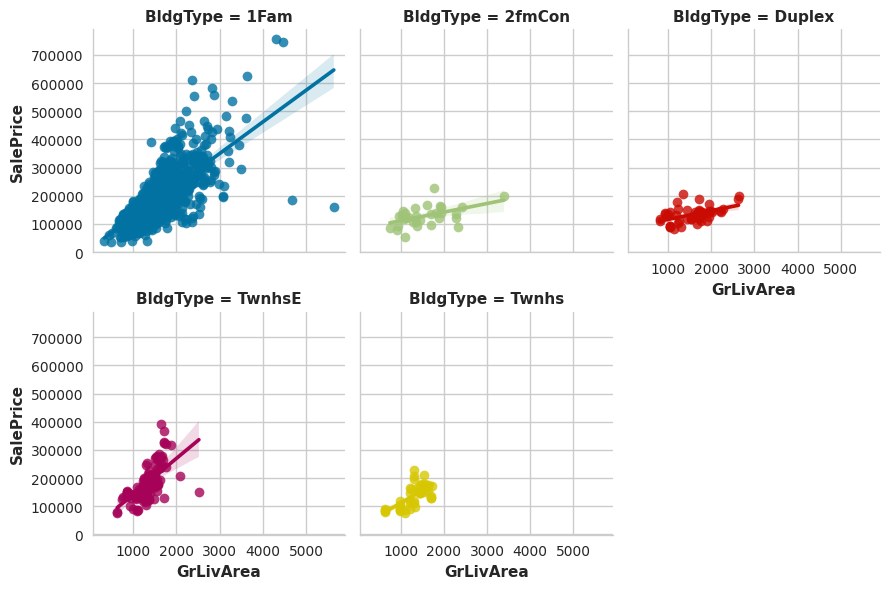

In [44]:
_ = sns.lmplot(
    x='GrLivArea',
    y="SalePrice",
    hue="BldgType",
    col="BldgType",
    data=df,
    scatter_kws={"edgecolor": 'w'},
    col_wrap=3,
    height=3,
)

In [45]:
def do_GrLivArea_BldgType_interaction(X):
    """
    dummy BldgType and multiply it by GrLivArea
    """
    X = X.copy()
    X_new = pd.get_dummies(df['BldgType'], prefix='Bldg', drop_first=True)
    X_new = X_new.mul(df['GrLivArea'], axis=0)
    return X.join(X_new)


def make_steps_GrLivArea_BldgType_interaction(action='enable'):
    steps = []
    drop_features = []
    if action in ['enable_drop', 'enable']:
        steps += [
            (
                'GrLivArea_BldgType_interaction',
                FunctionTransformer(func=do_GrLivArea_BldgType_interaction),
            )
        ]
    if action == 'enable_drop':
        drop_features += ['BldgType', 'GrLivArea']
    return steps, drop_features


steps_preproc, _ = make_steps_GrLivArea_BldgType_interaction()
print(f'drop: {_}')

pipe_preproc, pipe = rebuild_all_pipelines(steps_preproc)
test_all_models('GrLivArea_BldgType_interaction', pipe, X, y)

drop: []
GrLivArea_BldgType_interaction
xgboost  0.13428976367516854
lgbm     0.12761072141786642
catboost 0.11887978008118195
ridge    0.13469351280934772
enet     0.13685634524485973



/home/florin/.local/lib/python3.11/site-packages/sklearn/preprocessing/_function_transformer.py:345: UserWarning: With transform="pandas", `func` should return a DataFrame to follow the set_output API.
  warnings.warn(


## 13.2. <a id='toc13_2_'></a>[Qual / Cond interactions](#toc0_)

Convert to numeric codes, then multiply the pairs of Qual / Cond features.

/home/florin/.local/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/home/florin/.local/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/home/florin/.local/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/home/florin/.local/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/tmp/ipykernel_35469/3093716740.py:39: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


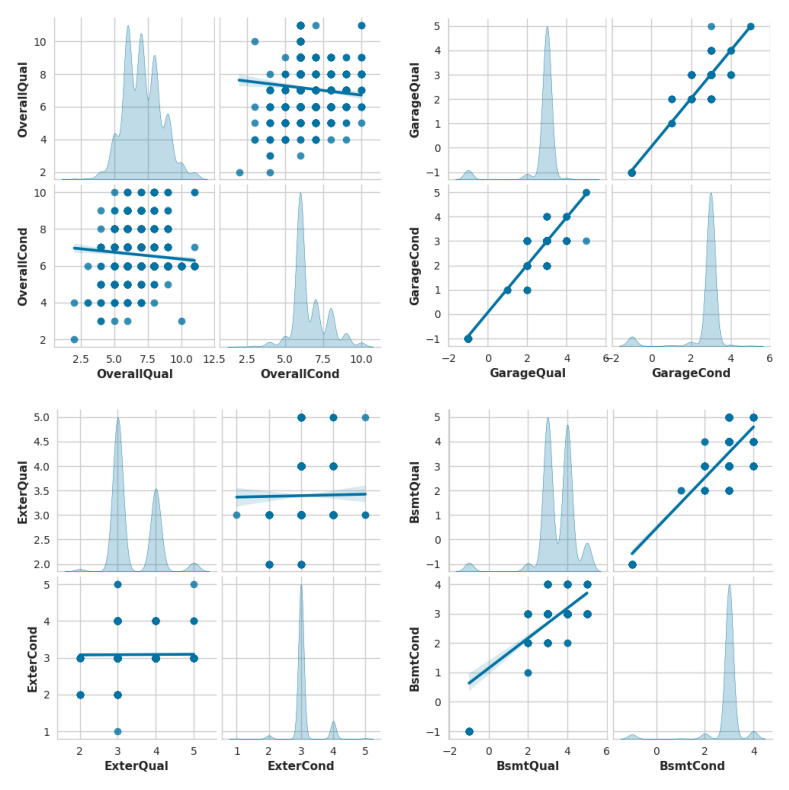

In [46]:
def decode_cat_columns(X, t_columns):
    """
    Convert categorical columns to their codes.
    """
    X = X.copy()
    X_new = pd.DataFrame(index=X.index)
    for c in t_columns:
        X_new[c] = X[c].cat.codes
    return X_new


pd.options.mode.copy_on_write = False

fig, ax = plt.subplots(2, 2, figsize=(8, 8))

fig1 = sns.pairplot(decode_cat_columns(X, ['OverallQual', 'OverallCond']), kind='reg', diag_kind='kde')
fig1.savefig('qual_cond1.png')
plt.close(fig1.fig)
fig2 = sns.pairplot(decode_cat_columns(X, ['GarageQual', 'GarageCond']), kind='reg', diag_kind='kde')
fig2.savefig('qual_cond2.png')
plt.close(fig2.fig)
fig3 = sns.pairplot(decode_cat_columns(X, ['ExterQual', 'ExterCond']), kind='reg', diag_kind='kde')
fig3.savefig('qual_cond3.png')
plt.close(fig3.fig)
fig4 = sns.pairplot(decode_cat_columns(X, ['BsmtQual', 'BsmtCond']), kind='reg', diag_kind='kde')
fig4.savefig('qual_cond4.png')
plt.close(fig4.fig)

ax[0, 0].imshow(PIL.Image.open('qual_cond1.png'))
ax[0, 0].set_axis_off()
ax[0, 1].imshow(PIL.Image.open('qual_cond2.png'))
ax[0, 1].set_axis_off()
ax[1, 0].imshow(PIL.Image.open('qual_cond3.png'))
ax[1, 0].set_axis_off()
ax[1, 1].imshow(PIL.Image.open('qual_cond4.png'))
ax[1, 1].set_axis_off()

plt.tight_layout()
fig.show()

pd.options.mode.copy_on_write = True

In [47]:
def decode_two_multiply(X, t_columns, n_column):
    """
    Transform two columns to their codes (if categorical), then multiply them.
    """
    assert len(t_columns) == 2, f't_columns must contain 2 columns, got {len(t_columns)} instead'
    X = X.copy()

    X_new = pd.DataFrame(index=X.index)
    for c in t_columns:
        if X[c].dtype.name == 'category':
            X_new[c] = X[c].cat.codes
        else:
            X_new[c] = X[c]

    X_new[n_column] = X_new[t_columns[0]] * X_new[t_columns[1]]
    # in X_new, only keep the product column
    X_new.drop(columns=t_columns, inplace=True)
    X = X.join(X_new)
    return X


def make_steps_qual_cond_interactions(
    garage_interaction=True,
    exterior_interaction=True,
    overall_interaction=True,
    basement_interaction=True,
):
    steps = []
    drop_features = []
    if garage_interaction:
        steps += [
            (
                'garage_interaction',
                FunctionTransformer(
                    func=decode_two_multiply,
                    kw_args={
                        't_columns': ['GarageQual', 'GarageCond'],
                        'n_column': 'GarageOverall',
                    },
                ),
            )
        ]
    if exterior_interaction:
        steps += [
            (
                'exterior_interaction',
                FunctionTransformer(
                    func=decode_two_multiply,
                    kw_args={
                        't_columns': ['ExterQual', 'ExterCond'],
                        'n_column': 'ExterOverall',
                    },
                ),
            ),
        ]
    if overall_interaction:
        steps += [
            (
                'overall_interaction',
                FunctionTransformer(
                    func=decode_two_multiply,
                    kw_args={
                        't_columns': ['OverallQual', 'OverallCond'],
                        'n_column': 'OverallOverall',
                    },
                ),
            ),
        ]
    if basement_interaction:
        steps += [
            (
                'basement_interaction',
                FunctionTransformer(
                    func=decode_two_multiply,
                    kw_args={
                        't_columns': ['BsmtQual', 'BsmtCond'],
                        'n_column': 'BsmtOverall',
                    },
                ),
            ),
        ]
    return steps, drop_features


steps_preproc, _ = make_steps_qual_cond_interactions()

pipe_preproc, pipe = rebuild_all_pipelines(steps_preproc)
# pipe_preproc
# pipe_preproc.fit_transform(X, y)
test_all_models('qual_cond_interactions', pipe, X, y)

qual_cond_interactions
xgboost  0.1333236043664156
lgbm     0.12858964798910738
catboost 0.11860501415397526
ridge    0.1337616024689054
enet     0.13529024677410023



/home/florin/.local/lib/python3.11/site-packages/sklearn/preprocessing/_function_transformer.py:345: UserWarning: With transform="pandas", `func` should return a DataFrame to follow the set_output API.
  warnings.warn(


## 13.3. <a id='toc13_3_'></a>[Categorical / numeric interactions](#toc0_)

/home/florin/.local/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/home/florin/.local/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/tmp/ipykernel_35469/2766856711.py:23: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


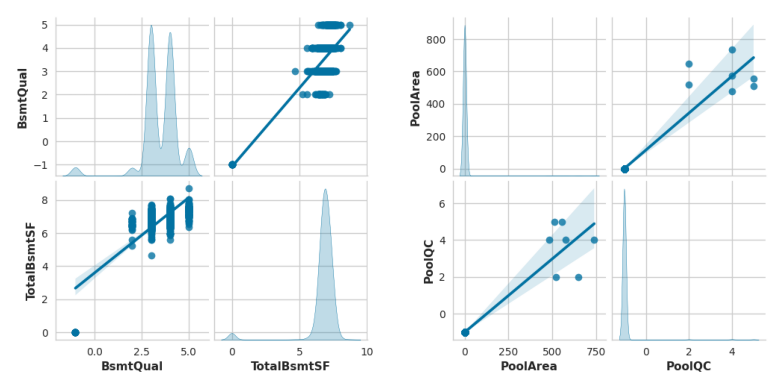

In [48]:
pd.options.mode.copy_on_write = False

fig, ax = plt.subplots(1, 2, figsize=(8, 4))

X_inter = X[['BsmtQual', 'TotalBsmtSF']].copy()
X_inter['BsmtQual'] = X_inter['BsmtQual'].cat.codes
X_inter['TotalBsmtSF'] = np.log1p(X_inter['TotalBsmtSF'])
fig1 = sns.pairplot(X_inter, kind='reg', diag_kind='kde')
fig1.savefig('bsmt_qual_sf.png')
plt.close(fig1.fig)
ax[0].imshow(PIL.Image.open('bsmt_qual_sf.png'))
ax[0].set_axis_off()

X_inter = X[['PoolArea', 'PoolQC']].copy()
X_inter['PoolQC'] = X_inter['PoolQC'].cat.codes
fig2 = sns.pairplot(X_inter, kind='reg', diag_kind='kde')
fig2.savefig('pool_area_qc.png')
plt.close(fig2.fig)
ax[1].imshow(PIL.Image.open('pool_area_qc.png'))
ax[1].set_axis_off()

plt.tight_layout()
fig.show()

pd.options.mode.copy_on_write = True

In [49]:
def make_steps_num_cat_interactions(basement_num_cat=True, pool_num_cat=True):
    steps = []
    drop_features = []
    if basement_num_cat:
        steps += [
            (
                'basement_num_cat_interaction',
                FunctionTransformer(
                    func=decode_two_multiply,
                    kw_args={
                        't_columns': ['BsmtQual', 'TotalBsmtSF'],
                        'n_column': 'BsmtNumCat',
                    },
                ),
            ),
        ]
    if pool_num_cat:
        steps += [
            (
                'pool_num_cat_interaction',
                FunctionTransformer(
                    func=decode_two_multiply,
                    kw_args={
                        't_columns': ['PoolArea', 'PoolQC'],
                        'n_column': 'PoolNumCat',
                    },
                ),
            ),
        ]
    return steps, drop_features


steps_preproc, _ = make_steps_num_cat_interactions()

pipe_preproc, pipe = rebuild_all_pipelines(steps_preproc)
# pipe_preproc
# pipe_preproc.fit_transform(X, y)
test_all_models('num_cat_interactions', pipe, X, y)

num_cat_interactions
xgboost  0.13565366574084264
lgbm     0.1281065622360887
catboost 0.11797581822666771
ridge    0.1347210528506853
enet     0.13675698301327843



/home/florin/.local/lib/python3.11/site-packages/sklearn/preprocessing/_function_transformer.py:345: UserWarning: With transform="pandas", `func` should return a DataFrame to follow the set_output API.
  warnings.warn(


# 14. <a id='toc14_'></a>[Group one feature by another feature](#toc0_)

Group a size feature by a major category feature, and compute the group median. Do the difference between the size feature value and its grouped median.

In [50]:
def group_transforms(X, feature, group_by):
    X = X.copy()
    X_new = pd.DataFrame()
    new_col = feature + '_by_' + group_by + '_median_diff'
    X_new[new_col] = X.groupby(group_by)[feature].transform('median')
    X_new[new_col] = X[feature] - X_new[new_col]
    return X.join(X_new)


def make_steps_median_diff_groupby(
    group_LotArea_by_MSZoning=True,
    group_GrLivArea_by_MSSubClass=True,
    group_LotArea_by_MSSubClass=True,
    group_GrLivArea_by_HouseStyle=True,
):
    steps = []
    drop_features = []
    if group_LotArea_by_MSZoning:
        steps += [
            (
                'LotArea_by_MSZoning_median_diff_norm',
                FunctionTransformer(
                    func=group_transforms,
                    kw_args={'feature': 'LotArea', 'group_by': 'MSZoning'},
                ),
            ),
        ]
    if group_GrLivArea_by_MSSubClass:
        steps += [
            (
                'GrLivArea_by_MSSubClass_median_diff',
                FunctionTransformer(
                    func=group_transforms,
                    kw_args={'feature': 'GrLivArea', 'group_by': 'MSSubClass'},
                ),
            ),
        ]
    if group_LotArea_by_MSSubClass:
        steps += [
            (
                'LotArea_by_MSSubClass_median_diff_norm',
                FunctionTransformer(
                    func=group_transforms,
                    kw_args={'feature': 'LotArea', 'group_by': 'MSSubClass'},
                ),
            ),
        ]
    if group_GrLivArea_by_HouseStyle:
        steps += [
            (
                'GrLivArea_by_HouseStyle_median_diff_norm',
                FunctionTransformer(
                    func=group_transforms,
                    kw_args={'feature': 'GrLivArea', 'group_by': 'HouseStyle'},
                ),
            ),
        ]
    return steps, drop_features


steps_preproc, _ = make_steps_median_diff_groupby()

pipe_preproc, pipe = rebuild_all_pipelines(steps_preproc)
# display(pipe_preproc.fit_transform(X, y))
# pipe_preproc.fit_transform(X, y).iloc[:, -1].info()
test_all_models('median_diff_groupby', pipe, X, y)

median_diff_groupby
xgboost  0.13375412867552253
lgbm     0.12622006464898997
catboost 0.11940600745204362
ridge    0.13519220023606957
enet     0.1375736604535861



# 15. <a id='toc15_'></a>[k-Means clustering for area features](#toc0_)

## 15.1. <a id='toc15_1_'></a>[Visualize area feature clusters](#toc0_)

In [51]:
# square-footage features
cluster_area_features = [
    "LotArea",
    "TotalBsmtSF",
    "FirstFlrSF",
    "SecondFlrSF",
    "GrLivArea",
]


def cluster_evaluate_elbow(X, features, n_max=20):
    X = X.copy()
    X_scaled = X.loc[:, features]
    si = SimpleImputer(strategy='mean')
    X_scaled = si.fit_transform(X_scaled)
    X_scaled = (X_scaled - X_scaled.mean(axis=0)) / X_scaled.std(axis=0)
    kmeans = KMeans(n_init=50, random_state=0)
    ke_vis = KElbowVisualizer(kmeans, k=(2, n_max), metric='distortion')
    ke_vis.fit(X_scaled)
    ke_vis.show()
    n_best = ke_vis.elbow_value_


def cluster_evaluate_silhouette(X, features, elbow_val, delta):
    X = X.copy()
    X_scaled = X.loc[:, features]
    si = SimpleImputer(strategy='mean')
    X_scaled = si.fit_transform(X_scaled)
    X_scaled = (X_scaled - X_scaled.mean(axis=0)) / X_scaled.std(axis=0)
    fig, ax = plt.subplots(nrows=delta, ncols=2, figsize=(9, round(3 * delta)))
    sil_score_best = 0.0
    i_best = 0
    for i in range(elbow_val - delta, elbow_val + delta):
        _, col = divmod(i - ((elbow_val - delta) % 2), 2)
        row = (i - elbow_val + delta) // 2
        kmeans = KMeans(n_clusters=i, n_init=50, random_state=0)
        ks_vis = SilhouetteVisualizer(kmeans, ax=ax[row, col])
        ks_vis.fit(X_scaled)
        sil_score = ks_vis.silhouette_score_
        if sil_score > sil_score_best:
            sil_score_best = sil_score
            i_best = i
        ax[row, col].set_title(f'n_clusters={i} score={sil_score:.4f}')
    print(f'best values: n_clusters={i_best} score={sil_score_best}')
    fig.show()

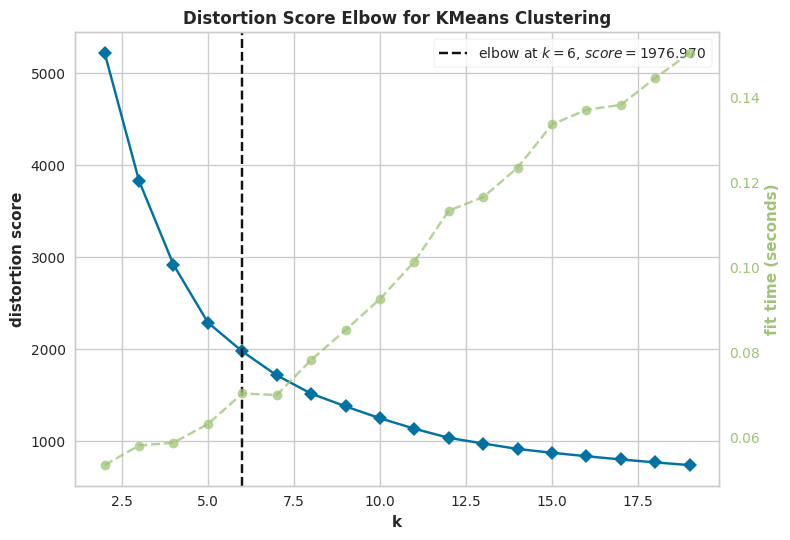

In [52]:
cluster_evaluate_elbow(X, cluster_area_features)

best values: n_clusters=5 score=0.41659716411855224


/tmp/ipykernel_35469/4119913658.py:45: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


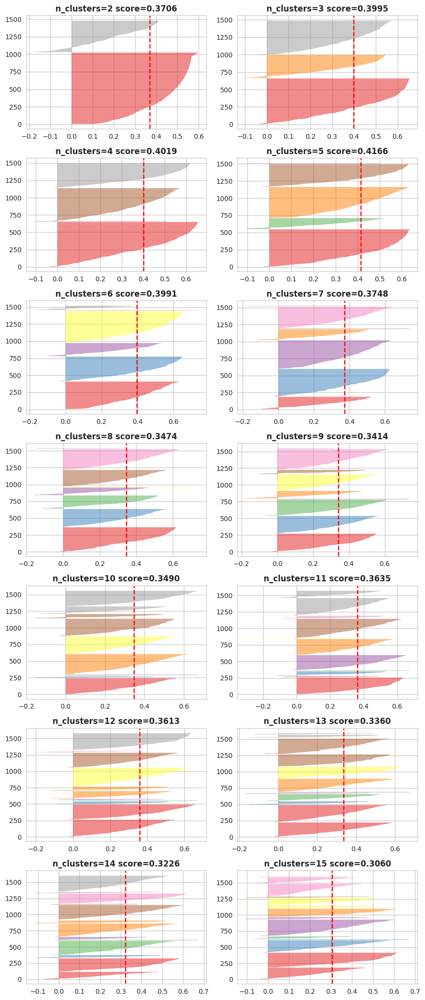

In [53]:
cluster_evaluate_silhouette(X, cluster_area_features, 9, 7)

## 15.2. <a id='toc15_2_'></a>[Create cluster labels feature](#toc0_)

In [54]:
def extract_cluster_labels(X, column_name):
    c_labels = X.apply(lambda row: row.values.argmin(), axis=1)
    c_labels = pd.DataFrame(c_labels, index=X.index, columns=[column_name])
    return c_labels


def make_steps_cluster_labels_area_feature(n_clusters=6):
    """
    n_clusters=1 means disabled
    """
    steps = []
    drop_features = []
    if n_clusters >= 2:
        steps = [
            (
                'cluster_labels_area_features',
                ColumnTransformer(
                    [
                        (
                            'create_cluster_labels',
                            Pipeline(
                                [
                                    ('simple_imputer', SimpleImputer(strategy='mean')),
                                    ('standard_scaler', StandardScaler()),
                                    (
                                        'kmeans_clustering',
                                        KMeans(
                                            n_clusters=n_clusters,
                                            n_init='auto',
                                            random_state=0,
                                        ),
                                    ),
                                    (
                                        'extract_labels',
                                        FunctionTransformer(
                                            func=extract_cluster_labels,
                                            kw_args={'column_name': 'AreaFeaturesCluster'},
                                        ),
                                    ),
                                ]
                            ),
                            cluster_area_features,
                        ),
                        (
                            'passthrough_cluster_features',
                            'passthrough',
                            cluster_area_features,
                        ),
                    ],
                    remainder='passthrough',
                    n_jobs=1,
                    verbose_feature_names_out=False,
                ),
            ),
        ]
    return steps, drop_features


steps_preproc, _ = make_steps_cluster_labels_area_feature(n_clusters=6)

pipe_preproc, pipe = rebuild_all_pipelines(steps_preproc)
display(pipe_preproc)
# pipe_preproc.fit_transform(X, y)
test_all_models('cluster_labels_area_feature', pipe, X, y)

/home/florin/.local/lib/python3.11/site-packages/sklearn/preprocessing/_function_transformer.py:345: UserWarning: With transform="pandas", `func` should return a DataFrame to follow the set_output API.
  warnings.warn(


Pipeline(steps=[('cluster_labels_area_features',
                 ColumnTransformer(n_jobs=1, remainder='passthrough',
                                   transformers=[('create_cluster_labels',
                                                  Pipeline(steps=[('simple_imputer',
                                                                   SimpleImputer()),
                                                                  ('standard_scaler',
                                                                   StandardScaler()),
                                                                  ('kmeans_clustering',
                                                                   KMeans(n_clusters=6,
                                                                          n_init='auto',
                                                                          random_state=0)),
                                                                  ('extract_labels',
                                                                   FunctionTransformer(func=<function extract_cluster_labels at 0x7ff00ecd7560>,
                                                                                       kw_args={'column_name': 'AreaFeaturesCluster'}))]),
                                                  ['LotArea', 'TotalBsmtSF',
                                                   'FirstFlrSF', 'SecondFlrSF',
                                                   'GrLivArea']),
                                                 ('passthrough_cluster_features',
                                                  'passthrough',
                                                  ['LotArea', 'TotalBsmtSF',
                                                   'FirstFlrSF', 'SecondFlrSF',
                                                   'GrLivArea'])],
                                   verbose_feature_names_out=False))])

cluster_labels_area_feature
xgboost  0.13588773798899678
lgbm     0.12837172745424696
catboost 0.1183161034954745
ridge    0.13467762197064906
enet     0.13743004735560382



In [55]:
make_submission_all(pipe, X, y, X_test, 'cluster_labels_area_feature')

## 15.3. <a id='toc15_3_'></a>[Check cluster labels against the target](#toc0_)

/home/florin/.local/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


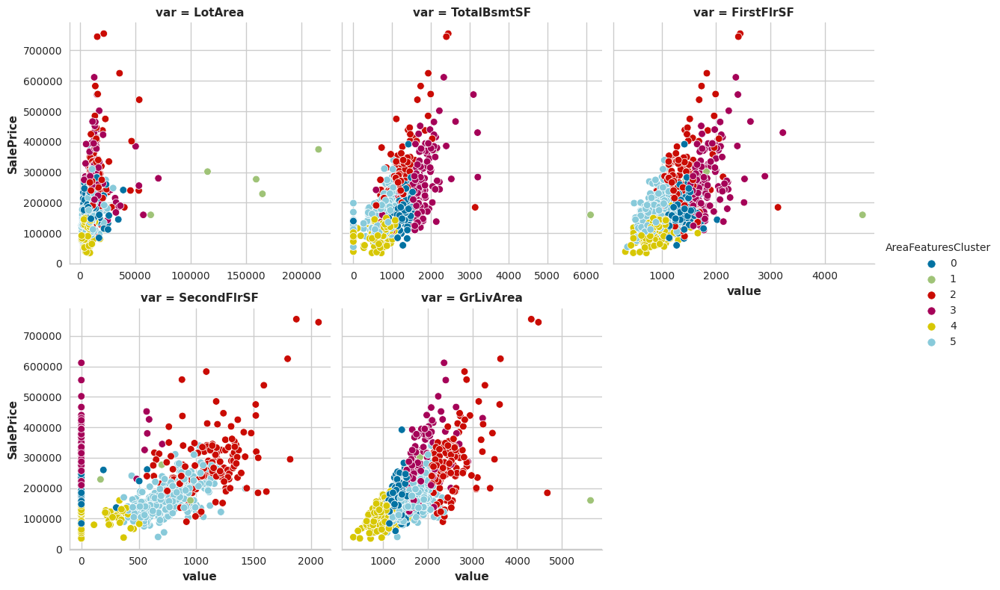

In [56]:
Xy = pipe_preproc.fit_transform(X, y)
Xy["AreaFeaturesCluster"] = Xy['AreaFeaturesCluster'].astype("category")
Xy["SalePrice"] = y
_ = sns.relplot(
    x="value",
    y="SalePrice",
    hue="AreaFeaturesCluster",
    col="var",
    height=4,
    aspect=1,
    facet_kws={'sharex': False},
    col_wrap=3,
    data=Xy.melt(
        value_vars=cluster_area_features,
        id_vars=["SalePrice", "AreaFeaturesCluster"],
        var_name='var',
    ),
)

## 15.4. <a id='toc15_4_'></a>[Create cluster distance features](#toc0_)

In [57]:
def rename_cluster_columns(X, prefix, numeric=True):
    old_cols = X.columns.to_list()
    if numeric:
        new_cols = [prefix + '_' + str(i) for i in range(len(old_cols))]
    else:
        new_cols = [prefix + '_' + i for i in old_cols]
    cols_dict = dict(zip(old_cols, new_cols))
    return X.rename(columns=cols_dict)


def make_steps_cluster_distances_area_features(n_clusters=6):
    """ "
    n_clusters=1 means disabled
    """
    steps = []
    drop_features = []
    if n_clusters >= 2:
        steps += [
            (
                'cluster_distances_area_features',
                ColumnTransformer(
                    [
                        (
                            'create_cluster_distances',
                            Pipeline(
                                [
                                    ('simple_imputer', SimpleImputer(strategy='mean')),
                                    ('standard_scaler', StandardScaler()),
                                    (
                                        'kmeans_clustering',
                                        KMeans(
                                            n_clusters=n_clusters,
                                            n_init='auto',
                                            random_state=0,
                                        ),
                                    ),
                                    (
                                        'rename_cluster_columns',
                                        FunctionTransformer(
                                            func=rename_cluster_columns,
                                            kw_args={'prefix': 'AreaFeatDistToCluster'},
                                        ),
                                    ),
                                ]
                            ),
                            cluster_area_features,
                        ),
                        (
                            'passthrough_cluster_features',
                            'passthrough',
                            cluster_area_features,
                        ),
                    ],
                    remainder='passthrough',
                    n_jobs=1,
                    verbose_feature_names_out=False,
                ),
            ),
        ]
    return steps, drop_features


steps_preproc, _ = make_steps_cluster_distances_area_features(n_clusters=6)

pipe_preproc, pipe = rebuild_all_pipelines(steps_preproc)
# display(pipe_preproc)
# pipe_preproc.fit_transform(X, y)
test_all_models('cluster_distances_area_features', pipe, X, y)

cluster_distances_area_features
xgboost  0.13731106727665227
lgbm     0.12690222447929816
catboost 0.11707804266761493
ridge    0.13254908258731002
enet     0.13698341814245335



/home/florin/.local/lib/python3.11/site-packages/sklearn/preprocessing/_function_transformer.py:345: UserWarning: With transform="pandas", `func` should return a DataFrame to follow the set_output API.
  warnings.warn(


In [58]:
make_submission_all(pipe, X, y, X_test, 'cluster_distances_area_features')

# 16. <a id='toc16_'></a>[PCA for numeric features](#toc0_)

Check if numeric features can be transformed into PCA components for better predictions.

## 16.1. <a id='toc16_1_'></a>[Visualize PCA](#toc0_)

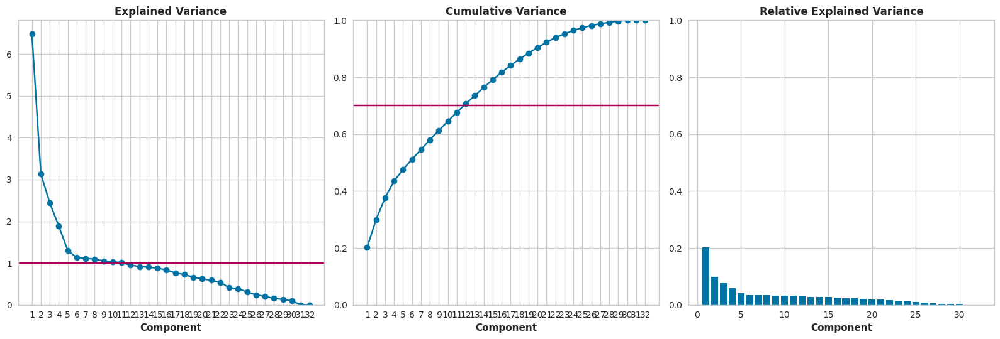

In [59]:
def apply_pca(X_orig):
    X = X_orig.copy()
    # Create principal components
    pca = PCA(random_state=0)
    X_pca = pca.fit_transform(X)
    # Convert to dataframe
    component_names = [f"PC{i+1}" for i in range(X_pca.shape[1])]
    X_pca = pd.DataFrame(X_pca, columns=component_names, index=X.index)
    # Create loadings
    loadings = pd.DataFrame(
        pca.components_.T,  # transpose the matrix of loadings
        columns=component_names,  # so the columns are the principal components
        index=X.columns,  # and the rows are the original features
    )
    return pca, X_pca, loadings


steps_pca_all = [
    ('simple_imputer', SimpleImputer(strategy='mean')),
    ('standard_scaler', StandardScaler()),
]

pipe_pca_all = Pipeline(steps=steps_pca_all, verbose=False)
pipe_pca_all.set_output(transform='pandas')


pca, X_pca, loadings = apply_pca(pipe_pca_all.fit_transform(X[features_numeric]))
_ = plot_variance(pca, 16)

In [60]:
X_pca

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,...,PC23,PC24,PC25,PC26,PC27,PC28,PC29,PC30,PC31,PC32
Id,,,,,,,,,,,,,,,,,,,,,
1,1.319667,0.253511,-1.465137,-2.241872,1.018470,0.213784,0.505476,0.341499,0.420613,0.009350,...,0.217328,0.058187,0.380878,-0.109228,-0.393812,-0.198528,0.366336,-0.184331,3.784541e-15,2.249875e-15
2,0.188263,-1.030096,0.785191,0.151605,-0.994604,-0.618935,-3.462510,0.983373,1.060380,-1.312354,...,-0.608682,0.755184,0.219853,0.316759,0.253835,0.094876,0.459792,0.154973,-5.758691e-15,3.227463e-15
3,1.443037,0.076919,-1.275494,-1.766320,0.305316,-0.080309,0.542641,0.121386,-0.147398,0.376114,...,-0.200565,-0.284208,0.809865,0.113971,0.209419,0.511120,-0.383688,-0.250367,3.971903e-15,4.206107e-16
4,-0.584346,1.147321,1.042259,-0.005675,0.089426,0.988350,1.172386,2.328988,-1.936959,-0.594625,...,-0.581900,-1.317109,0.254077,-1.486220,0.069142,0.474494,0.065772,1.071727,-2.024218e-16,7.222443e-16
5,4.128104,0.908141,-0.455301,-1.768404,0.590250,-0.430892,0.070445,0.263687,-0.694756,0.183212,...,-0.174506,-0.849708,0.328150,-0.054969,0.045859,-0.088122,0.066637,-0.100611,5.491133e-15,-1.196395e-15
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1456,0.797221,1.280392,-2.180601,-0.082128,-0.593274,0.285918,0.190878,-0.011470,0.024647,-0.041398,...,-0.231493,0.132148,0.115910,0.083520,0.062321,0.033482,0.109365,0.022206,5.819208e-17,5.929316e-18
1457,2.567203,-1.531531,2.028088,0.618137,0.581316,-0.294900,-0.926247,-1.253234,-1.233935,0.414069,...,-0.045444,-0.005702,0.030275,0.109629,-0.498817,0.435507,-0.423289,0.208758,-3.582002e-17,1.297926e-16
1458,0.655551,3.205122,1.058579,0.248362,0.365413,-0.704300,0.198081,-1.807445,1.775119,0.844847,...,1.367273,-0.621316,0.269872,-0.022714,0.703932,-0.431905,-0.294173,-0.127209,-6.440945e-17,1.480647e-16


In [61]:
loadings

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,...,PC23,PC24,PC25,PC26,PC27,PC28,PC29,PC30,PC31,PC32
LotFrontage,0.175396,0.015549,0.234096,0.125092,-0.035916,0.048305,-0.026918,0.111289,-0.000084,0.206924,...,0.027354,0.061363,0.152329,-0.010805,0.016390,0.033472,0.034995,0.031895,2.139601e-16,-0.000000e+00
LotArea,0.120766,-0.020536,0.277302,0.006986,-0.085585,-0.020800,-0.234320,-0.047378,-0.098655,0.094364,...,-0.047629,-0.014952,-0.064483,-0.004832,-0.012269,-0.032900,0.004166,-0.003411,-1.868961e-16,1.238875e-16
YearBuilt,0.238688,-0.220281,-0.322435,-0.068910,0.010597,0.017620,-0.061004,-0.045108,0.079290,-0.033148,...,-0.405266,0.094429,0.056713,0.115782,-0.139026,-0.590229,-0.349727,-0.163359,9.070800e-17,5.616481e-19
YearRemodAdd,0.214818,-0.116506,-0.303616,-0.048179,0.028095,0.183624,-0.075246,-0.095923,0.050684,0.102703,...,0.553918,-0.362972,-0.192046,0.283654,0.126263,-0.022384,-0.013933,-0.062427,3.942365e-17,-1.143878e-16
MasVnrArea,0.205032,-0.029369,0.005524,-0.034691,-0.059342,-0.309263,0.069873,0.202594,-0.038944,-0.112917,...,0.032250,-0.229090,0.002753,0.048609,-0.017173,0.031894,0.036478,0.007316,8.126963e-17,1.175461e-16
BsmtFinSF1,0.151324,-0.306658,0.280720,-0.260624,0.176625,-0.048756,0.078328,0.192017,0.153119,-0.042750,...,0.019412,0.269801,-0.210996,0.027086,0.302003,-0.092594,0.121158,0.021168,-4.227070e-01,-3.948353e-01
BsmtFinSF2,-0.009678,-0.066052,0.189413,-0.067531,-0.147332,0.157129,-0.266769,-0.541824,-0.163633,-0.009866,...,0.051089,0.044371,-0.025850,-0.016498,0.117495,-0.027432,0.037475,0.003215,-1.495091e-01,-1.396510e-01
BsmtUnfSF,0.116066,0.139441,-0.186305,0.556068,-0.163917,0.019239,0.069847,-0.039937,-0.088491,0.016098,...,-0.036425,-0.116690,0.329031,-0.021760,0.098308,0.007136,0.042552,-0.017328,-4.095178e-01,-3.825157e-01
TotalBsmtSF,0.270666,-0.202658,0.173852,0.264287,-0.035648,0.026467,0.053688,-0.039833,0.009890,-0.031859,...,0.002281,0.179282,0.102536,0.000176,0.456198,-0.099164,0.182600,0.005736,4.065876e-01,3.797788e-01
FirstFlrSF,0.272621,-0.141130,0.244889,0.299338,0.039731,-0.028597,0.006350,-0.049693,0.021530,-0.036829,...,0.115334,0.125375,-0.253915,0.018158,-0.458906,0.204821,-0.326232,0.083866,-3.355416e-01,3.592277e-01


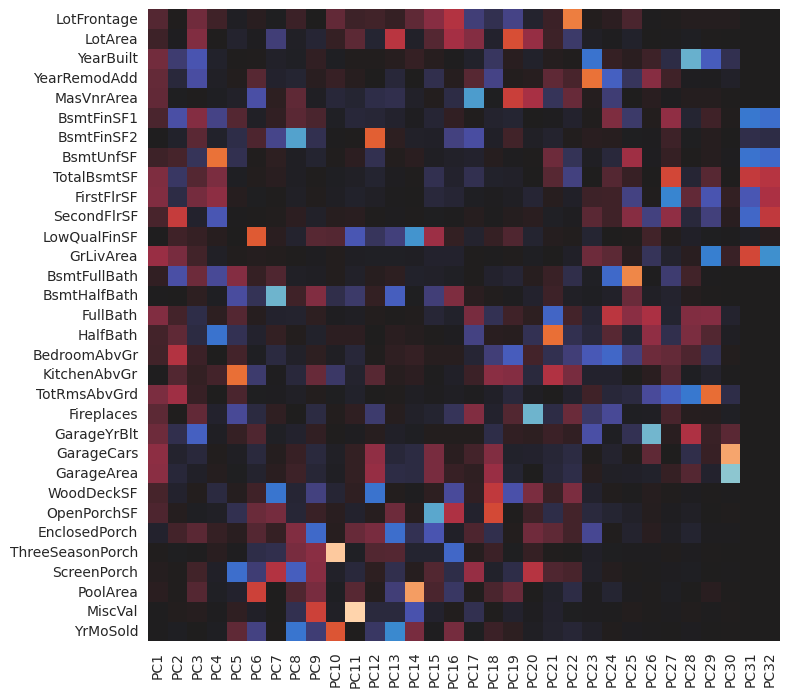

In [62]:
fig, ax = plt.subplots(1, 1, figsize=(8, 8))
ax = sns.heatmap(loadings, cmap='icefire', center=0.0, square=True, cbar=False)

## 16.2. <a id='toc16_2_'></a>[Replace all numeric features with some PCA components](#toc0_)

Use the components with the highest explained variance, cut off at some point TBD.

In [63]:
def make_steps_replace_numeric_with_pca_features(pca_features_count=10, drop_now=False):
    """
    pca_features_count=0 means disabled
    """
    steps = []
    drop_features = []
    if pca_features_count >= 1:
        pca_features_list = ['pca' + str(i) for i in range(len(features_numeric))]
        ct_list = [
            (
                'add_pca_features',
                Pipeline(
                    [
                        ('impute_numeric', SimpleImputer(strategy='mean')),
                        ('standard_scaler', StandardScaler()),
                        ('pca', PCA(random_state=0)),
                        (
                            'filter_pca_features',
                            ColumnTransformer(
                                [
                                    (
                                        'passthrough',
                                        'passthrough',
                                        pca_features_list[:pca_features_count],
                                    )
                                ],
                                remainder='drop',
                                verbose_feature_names_out=False,
                            ),
                        ),
                    ]
                ),
                features_numeric,
            ),
        ]
        if not drop_now:
            ct_list += [('numeric_features', 'passthrough', features_numeric)]
            drop_features = features_numeric
        steps += [
            (
                'add_pca_features',
                ColumnTransformer(
                    ct_list,
                    remainder='passthrough',
                    verbose_feature_names_out=False,
                ),
            )
        ]
    return steps, drop_features


steps_preproc, _ = make_steps_replace_numeric_with_pca_features(pca_features_count=10, drop_now=True)

pipe_preproc, pipe = rebuild_all_pipelines(steps_preproc)
# display(pipe_preproc)
# display(pipe_preproc.fit_transform(X, y))
test_all_models('replace_numeric_with_pca_features', pipe, X, y)

replace_numeric_with_pca_features
xgboost  0.13312909019040395
lgbm     0.12747933412692666
catboost 0.12319170278761034
ridge    0.13565631495796443
enet     0.15047298891518832



/home/florin/.local/lib/python3.11/site-packages/sklearn/preprocessing/_function_transformer.py:345: UserWarning: With transform="pandas", `func` should return a DataFrame to follow the set_output API.
  warnings.warn(


In [64]:
make_submission_all(pipe, X, y, X_test, 'replace_numeric_with_pca_features')

# 17. <a id='toc17_'></a>[PCA-based clustering for numeric features](#toc0_)

Apply clustering to PCA components derived from numeric features, use cluster info in predictions as new features.

## 17.1. <a id='toc17_1_'></a>[Visualize clustering in PCA space](#toc0_)

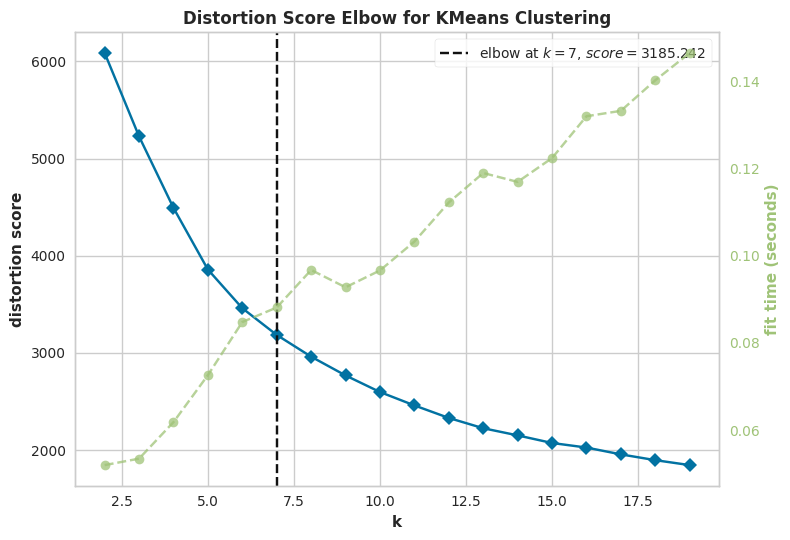

In [65]:
cluster_evaluate_elbow(X_pca, ['PC1', 'PC2', 'PC3', 'PC4', 'PC5'])

best values: n_clusters=11 score=0.2575858589959137


/tmp/ipykernel_35469/4119913658.py:45: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


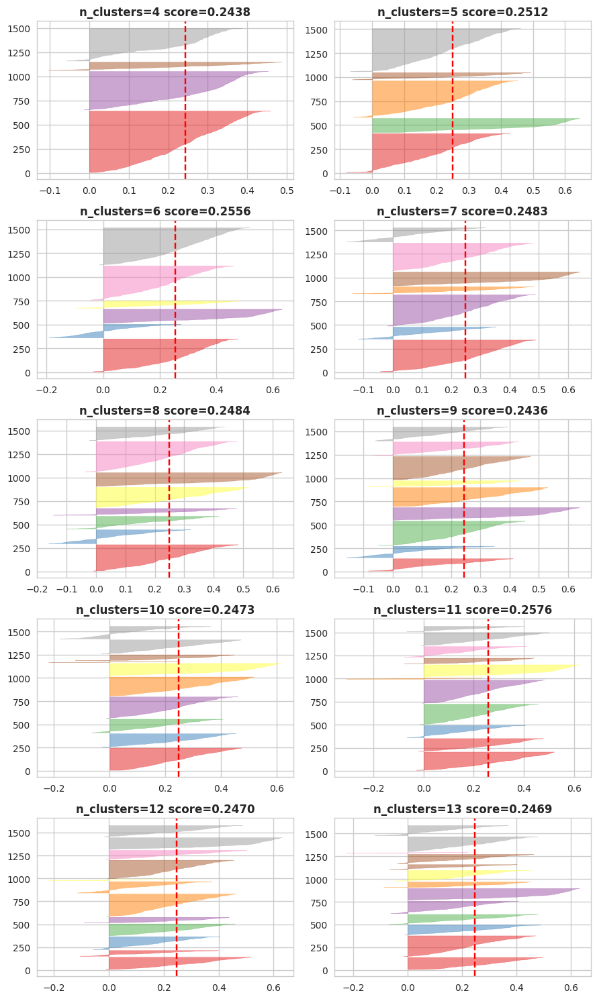

In [66]:
cluster_evaluate_silhouette(X_pca, ['PC1', 'PC2', 'PC3', 'PC4', 'PC5'], 9, 5)

## 17.2. <a id='toc17_2_'></a>[Cluster PCA components, use cluster labels as a feature](#toc0_)

In [67]:
def make_steps_cluster_labels_pca(cluster_labels_pca_features_count=10, n_clusters_labels_pca=9):
    """
    n_clusters_labels_pca: how many clusters to create
    cluster_labels_pca_features_count: how many PCA features to use for cluster creation

    n_clusters_labels_pca=1 means disabled (no-op)
    cluster_labels_pca_features_count <= len(features_numeric)
    """
    steps = []
    drop_features = []
    if n_clusters_labels_pca >= 2:
        pca_features_list = ['pca' + str(i) for i in range(len(features_numeric))]
        steps = [
            (
                'cluster_labels_pca',
                ColumnTransformer(
                    [
                        (
                            'pca_kmeans',
                            Pipeline(
                                [
                                    ('impute_numeric', SimpleImputer(strategy='mean')),
                                    ('standard_scaler', StandardScaler()),
                                    ('pca', PCA(random_state=0)),
                                    (
                                        'filter_pca_features',
                                        ColumnTransformer(
                                            [
                                                (
                                                    'passthrough',
                                                    'passthrough',
                                                    pca_features_list[:cluster_labels_pca_features_count],
                                                )
                                            ],
                                            remainder='drop',
                                            verbose_feature_names_out=False,
                                        ),
                                    ),
                                    (
                                        'kmeans_clustering',
                                        KMeans(
                                            n_clusters=n_clusters_labels_pca,
                                            n_init='auto',
                                            random_state=0,
                                        ),
                                    ),
                                    (
                                        'extract_labels',
                                        FunctionTransformer(
                                            func=extract_cluster_labels,
                                            kw_args={'column_name': 'PCACluster'},
                                        ),
                                    ),
                                ]
                            ),
                            features_numeric,
                        ),
                        (
                            'features_numeric_passthrough',
                            'passthrough',
                            features_numeric,
                        ),
                    ],
                    remainder='passthrough',
                    verbose_feature_names_out=False,
                ),
            )
        ]
    return steps, drop_features


steps_preproc, _ = make_steps_cluster_labels_pca()

pipe_preproc, pipe = rebuild_all_pipelines(steps_preproc)
display(pipe_preproc)
# pipe_preproc.fit_transform(X, y)
test_all_models('cluster_labels_pca', pipe, X, y)

/home/florin/.local/lib/python3.11/site-packages/sklearn/preprocessing/_function_transformer.py:345: UserWarning: With transform="pandas", `func` should return a DataFrame to follow the set_output API.
  warnings.warn(


Pipeline(steps=[('cluster_labels_pca',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('pca_kmeans',
                                                  Pipeline(steps=[('impute_numeric',
                                                                   SimpleImputer()),
                                                                  ('standard_scaler',
                                                                   StandardScaler()),
                                                                  ('pca',
                                                                   PCA(random_state=0)),
                                                                  ('filter_pca_features',
                                                                   ColumnTransformer(transformers=[('passthrough',
                                                                                                    'passthrough',
                                                                                                    ['pca0',
                                                                                                     'pca1',
                                                                                                     'pca2',
                                                                                                     'pca3',
                                                                                                     'pca4',
                                                                                                     'pca5'...
                                                   'BsmtFinSF2', 'BsmtUnfSF',
                                                   'TotalBsmtSF', 'FirstFlrSF',
                                                   'SecondFlrSF',
                                                   'LowQualFinSF', 'GrLivArea',
                                                   'BsmtFullBath',
                                                   'BsmtHalfBath', 'FullBath',
                                                   'HalfBath', 'BedroomAbvGr',
                                                   'KitchenAbvGr',
                                                   'TotRmsAbvGrd', 'Fireplaces',
                                                   'GarageYrBlt', 'GarageCars',
                                                   'GarageArea', 'WoodDeckSF',
                                                   'OpenPorchSF',
                                                   'EnclosedPorch',
                                                   'ThreeSeasonPorch',
                                                   'ScreenPorch', 'PoolArea', ...])],
                                   verbose_feature_names_out=False))])

cluster_labels_pca
xgboost  0.13377659215711227
lgbm     0.12851018604343645
catboost 0.11829201006515001
ridge    0.1352687931834633
enet     0.13686226506371518



## 17.3. <a id='toc17_3_'></a>[Cluster PCA components, use cluster distances as features](#toc0_)

In [68]:
def make_steps_cluster_distances_pca(cluster_distances_pca_features_count=10, n_clusters_distances_pca=7):
    """
    n_clusters_distances_pca: how many clusters to create
    cluster_distances_pca_features_count: how many PCA features to use for clustering

    n_clusters_distances_pca=1 means disabled
    1 <= cluster_distances_pca_features_count <= len(features_numeric)
    """
    steps = []
    drop_features = []
    if n_clusters_distances_pca >= 2:
        pca_features_list = ['pca' + str(i) for i in range(len(features_numeric))]
        steps += [
            (
                'cluster_distances_pca',
                ColumnTransformer(
                    [
                        (
                            'pca_kmeans',
                            Pipeline(
                                [
                                    ('impute_numeric', SimpleImputer(strategy='mean')),
                                    ('standard_scaler', StandardScaler()),
                                    ('pca', PCA(random_state=0)),
                                    (
                                        'filter_pca_features',
                                        ColumnTransformer(
                                            [
                                                (
                                                    'passthrough',
                                                    'passthrough',
                                                    pca_features_list[:cluster_distances_pca_features_count],
                                                )
                                            ],
                                            remainder='drop',
                                            verbose_feature_names_out=False,
                                        ),
                                    ),
                                    (
                                        'kmeans_clustering',
                                        KMeans(
                                            n_clusters=n_clusters_distances_pca,
                                            n_init='auto',
                                            random_state=0,
                                        ),
                                    ),
                                    (
                                        'rename_cluster_columns',
                                        FunctionTransformer(
                                            func=rename_cluster_columns,
                                            kw_args={'prefix': 'PCADistToCluster'},
                                        ),
                                    ),
                                ]
                            ),
                            features_numeric,
                        ),
                        (
                            'features_numeric_passthrough',
                            'passthrough',
                            features_numeric,
                        ),
                    ],
                    remainder='passthrough',
                    verbose_feature_names_out=False,
                ),
            )
        ]
    return steps, drop_features


pipe_preproc, pipe = rebuild_all_pipelines(steps_preproc)
display(pipe_preproc)
# display(pipe_preproc.fit_transform(X, y))
test_all_models('cluster_distances_pca', pipe, X, y)

Pipeline(steps=[('cluster_labels_pca',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('pca_kmeans',
                                                  Pipeline(steps=[('impute_numeric',
                                                                   SimpleImputer()),
                                                                  ('standard_scaler',
                                                                   StandardScaler()),
                                                                  ('pca',
                                                                   PCA(random_state=0)),
                                                                  ('filter_pca_features',
                                                                   ColumnTransformer(transformers=[('passthrough',
                                                                                                    'passthrough',
                                                                                                    ['pca0',
                                                                                                     'pca1',
                                                                                                     'pca2',
                                                                                                     'pca3',
                                                                                                     'pca4',
                                                                                                     'pca5'...
                                                   'BsmtFinSF2', 'BsmtUnfSF',
                                                   'TotalBsmtSF', 'FirstFlrSF',
                                                   'SecondFlrSF',
                                                   'LowQualFinSF', 'GrLivArea',
                                                   'BsmtFullBath',
                                                   'BsmtHalfBath', 'FullBath',
                                                   'HalfBath', 'BedroomAbvGr',
                                                   'KitchenAbvGr',
                                                   'TotRmsAbvGrd', 'Fireplaces',
                                                   'GarageYrBlt', 'GarageCars',
                                                   'GarageArea', 'WoodDeckSF',
                                                   'OpenPorchSF',
                                                   'EnclosedPorch',
                                                   'ThreeSeasonPorch',
                                                   'ScreenPorch', 'PoolArea', ...])],
                                   verbose_feature_names_out=False))])

cluster_distances_pca
xgboost  0.13377659215711227
lgbm     0.12851018604343645
catboost 0.11829201006515001
ridge    0.1352687931834633
enet     0.13686226506371518



# 18. <a id='toc18_'></a>[PCA-inspired feature creation](#toc0_)

Use suggestions from PCA for creating / removing features.

In [69]:
make_mi_scores(X_pca, y).head(10)

PC1     0.957850
PC4     0.113449
PC2     0.108403
PC3     0.106048
PC5     0.066863
PC14    0.061428
PC20    0.056117
PC28    0.054208
PC26    0.052675
PC24    0.048837
Name: MI Scores, dtype: float64

## 18.1. <a id='toc18_1_'></a>[Basement square-footage features](#toc0_)

One of them is likely redundant, since Total appears to be the sum of the other three. If true, then only 3 PCA components will explain any variance.

Replacing all 4 of them by their first 3 PCA components should not lose a lot of information, and some models may perform better.

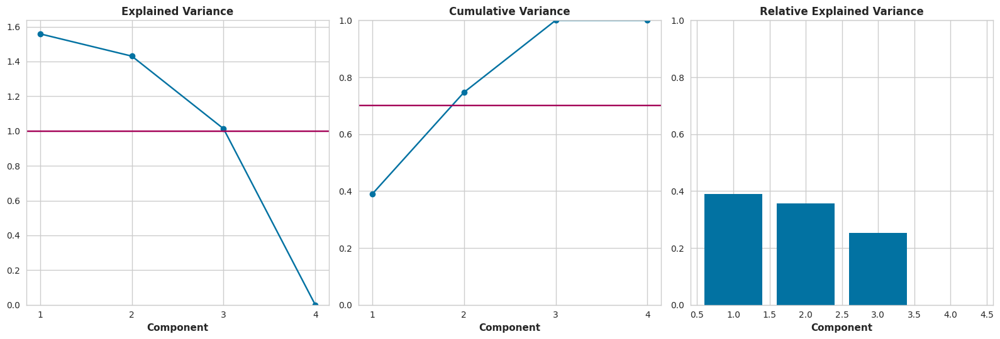

In [70]:
bsmt_sf = [
    "TotalBsmtSF",
    "BsmtFinSF2",
    "BsmtFinSF1",
    "BsmtUnfSF",
]

pca_corr_mat_bsmt_sf, X_pca_corr_mat_bsmt_sf, loadings_corr_mat_bsmt_sf = apply_pca(
    pipe_pca_all.fit_transform(X[bsmt_sf])
)
_ = plot_variance(pca_corr_mat_bsmt_sf, 16)

In [71]:
loadings_corr_mat_bsmt_sf

,PC1,PC2,PC3,PC4
TotalBsmtSF,0.442480,0.682135,0.171340,0.556368
BsmtFinSF2,0.171720,-0.182214,0.946285,-0.204586
BsmtFinSF1,0.772885,0.035364,-0.258499,-0.578426
BsmtUnfSF,-0.421156,0.707276,0.091464,-0.560378


In [72]:
def make_steps_basement_sf_pca(enable=True, drop_now=False):
    steps = []
    drop_features = []
    if enable:
        bsmt_sf = ["TotalBsmtSF", "BsmtFinSF2", "BsmtFinSF1", "BsmtUnfSF"]
        bsmt_sf_pca_features_list = ['pca' + str(i) for i in range(len(bsmt_sf))]
        ct_steps = [
            (
                'create_pca_features',
                Pipeline(
                    [
                        ('impute_numeric', SimpleImputer(strategy='mean')),
                        ('standard_scaler', StandardScaler()),
                        ('pca', PCA(random_state=0)),
                        (
                            'filter_pca_features',
                            ColumnTransformer(
                                [
                                    (
                                        'passthrough',
                                        'passthrough',
                                        bsmt_sf_pca_features_list[:3],
                                    )
                                ],
                                remainder='drop',
                                verbose_feature_names_out=False,
                            ),
                        ),
                        (
                            'rename_cluster_columns',
                            FunctionTransformer(
                                func=rename_cluster_columns,
                                kw_args={'prefix': 'BsmtSfPCA'},
                            ),
                        ),
                    ]
                ),
                bsmt_sf,
            ),
        ]
        if not drop_now:
            ct_steps += [('orig_features_passthrough', 'passthrough', bsmt_sf)]
            drop_features += bsmt_sf
        steps += [
            (
                'basement_sf_pca',
                ColumnTransformer(
                    ct_steps,
                    remainder='passthrough',
                    verbose_feature_names_out=False,
                ),
            )
        ]
    return steps, drop_features


steps_preproc, _ = make_steps_basement_sf_pca(drop_now=True)

pipe_preproc, pipe = rebuild_all_pipelines(steps_preproc)
display(pipe_preproc)
# print(f'drop: {_}')
# display(pipe_preproc.fit_transform(X, y))
test_all_models('basement_sf_pca', pipe, X, y)

/home/florin/.local/lib/python3.11/site-packages/sklearn/preprocessing/_function_transformer.py:345: UserWarning: With transform="pandas", `func` should return a DataFrame to follow the set_output API.
  warnings.warn(


Pipeline(steps=[('basement_sf_pca',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('create_pca_features',
                                                  Pipeline(steps=[('impute_numeric',
                                                                   SimpleImputer()),
                                                                  ('standard_scaler',
                                                                   StandardScaler()),
                                                                  ('pca',
                                                                   PCA(random_state=0)),
                                                                  ('filter_pca_features',
                                                                   ColumnTransformer(transformers=[('passthrough',
                                                                                                    'passthrough',
                                                                                                    ['pca0',
                                                                                                     'pca1',
                                                                                                     'pca2'])],
                                                                                     verbose_feature_names_out=False)),
                                                                  ('rename_cluster_columns',
                                                                   FunctionTransformer(func=<function rename_cluster_columns at 0x7ff00c120680>,
                                                                                       kw_args={'prefix': 'BsmtSfPCA'}))]),
                                                  ['TotalBsmtSF', 'BsmtFinSF2',
                                                   'BsmtFinSF1',
                                                   'BsmtUnfSF'])],
                                   verbose_feature_names_out=False))])

basement_sf_pca
xgboost  0.13459429466993827
lgbm     0.12794767631803497
catboost 0.11861960289668105
ridge    0.13504045114407898
enet     0.13708787047040671



# 19. <a id='toc19_'></a>[Target Encoding](#toc0_)

In [73]:
def make_steps_target_encoder(enable=True):
    steps = []
    drop_features = []
    if enable:
        # location, location, location
        te_features = ['Neighborhood']
        steps += [
            (
                'target_encoder',
                ColumnTransformer(
                    [
                        (
                            'encoder',
                            Pipeline(
                                [
                                    (
                                        'encoder',
                                        TargetEncoder(min_samples_leaf=20, smoothing=10),
                                    ),
                                    (
                                        'rename_columns',
                                        FunctionTransformer(
                                            func=rename_cluster_columns,
                                            kw_args={
                                                'prefix': 'TargetEncoded',
                                                'numeric': False,
                                            },
                                        ),
                                    ),
                                ]
                            ),
                            te_features,
                        ),
                        ('passthrough_transformed', 'passthrough', te_features),
                    ],
                    remainder='passthrough',
                    n_jobs=1,
                    verbose_feature_names_out=False,
                ),
            )
        ]
    return steps, drop_features


steps_preproc, _ = make_steps_target_encoder()

pipe_preproc, pipe = rebuild_all_pipelines(steps_preproc)
display(pipe_preproc)
display(pipe_preproc.fit_transform(X, y))
test_all_models('target_encoder', pipe, X, y)

Pipeline(steps=[('target_encoder',
                 ColumnTransformer(n_jobs=1, remainder='passthrough',
                                   transformers=[('encoder',
                                                  Pipeline(steps=[('encoder',
                                                                   TargetEncoder()),
                                                                  ('rename_columns',
                                                                   FunctionTransformer(func=<function rename_cluster_columns at 0x7ff00c120680>,
                                                                                       kw_args={'numeric': False,
                                                                                                'prefix': 'TargetEncoded'}))]),
                                                  ['Neighborhood']),
                                                 ('passthrough_transformed',
                                                  'passthrough',
                                                  ['Neighborhood'])],
                                   verbose_feature_names_out=False))])

,TargetEncoded_Neighborhood,Neighborhood,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,...,ThreeSeasonPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,SaleType,SaleCondition,YrMoSold
Id,,,,,,,,,,,,,,,,,,,,,
1,197965.734807,CollgCr,60,RL,65.0,8450.0,Pave,NaN,Reg,Lvl,...,0.0,0.0,0.0,NaN,NaN,NaN,0.0,WD,Normal,1201824000000000000
2,197643.209810,Veenker,20,RL,80.0,9600.0,Pave,NaN,Reg,Lvl,...,0.0,0.0,0.0,NaN,NaN,NaN,0.0,WD,Normal,1177977600000000000
3,197965.734807,CollgCr,60,RL,68.0,11250.0,Pave,NaN,IR1,Lvl,...,0.0,0.0,0.0,NaN,NaN,NaN,0.0,WD,Normal,1220227200000000000
4,209344.287867,Crawfor,70,RL,60.0,9550.0,Pave,NaN,IR1,Lvl,...,0.0,0.0,0.0,NaN,NaN,NaN,0.0,WD,Abnorml,1138752000000000000
5,318453.591177,NoRidge,60,RL,84.0,14260.0,Pave,NaN,IR1,Lvl,...,0.0,0.0,0.0,NaN,NaN,NaN,0.0,WD,Normal,1228089600000000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1456,192821.904993,Gilbert,60,RL,62.0,7917.0,Pave,NaN,Reg,Lvl,...,0.0,0.0,0.0,NaN,NaN,NaN,0.0,WD,Normal,1185926400000000000
1457,189009.693995,NWAmes,20,RL,85.0,13175.0,Pave,NaN,Reg,Lvl,...,0.0,0.0,0.0,NaN,MnPrv,NaN,0.0,WD,Normal,1264982400000000000
1458,209344.287867,Crawfor,70,RL,66.0,9042.0,Pave,NaN,Reg,Lvl,...,0.0,0.0,0.0,NaN,GdPrv,Shed,2500.0,WD,Normal,1272672000000000000


target_encoder
xgboost  0.13156624097958725
lgbm     0.12753338087020033
catboost 0.11621500760347268
ridge    0.13512199652928197
enet     0.13630931023812107



In [74]:
make_submission_all(pipe, X, y, X_test, 'target_encoder')

# 20. <a id='toc20_'></a>[Drop columns](#toc0_)

Columns are dropped only at the end of pipelines. A list of columns to drop is collected at each pipeline step. Where the pipelines are built below, the feature deletion lists will kick in at this stage. But this is not implemented here.

Columns with too many NaN values may be dropped here as well. The pipelines will simply append these features to the overall feature deletion lists, and drop them all at once - see pipeline creation after this.

## 20.1. <a id='toc20_1_'></a>[Drop columns for excessive NaN](#toc0_)

In [75]:
def make_steps_drop_frequent_nan_features(max_acceptable_nan_proportion=0.1, drop_now=False):
    """
    max_acceptable_nan_proportion=1.0 means disabled
    """
    steps = []
    drop_features = []
    if max_acceptable_nan_proportion < 1.0:
        features_to_drop = features_nan_proportion[
            features_nan_proportion > max_acceptable_nan_proportion
        ].index.to_list()
        if drop_now:
            steps += [
                (
                    'drop_frequent_nan_features',
                    ColumnTransformer(
                        [('drop', 'drop', features_to_drop)],
                        remainder='passthrough',
                        n_jobs=1,
                        verbose_feature_names_out=False,
                    ),
                ),
            ]
        else:
            steps += [('drop_frequent_nan_features', 'passthrough')]
            drop_features = features_to_drop
    return steps, drop_features


features_nan_proportion = X.isna().mean().sort_values(ascending=False)

steps_preproc, _ = make_steps_drop_frequent_nan_features(drop_now=True)
print(f'drop: {_}')

pipe_preproc, pipe = rebuild_all_pipelines(steps_preproc)
display(pipe_preproc)
display(pipe_preproc.fit_transform(X, y))
test_all_models('drop_frequent_nan_features', pipe, X, y)

drop: []


/home/florin/.local/lib/python3.11/site-packages/sklearn/preprocessing/_function_transformer.py:345: UserWarning: With transform="pandas", `func` should return a DataFrame to follow the set_output API.
  warnings.warn(


Pipeline(steps=[('drop_frequent_nan_features',
                 ColumnTransformer(n_jobs=1, remainder='passthrough',
                                   transformers=[('drop', 'drop',
                                                  ['PoolQC', 'MiscFeature',
                                                   'Alley', 'Fence',
                                                   'MasVnrType', 'FireplaceQu',
                                                   'LotFrontage'])],
                                   verbose_feature_names_out=False))])

,MSSubClass,MSZoning,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,ThreeSeasonPorch,ScreenPorch,PoolArea,MiscVal,SaleType,SaleCondition,YrMoSold
Id,,,,,,,,,,,,,,,,,,,,,
1,60,RL,8450.0,Pave,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,...,0.0,61.0,0.0,0.0,0.0,0.0,0.0,WD,Normal,1201824000000000000
2,20,RL,9600.0,Pave,Reg,Lvl,AllPub,FR2,Gtl,Veenker,...,298.0,0.0,0.0,0.0,0.0,0.0,0.0,WD,Normal,1177977600000000000
3,60,RL,11250.0,Pave,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,...,0.0,42.0,0.0,0.0,0.0,0.0,0.0,WD,Normal,1220227200000000000
4,70,RL,9550.0,Pave,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,...,0.0,35.0,272.0,0.0,0.0,0.0,0.0,WD,Abnorml,1138752000000000000
5,60,RL,14260.0,Pave,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,...,192.0,84.0,0.0,0.0,0.0,0.0,0.0,WD,Normal,1228089600000000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1456,60,RL,7917.0,Pave,Reg,Lvl,AllPub,Inside,Gtl,Gilbert,...,0.0,40.0,0.0,0.0,0.0,0.0,0.0,WD,Normal,1185926400000000000
1457,20,RL,13175.0,Pave,Reg,Lvl,AllPub,Inside,Gtl,NWAmes,...,349.0,0.0,0.0,0.0,0.0,0.0,0.0,WD,Normal,1264982400000000000
1458,70,RL,9042.0,Pave,Reg,Lvl,AllPub,Inside,Gtl,Crawfor,...,0.0,60.0,0.0,0.0,0.0,0.0,2500.0,WD,Normal,1272672000000000000


drop_frequent_nan_features
xgboost  0.13321589484241608
lgbm     0.12747931598754508
catboost 0.11781978430774054
ridge    0.13457851578174262
enet     0.13356035530108173



In [76]:
make_submission_all(pipe, X, y, X_test, 'drop_frequent_nan_features')

# 21. <a id='toc21_'></a>[Impute NaN](#toc0_)

If any NaN features still exist here, impute them. This assumes some features containing NaN have survived deletion.

In [77]:
def make_steps_simple_imputer(enable=True):
    steps = []
    drop_features = []
    if enable:
        steps += [
            (
                ('simple_imputer_split_num_cat'),
                ColumnTransformer(
                    [
                        (
                            'numeric_imputer',
                            SimpleImputer(strategy='median'),
                            make_column_selector(dtype_include='number'),
                        ),
                        (
                            'categorical_imputer',
                            SimpleImputerKeepCategories(strategy='most_frequent'),
                            make_column_selector(dtype_exclude='number'),
                        ),
                    ],
                    remainder='drop',
                    n_jobs=1,
                    verbose_feature_names_out=False,
                ),
            )
        ]
    return steps, drop_features


steps_preproc, _ = make_steps_simple_imputer()

pipe_preproc, pipe = rebuild_all_pipelines(steps_preproc)
# display(pipe_preproc)
# pipe_preproc.fit_transform(X, y).info()
test_all_models('simple_imputer', pipe, X, y)

simple_imputer
xgboost  0.13568360140025726
lgbm     0.1277483757240745
catboost 0.11963081619388051
ridge    0.13577055969382246
enet     0.13689558352362224



/home/florin/.local/lib/python3.11/site-packages/sklearn/preprocessing/_function_transformer.py:345: UserWarning: With transform="pandas", `func` should return a DataFrame to follow the set_output API.
  warnings.warn(


# 22. <a id='toc22_'></a>[Build model pipelines with all steps included](#toc0_)

All transformations tested above will be now used to build and run pipelines.

## 22.1. <a id='toc22_1_'></a>[Pipeline helper functions](#toc0_)

Functions used to automate pipeline creation.

In [78]:
def rebuild_pipe_preproc_from_args(pipe_args):
    """
    pipe_args: flags to enable/disable various pipeline steps
    Each step has been tested above.

    Returns: a pipeline with all data processing steps enabled by the args.
    """
    steps_preproc = []
    drop_features = []

    sp, df = make_steps_pca_outliers_score(
        min_explained_variation=pipe_args['pca_outliers_compon_min_expl_var'],
        pca_score_distribution=pipe_args['pca_outliers_score_distribution'],
    )
    steps_preproc += sp
    drop_features += df

    sp, df = make_steps_mathematical_transforms(
        enable_living_lot_ratio=pipe_args['living_lot_ratio'],
        enable_spaciousness=pipe_args['spaciousness'],
        enable_outside_sf_features=pipe_args['outside_sf_features'],
        enable_outdoor_area_type_count=pipe_args['outdoor_area_type_count'],
    )
    steps_preproc += sp
    drop_features += df

    sp, df = make_steps_area_to_linear(
        lot_area=pipe_args['a2l_lot_area'],
        total_bsmt_sf=pipe_args['a2l_total_bsmt_sf'],
        first_flr_sf=pipe_args['a2l_first_flr_sf'],
        gr_liv_area=pipe_args['a2l_gr_liv_area'],
    )
    steps_preproc += sp
    drop_features += df

    sp, df = make_steps_coalesce_mssubclass(
        action=pipe_args['coalesce_mssubclass'],
    )
    steps_preproc += sp
    drop_features += df

    sp, df = make_steps_GrLivArea_BldgType_interaction(
        action=pipe_args['GrLivArea_BldgType_interaction'],
    )
    steps_preproc += sp
    drop_features += df

    sp, df = make_steps_qual_cond_interactions(
        garage_interaction=pipe_args['garage_interaction'],
        exterior_interaction=pipe_args['exterior_interaction'],
        overall_interaction=pipe_args['overall_interaction'],
        basement_interaction=pipe_args['basement_interaction'],
    )
    steps_preproc += sp
    drop_features += df

    sp, df = make_steps_num_cat_interactions(
        basement_num_cat=pipe_args['basement_num_cat_interaction'], pool_num_cat=pipe_args['pool_num_cat_interaction']
    )
    steps_preproc += sp
    drop_features += df

    sp, df = make_steps_median_diff_groupby(
        group_LotArea_by_MSZoning=pipe_args['group_LotArea_by_MSZoning'],
        group_GrLivArea_by_MSSubClass=pipe_args['group_GrLivArea_by_MSSubClass'],
        group_LotArea_by_MSSubClass=pipe_args['group_LotArea_by_MSSubClass'],
        group_GrLivArea_by_HouseStyle=pipe_args['group_GrLivArea_by_HouseStyle'],
    )
    steps_preproc += sp
    drop_features += df

    sp, df = make_steps_cluster_labels_area_feature(n_clusters=pipe_args['area_features_cluster_labels'])
    steps_preproc += sp
    drop_features += df

    sp, df = make_steps_cluster_distances_area_features(n_clusters=pipe_args['area_features_cluster_distances'])
    steps_preproc += sp
    drop_features += df

    sp, df = make_steps_replace_numeric_with_pca_features(
        pca_features_count=pipe_args['pca_replace_num_features'],
    )
    steps_preproc += sp
    drop_features += df

    sp, df = make_steps_cluster_labels_pca(
        cluster_labels_pca_features_count=pipe_args['cluster_labels_pca_features_count'],
        n_clusters_labels_pca=pipe_args['n_clusters_labels_pca'],
    )
    steps_preproc += sp
    drop_features += df

    sp, df = make_steps_cluster_distances_pca(
        cluster_distances_pca_features_count=pipe_args['cluster_distances_pca_features_count'],
        n_clusters_distances_pca=pipe_args['n_clusters_distances_pca'],
    )
    steps_preproc += sp
    drop_features += df

    sp, df = make_steps_basement_sf_pca(
        enable=pipe_args['basement_sf_pca'],
    )
    steps_preproc += sp
    drop_features += df

    sp, df = make_steps_target_encoder(
        enable=pipe_args['target_encoder'],
    )
    steps_preproc += sp
    drop_features += df

    sp, df = make_steps_drop_frequent_nan_features(
        max_acceptable_nan_proportion=pipe_args['max_acceptable_nan'],
    )
    steps_preproc += sp
    drop_features += df

    sp, df = make_steps_drop_uninformative(
        mi_scores=mi_scores,
        min_score=pipe_args['min_mutual_info_score'],
    )
    steps_preproc += sp
    drop_features += df

    sp, df = make_steps_simple_imputer(
        enable=pipe_args['simple_imputer'],
    )
    steps_preproc += sp
    drop_features += df

    if pipe_args['log_quantile_transform_numeric'] == 'log':
        sp, df = make_steps_log_transform(log_transform_features, enable=True)
    elif pipe_args['log_quantile_transform_numeric'] == 'quantile':
        sp, df = make_steps_numeric_quantile_transformer(enable=True)
    else:
        sp = []
        df = []
    steps_preproc += sp
    drop_features += df

    # remove duplicates
    drop_features = list(set(drop_features))
    # drop_features was collected at all steps above, this is where it is applied
    steps_preproc += [
        (
            'drop_features_final',
            ColumnTransformer(
                [('drop', 'drop', drop_features)],
                remainder='passthrough',
                n_jobs=1,
                verbose_feature_names_out=False,
            ),
        ),
    ]

    pipe_preproc = Pipeline(steps=steps_preproc, verbose=False)
    pipe_preproc.set_output(transform='pandas')
    return pipe_preproc

In [79]:
def rebuild_model_pipe_from_args(model_name, pipe_preproc, model_args):
    """
    model_name: string with name of model
    pipe_preproc: a fully build pipeline with data processing steps
    model_args: model-specific parameters (used by Optuna)

    Returns a complete pipeline, including the regression model.
    """
    if model_name == 'xgboost':
        pipe = rebuild_xgboost(pipe_preproc, model_args=model_args)
    elif model_name == 'lgbm':
        pipe = rebuild_lgbm(pipe_preproc, model_args=model_args)
    elif model_name == 'catboost':
        pipe = rebuild_catboost(pipe_preproc, model_args=model_args)
    elif model_name == 'ridge':
        pipe = rebuild_ridge(pipe_preproc, model_args=model_args)
    elif model_name == 'enet':
        pipe = rebuild_enet(pipe_preproc, model_args=model_args)
    return pipe

In [80]:
def make_pipe_args(trial):
    """
    trial: an Optuna trial with flags to enable/disable various data processing steps

    Returns pipe_args for rebuild_pipe_preproc_from_args().
    """
    pipe_args = {}
    # min_explained_variation < 0.1 means disabled
    pipe_args['pca_outliers_compon_min_expl_var'] = trial.suggest_float('pca_outliers_compon_min_expl_var', 0.0, 1.0)
    pipe_args['pca_outliers_score_distribution'] = trial.suggest_categorical(
        'pca_outliers_score_distribution', ['uniform', 'normal']
    )
    pipe_args['living_lot_ratio'] = trial.suggest_categorical('living_lot_ratio', [False, True])
    pipe_args['spaciousness'] = trial.suggest_categorical('spaciousness', [False, True])
    pipe_args['outside_sf_features'] = trial.suggest_categorical('outside_sf_features', [False, True])
    pipe_args['outdoor_area_type_count'] = trial.suggest_categorical('outdoor_area_type_count', [False, True])
    pipe_args['a2l_lot_area'] = trial.suggest_categorical('a2l_lot_area', ['disable', 'enable_drop', 'enable'])
    pipe_args['a2l_total_bsmt_sf'] = trial.suggest_categorical(
        'a2l_total_bsmt_sf', ['disable', 'enable_drop', 'enable']
    )
    pipe_args['a2l_first_flr_sf'] = trial.suggest_categorical('a2l_first_flr_sf', ['disable', 'enable_drop', 'enable'])
    pipe_args['a2l_gr_liv_area'] = trial.suggest_categorical('a2l_gr_liv_area', ['disable', 'enable_drop', 'enable'])
    pipe_args['coalesce_mssubclass'] = trial.suggest_categorical(
        'coalesce_mssubclass', ['disable', 'enable_drop', 'enable']
    )
    pipe_args['GrLivArea_BldgType_interaction'] = trial.suggest_categorical(
        'GrLivArea_BldgType_interaction', ['disable', 'enable_drop', 'enable']
    )
    pipe_args['garage_interaction'] = trial.suggest_categorical('garage_interaction', [False, True])
    pipe_args['exterior_interaction'] = trial.suggest_categorical('exterior_interaction', [False, True])
    pipe_args['overall_interaction'] = trial.suggest_categorical('overall_interaction', [False, True])
    pipe_args['basement_interaction'] = trial.suggest_categorical('basement_interaction', [False, True])
    pipe_args['basement_num_cat_interaction'] = trial.suggest_categorical('basement_num_cat_interaction', [False, True])
    pipe_args['pool_num_cat_interaction'] = trial.suggest_categorical('pool_num_cat_interaction', [False, True])
    pipe_args['group_LotArea_by_MSZoning'] = trial.suggest_categorical('group_LotArea_by_MSZoning', [False, True])
    pipe_args['group_GrLivArea_by_MSSubClass'] = trial.suggest_categorical(
        'group_GrLivArea_by_MSSubClass', [False, True]
    )
    pipe_args['group_LotArea_by_MSSubClass'] = trial.suggest_categorical('group_LotArea_by_MSSubClass', [False, True])
    pipe_args['group_GrLivArea_by_HouseStyle'] = trial.suggest_categorical(
        'group_GrLivArea_by_HouseStyle', [False, True]
    )
    # area_features_cluster_labels=1 means disabled
    pipe_args['area_features_cluster_labels'] = trial.suggest_int('area_features_cluster_labels', 1, 30)
    # area_features_cluster_distances=1 means disabled
    pipe_args['area_features_cluster_distances'] = trial.suggest_int('area_features_cluster_distances', 1, 30)
    # pca_replace_num_features=0 means disabled
    pipe_args['pca_replace_num_features'] = trial.suggest_int('pca_replace_num_features', 0, len(features_numeric))
    # n_clusters_labels_pca=1 means disabled
    pipe_args['n_clusters_labels_pca'] = trial.suggest_int('n_clusters_labels_pca', 1, 30)
    pipe_args['cluster_labels_pca_features_count'] = trial.suggest_int(
        'cluster_labels_pca_features_count', 1, len(features_numeric)
    )
    # n_clusters_distances_pca=1 means disabled
    pipe_args['n_clusters_distances_pca'] = trial.suggest_int('n_clusters_distances_pca', 1, 30)
    pipe_args['cluster_distances_pca_features_count'] = trial.suggest_int(
        'cluster_distances_pca_features_count', 1, len(features_numeric)
    )
    pipe_args['basement_sf_pca'] = trial.suggest_categorical('basement_sf_pca', [False, True])
    pipe_args['target_encoder'] = trial.suggest_categorical('target_encoder', [False, True])
    # max_acceptable_nan=1.0 means disabled
    pipe_args['max_acceptable_nan'] = trial.suggest_float('max_acceptable_nan', 0.0001, 1.0, log=True)
    # min_mutual_info_score=0.0 means disabled
    pipe_args['min_mutual_info_score'] = trial.suggest_float('min_mutual_info_score', 0.0, 0.01)
    pipe_args['simple_imputer'] = trial.suggest_categorical('simple_imputer', [False, True])
    pipe_args['log_quantile_transform_numeric'] = trial.suggest_categorical(
        'log_quantile_transform_numeric', [None, 'log', 'quantile']
    )
    return pipe_args

In [81]:
def make_model_args(trial, study_name):
    """
    trial: an Optuna trial with model parameters to try
    study_name: the name of the model or study

    Returns: model_args for rebuild_model_pipe_from_args().
    """
    model_args = {}
    if study_name == 'xgboost':
        model_args = {'random_state': 0, 'verbosity': 0, 'n_jobs': 1}
        model_args['n_estimators'] = trial.suggest_int('xgboost_n_estimators', 500, 10000, log=False)
        model_args['max_depth'] = trial.suggest_int('xgboost_max_depth', 2, 6)
        model_args['learning_rate'] = trial.suggest_float('xgboost_learning_rate', 0.002, 0.1, log=True)
        model_args['gamma'] = trial.suggest_float('xgboost_gamma', 0.0, 2.0)
        model_args['min_child_weight'] = trial.suggest_int('xgboost_min_child_weight', 1, 7)
        model_args['subsample'] = trial.suggest_float('xgboost_subsample', 0.6, 1.0)
        model_args['colsample_bytree'] = trial.suggest_float('xgboost_colsample_bytree', 0.1, 1.0, log=True)
        model_args['reg_alpha'] = trial.suggest_float('xgboost_reg_alpha', 0.0, 2.0)
        model_args['reg_lambda'] = trial.suggest_float('xgboost_reg_lambda', 0.0, 15.0)
        model_args['num_parallel_tree'] = trial.suggest_int('xgboost_num_parallel_tree', 0, 6)
        if model_args['num_parallel_tree'] == 0:
            model_args['num_parallel_tree'] = None
    elif study_name == 'lgbm':
        model_args = {'random_state': 0, 'n_jobs': 1, 'verbose': -1}
        model_args['learning_rate'] = trial.suggest_float('lgbm_learning_rate', 0.005, 0.1, log=True)
        model_args['reg_alpha'] = trial.suggest_float('lgbm_reg_alpha', 0.0, 20.0, log=False)
        model_args['reg_lambda'] = trial.suggest_float('lgbm_reg_lambda', 0.0, 10.0, log=False)
        model_args['max_depth'] = trial.suggest_int('lgbm_max_depth', 3, 8)
        num_leaves_frac_max_depth_exp = trial.suggest_float('lgbm_num_leaves_frac_max_depth_exp', 0.2, 0.8)
        model_args['num_leaves'] = round(num_leaves_frac_max_depth_exp * (2 ** model_args['max_depth']))
        model_args['n_estimators'] = trial.suggest_int('lgbm_n_estimators', 500, 5000)
        model_args['bagging_freq'] = trial.suggest_int('lgbm_bagging_freq', 0, 10)
        model_args['bagging_fraction'] = trial.suggest_float('lgbm_bagging_fraction', 0.5, 1.0)
        model_args['feature_fraction'] = trial.suggest_float('lgbm_feature_fraction', 0.1, 1.0, log=True)
        model_args['max_bin'] = trial.suggest_int('lgbm_max_bin', 200, 2000)
        model_args['min_data_in_leaf'] = trial.suggest_int('lgbm_min_data_in_leaf', 1, 10)
        model_args['min_split_gain'] = trial.suggest_float('lgbm_min_split_gain', 1e-5, 1.0, log=True)
    elif study_name == 'catboost':
        model_args = {'random_state': 0, 'logging_level': 'Silent', 'thread_count': 1}
        model_args['iterations'] = trial.suggest_int('catboost_iterations', 500, 10000)
        model_args['learning_rate'] = trial.suggest_float('catboost_learning_rate', 0.001, 0.1, log=True)
        model_args['l2_leaf_reg'] = trial.suggest_int('catboost_l2_leaf_reg', 2, 8)
        model_args['random_strength'] = trial.suggest_float('catboost_random_strength', 0.01, 10.0, log=True)
        model_args['early_stopping_rounds'] = trial.suggest_int('catboost_early_stopping_rounds', 4, 20)
        model_args['depth'] = trial.suggest_int('catboost_depth', 2, 8)
        model_args['subsample'] = trial.suggest_float('catboost_subsample', 0.3, 1.0)
        model_args['bagging_temperature'] = trial.suggest_float('catboost_bagging_temperature', 0.01, 100.0, log=True)
        model_args['colsample_bylevel'] = trial.suggest_float('catboost_colsample_bylevel', 0.02, 1.0, log=True)
        model_args['min_data_in_leaf'] = trial.suggest_int('catboost_min_data_in_leaf', 1, 120)
    elif study_name == 'ridge':
        model_args = {'random_state': 0}
        model_args['alpha'] = trial.suggest_float('ridge_alpha', 3.0, 16.0)
    elif study_name == 'enet':
        model_args = {'random_state': 0, 'max_iter': 10000}
        model_args['selection'] = trial.suggest_categorical('enet_selection', ['cyclic', 'random'])
        model_args['alpha'] = trial.suggest_float('enet_alpha', 0.5, 5.0, log=True)
        model_args['l1_ratio'] = trial.suggest_float('enet_l1_ratio', 0.2, 0.9, log=True)
    return model_args

In [82]:
def objective(trial, study_name):
    """
    Optuna objective function for single model pipelines.
    """
    pipe_args = make_pipe_args(trial)
    model_args = make_model_args(trial, study_name)

    pipe_preproc = rebuild_pipe_preproc_from_args(pipe_args=pipe_args)
    pipe = rebuild_model_pipe_from_args(model_name=study_name, pipe_preproc=pipe_preproc, model_args=model_args)

    return test_performance(pipe=pipe, X=X, y=y, n_splits=num_folds, n_jobs=cpu_count)

## 22.2. <a id='toc22_2_'></a>[Create / load Optuna studies](#toc0_)

Create an Optuna study for each model, or load the study if it exists.

Either SQLite or an external DB server are used, depending on environment variables. Default is SQLite.

In [83]:
# a MySQL server is used for distributed optimization
# otherwise, just use a local file
if 'OPTUNA_URL' in os.environ.keys():
    OPTUNA_URL = os.environ['OPTUNA_URL']
else:
    OPTUNA_URL = 'sqlite:///optuna.db'


study = {}
baseline_models = ['xgboost', 'lgbm', 'catboost', 'ridge', 'enet']
# optuna_reset_list = baseline_models
optuna_reset_list = []

for m in baseline_models:
    if m in optuna_reset_list:
        print(f'delete study {m}')
        try:
            optuna.delete_study(
                study_name=m,
                storage=OPTUNA_URL,
            )
        except:
            pass
time.sleep(0.1)
for m in baseline_models:
    study[m] = optuna.create_study(
        direction='minimize',
        study_name=m,
        storage=OPTUNA_URL,
        load_if_exists=True,
    )

[I 2023-08-14 13:19:14,276] Using an existing study with name 'xgboost' instead of creating a new one.
[I 2023-08-14 13:19:14,308] Using an existing study with name 'lgbm' instead of creating a new one.
[I 2023-08-14 13:19:14,340] Using an existing study with name 'catboost' instead of creating a new one.
[I 2023-08-14 13:19:14,371] Using an existing study with name 'ridge' instead of creating a new one.
[I 2023-08-14 13:19:14,399] Using an existing study with name 'enet' instead of creating a new one.


## 22.3. <a id='toc22_3_'></a>[Run loop](#toc0_)

Run the main optimization loop for all single-model pipelines.

In [84]:
for m in baseline_models:
    print()
    print(m)
    # study[m].optimize(lambda trial: objective(trial, m), n_trials=3000, catch=(ValueError,), show_progress_bar=False)


xgboost

lgbm

catboost

ridge

enet


## 22.4. <a id='toc22_4_'></a>[Check loop results](#toc0_)

### 22.4.1. <a id='toc22_4_1_'></a>[Best parameters](#toc0_)

The parameters collected from the best trial. The parameters indicate:

- the steps enabled in each model preproc pipeline
- the parameters passed to each regression model (learning rate, penalty, etc)

In [85]:
best_params = {}
for m in baseline_models:
    print()
    print(m)
    bp_file = 'best_params_' + m + '.json'
    if not os.path.exists(bp_file):
        print(f'best trial: {best_trial.number}, best score: {best_trial.value}')
        best_trial = study[m].best_trial
        with open(bp_file, 'w') as bpf:
            bpf.write(json.dumps(best_trial.params, indent=2))
    with open(bp_file, 'r') as bpf:
        best_params[m] = json.load(bpf)
        print(best_params[m])


xgboost
{'pca_outliers_compon_min_expl_var': 0.6792160610201244, 'pca_outliers_score_distribution': 'uniform', 'living_lot_ratio': True, 'spaciousness': True, 'outside_sf_features': True, 'outdoor_area_type_count': False, 'a2l_lot_area': 'disable', 'a2l_total_bsmt_sf': 'enable_drop', 'a2l_first_flr_sf': 'enable', 'a2l_gr_liv_area': 'disable', 'coalesce_mssubclass': 'enable_drop', 'GrLivArea_BldgType_interaction': 'disable', 'garage_interaction': True, 'exterior_interaction': False, 'overall_interaction': True, 'basement_interaction': False, 'basement_num_cat_interaction': False, 'pool_num_cat_interaction': True, 'group_LotArea_by_MSZoning': True, 'group_GrLivArea_by_MSSubClass': False, 'group_LotArea_by_MSSubClass': True, 'group_GrLivArea_by_HouseStyle': True, 'area_features_cluster_labels': 5, 'area_features_cluster_distances': 22, 'pca_replace_num_features': 0, 'n_clusters_labels_pca': 10, 'cluster_labels_pca_features_count': 8, 'n_clusters_distances_pca': 26, 'cluster_distances_pca

### 22.4.2. <a id='toc22_4_2_'></a>[Optuna plots](#toc0_)

In [86]:
# precompute parameter importances, and save them to disk since this takes a long time
# every time Optuna is re-run for any model, then parameter importances must be re-computed

# optuna_reset_list = []
param_importance = {}
for m in tqdm(baseline_models):
    pi_file = 'param_importance_' + m + '.csv'
    if m in optuna_reset_list or not os.path.exists(pi_file):
        pi_dict = optuna.importance.get_param_importances(study[m])
        param_importance[m] = pd.DataFrame(
            {
                'Hyperparameter': pi_dict.keys(),
                'Importance for Objective Value': pi_dict.values(),
            }
        )
        param_importance[m].to_csv(pi_file, index=False)
    else:
        param_importance[m] = pd.read_csv(pi_file)

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 1703.20it/s]


-------------------------------------------------------------------------------


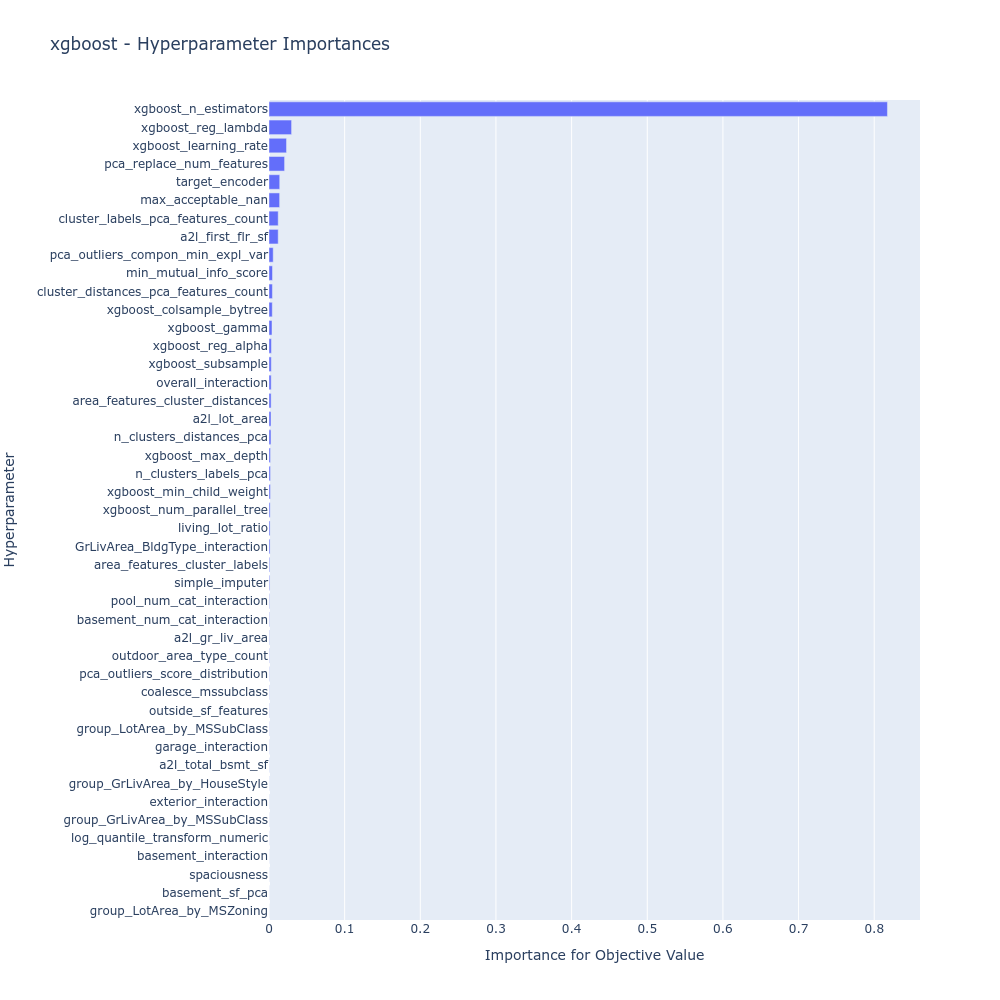

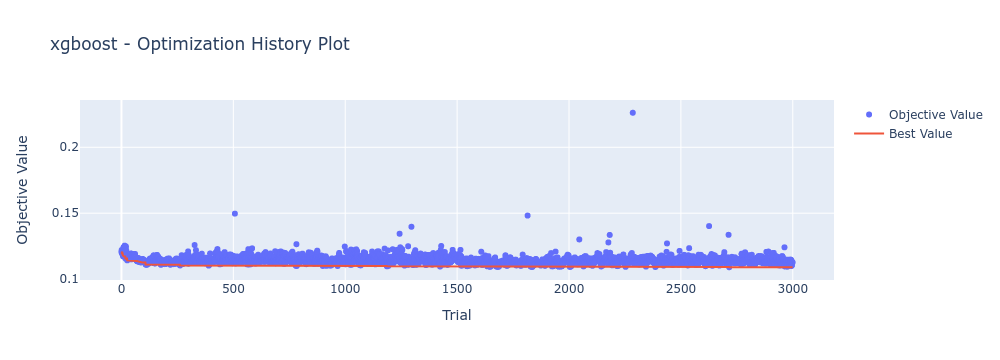

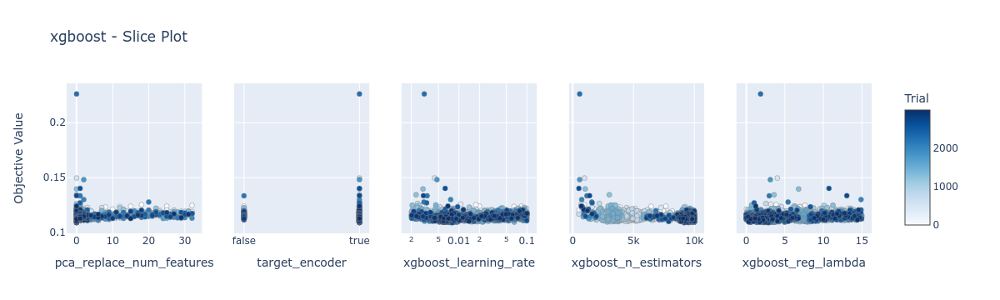

-------------------------------------------------------------------------------


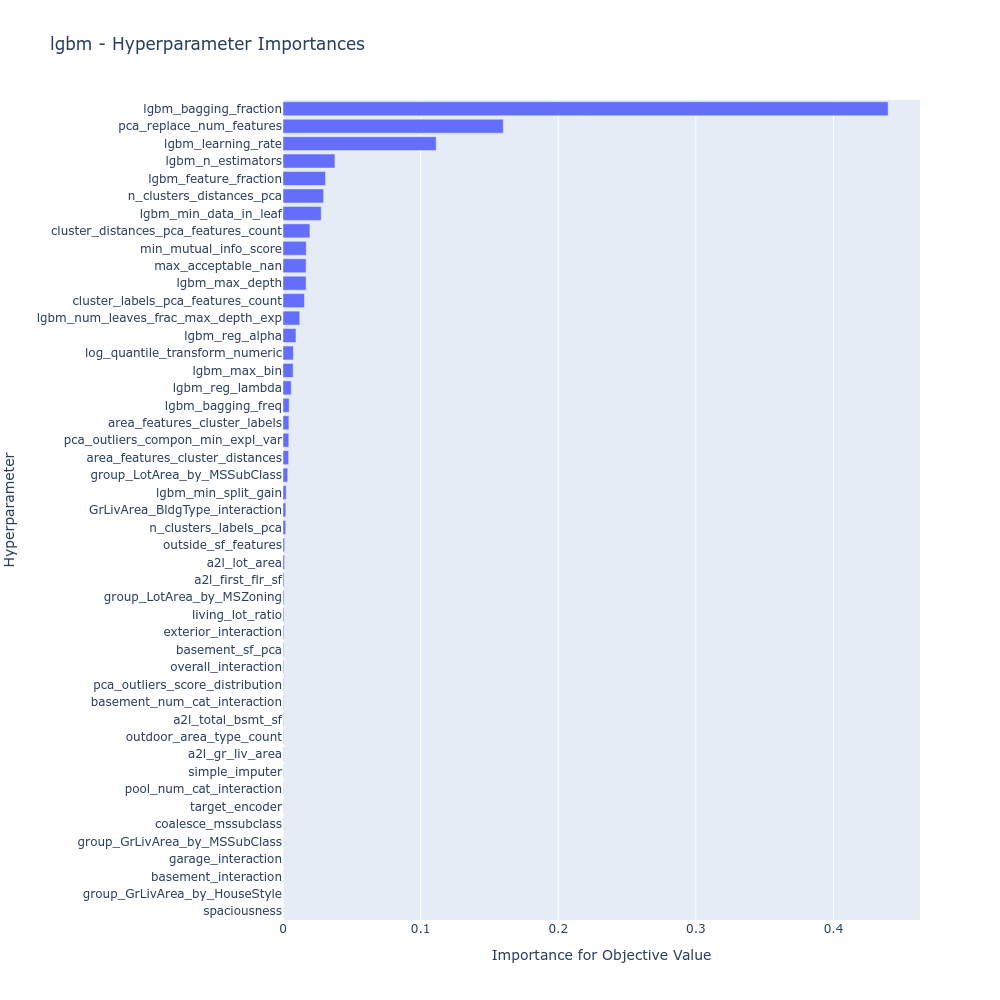

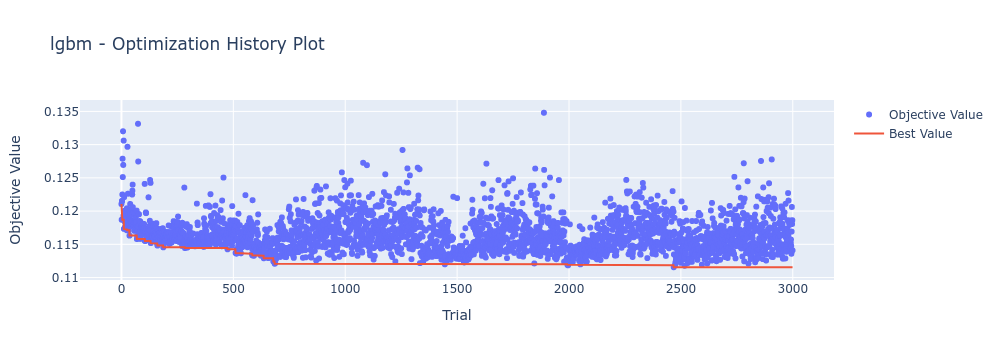

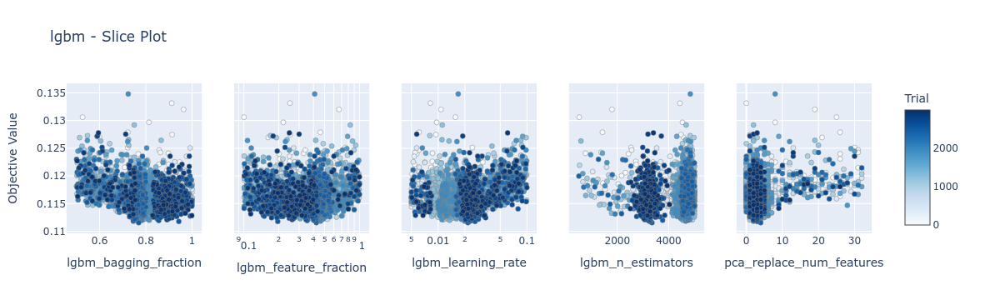

-------------------------------------------------------------------------------


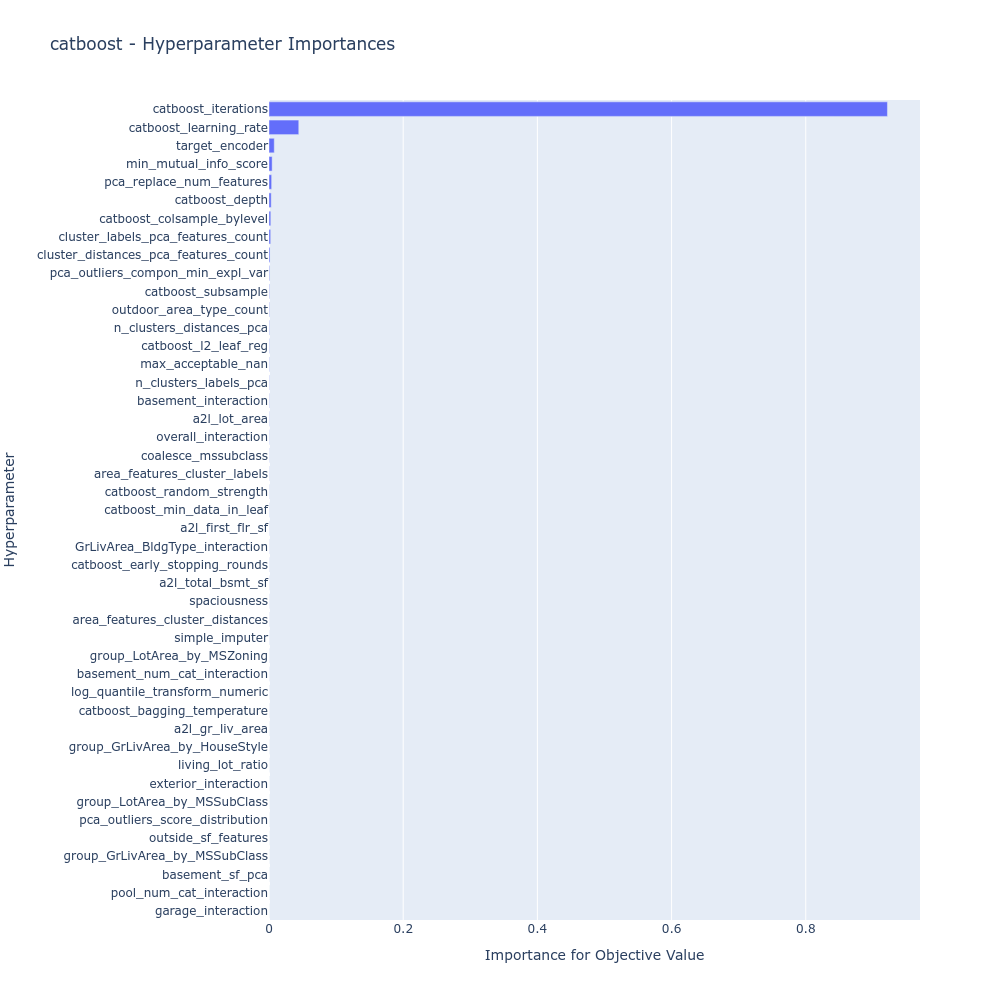

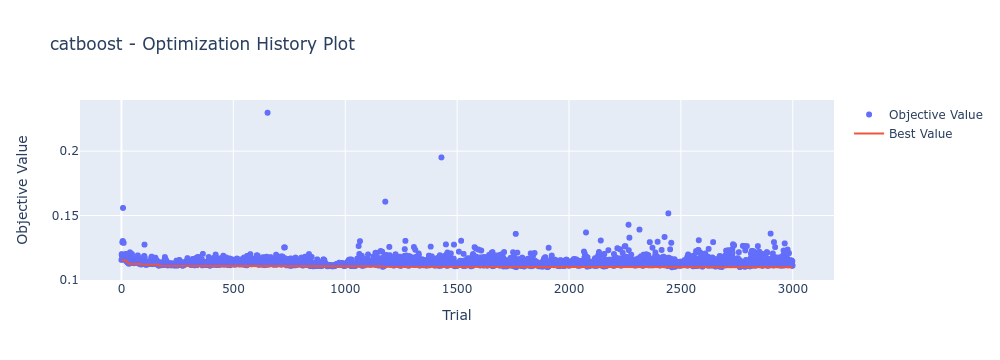

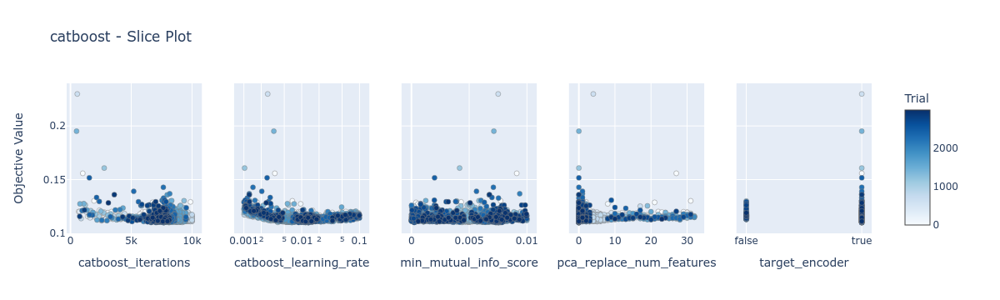

-------------------------------------------------------------------------------


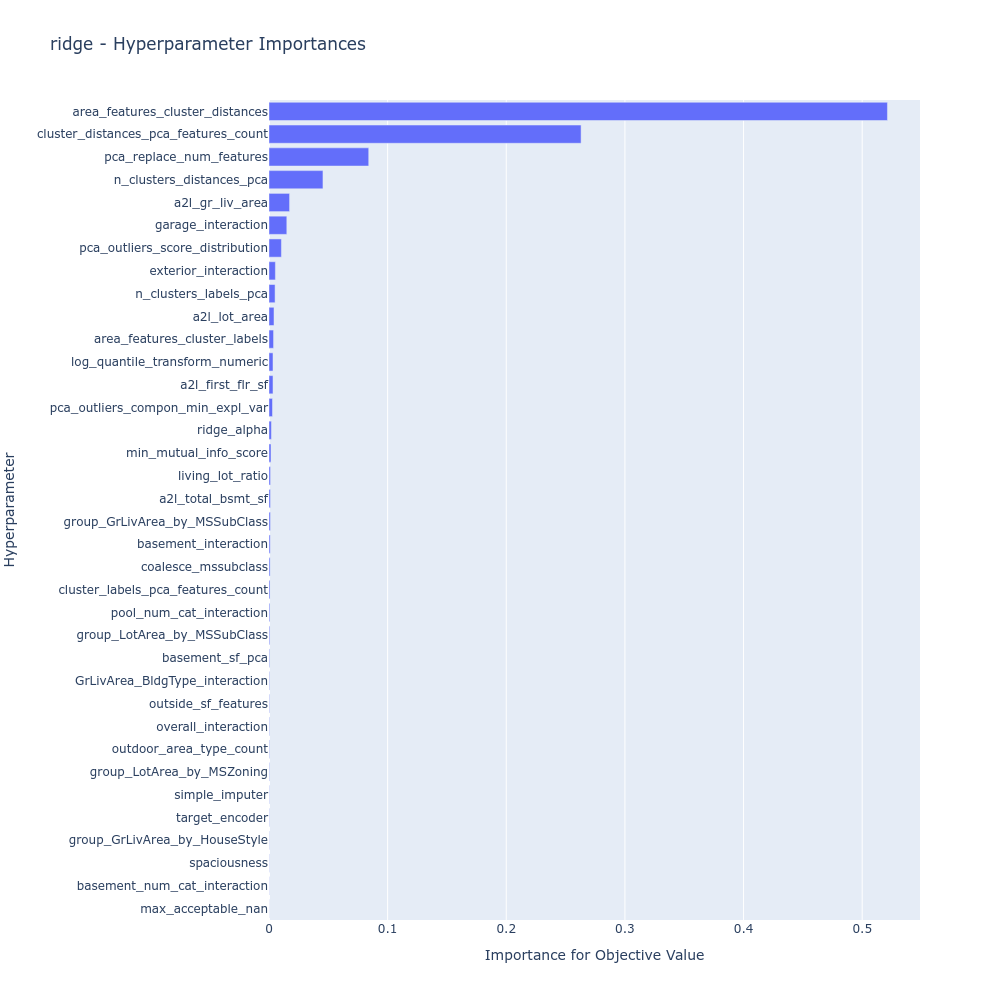

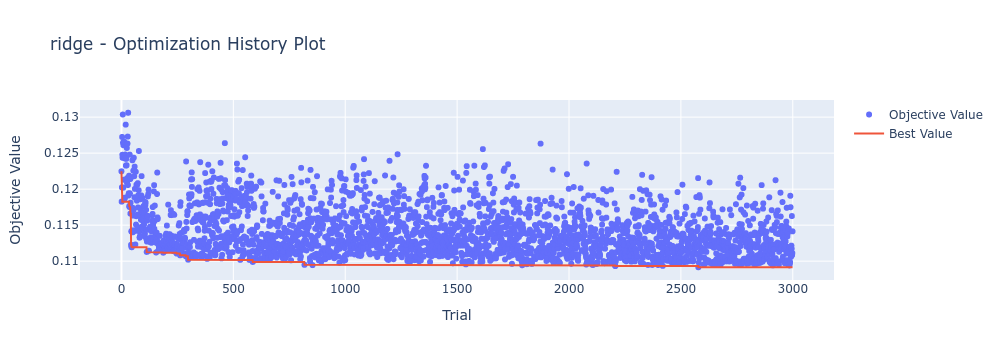

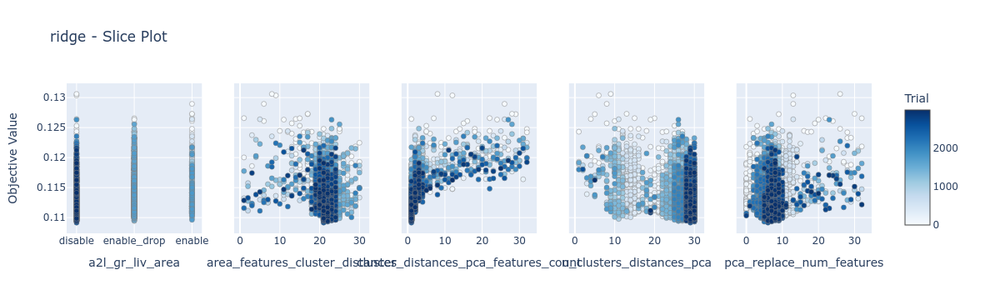

-------------------------------------------------------------------------------


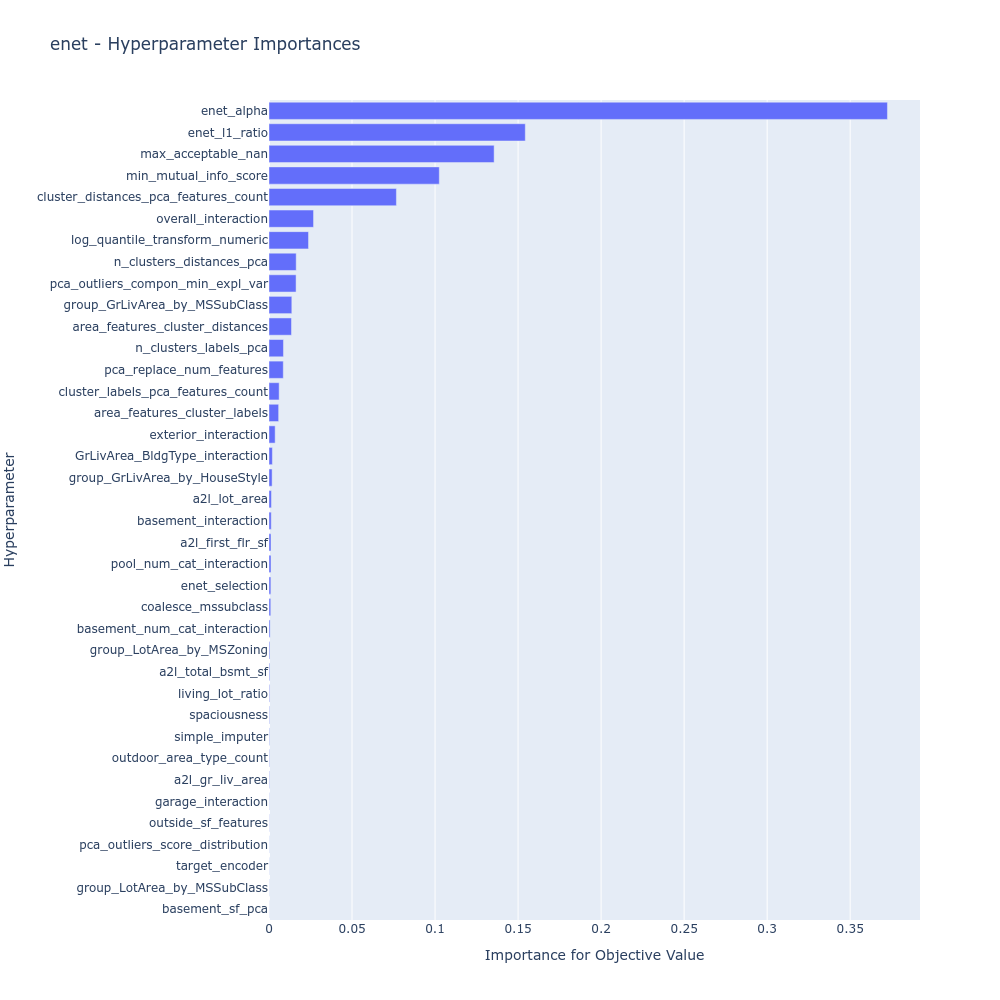

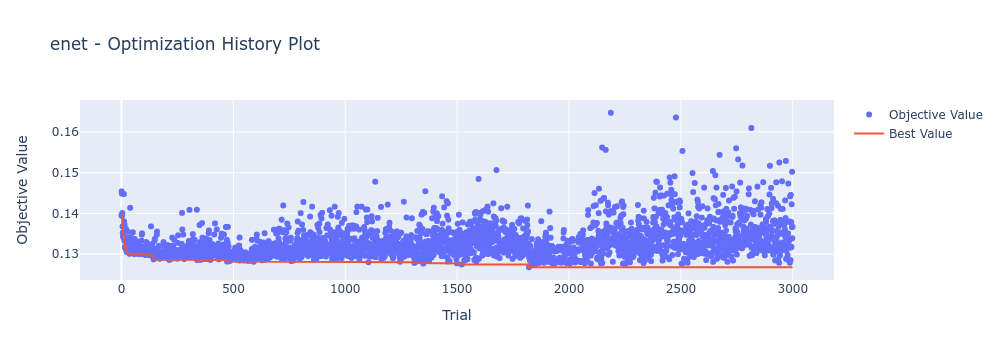

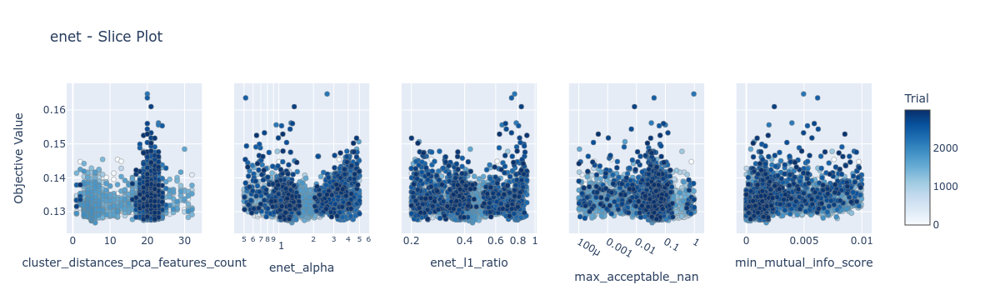

In [87]:
for m in baseline_models:
    print('-------------------------------------------------------------------------------')
    fig1 = px.bar(
        data_frame=param_importance[m],
        y='Hyperparameter',
        x='Importance for Objective Value',
        title='Hyperparameter Importances',
    )
    fig1.update_layout(
        title=m + ' - Hyperparameter Importances',
        yaxis=dict(autorange="reversed"),
        width=1000,
        height=1000,
    )

    fig2 = optuna.visualization.plot_optimization_history(study[m])
    fig2.update_layout(title=m + ' - Optimization History Plot', autosize=False, width=1000, height=360)

    fig3 = optuna.visualization.plot_slice(study[m], params=param_importance[m]['Hyperparameter'].to_list()[:5])
    fig3.update_layout(title=m + ' - Slice Plot', autosize=False, width=1200, height=360)

    fig1.show('png')
    fig2.show('png')
    fig3.show('png')

### 22.4.3. <a id='toc22_4_3_'></a>[Slice plots](#toc0_)

#### 22.4.3.1. <a id='toc22_4_3_1_'></a>[One model, choose five parameters](#toc0_)

['xgboost_n_estimators', 'xgboost_reg_lambda', 'xgboost_learning_rate', 'pca_replace_num_features', 'target_encoder']


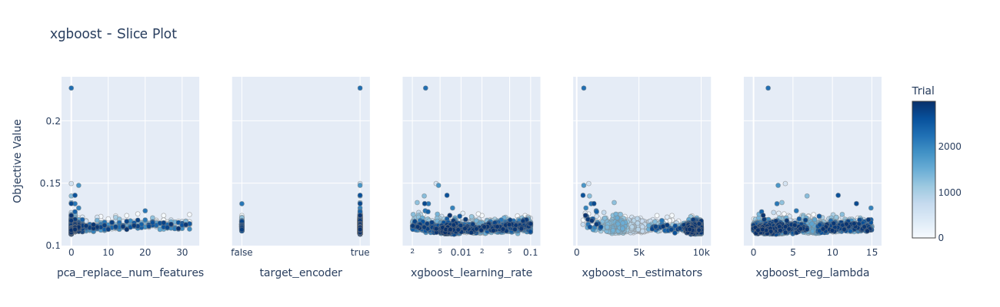

In [88]:
m = 'xgboost'
i_min = 0
p_list = param_importance[m]['Hyperparameter'].to_list()[i_min : i_min + 5]
print(p_list)
fig = optuna.visualization.plot_slice(study[m], params=p_list)
fig.update_layout(title=m + ' - Slice Plot', width=1300, height=400)
fig.show('png')

#### 22.4.3.2. <a id='toc22_4_3_2_'></a>[One parameter, all models](#toc0_)

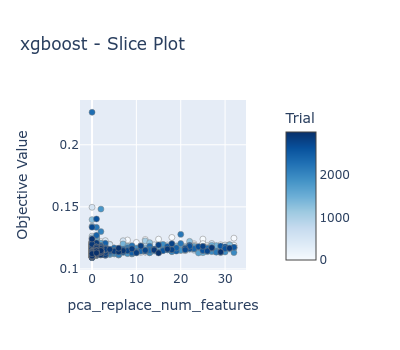

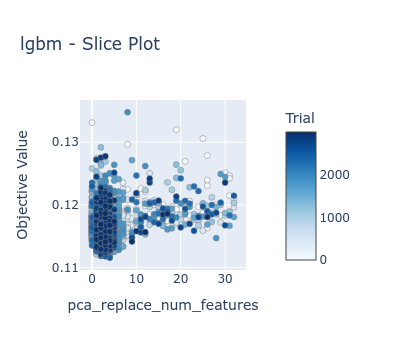

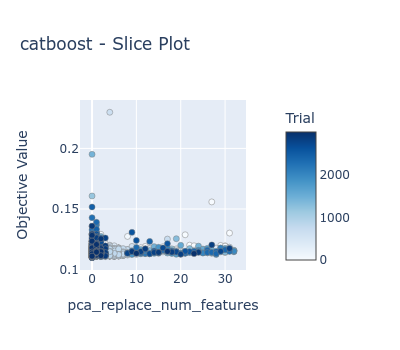

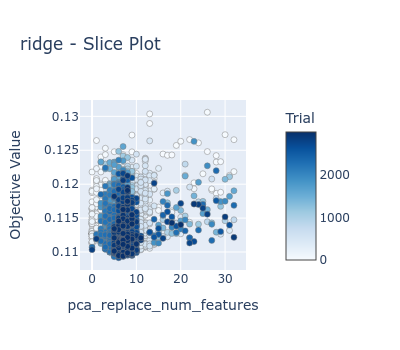

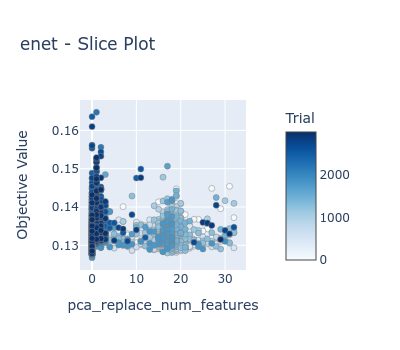

In [89]:
p = 'pca_replace_num_features'
for m in baseline_models:
    fig = optuna.visualization.plot_slice(study[m], params=[p])
    fig.update_layout(title=m + ' - Slice Plot', autosize=False, width=400, height=350)
    fig.show('png')

### 22.4.4. <a id='toc22_4_4_'></a>[All model-specific parameters](#toc0_)

No pipeline parameters, only model-specific parameters.

In [90]:
def visualize_model_parameters(m, log_x=False):
    trials_df = study[m].trials_dataframe()
    # filter columns
    trials_df = trials_df[['value'] + [c for c in trials_df.columns.to_list() if c.startswith('params_' + m)]]
    param_columns = trials_df.columns.to_list()[1:]
    n_col = 3
    n_row = int(np.ceil(len(param_columns) / n_col))
    fig, ax = plt.subplots(nrows=n_row, ncols=n_col, figsize=(4 * n_col, 3 * n_row))

    i = 0
    for c in param_columns:
        x = trials_df[c].to_list()
        y = trials_df['value'].to_list()
        if n_row == 1:
            ax_curr = ax[i]
        elif n_row > 1:
            ax_curr = ax[int(i / n_col), int(i % n_col)]
        ax_curr.scatter(x=x, y=y, s=5)
        if log_x and trials_df[c].dtype != 'object':
            x_ticks = [x for x in ax_curr.get_xticks() if x >= 0.0]
            ax_curr.set_xscale('log')
            ax_curr.get_xaxis().set_major_locator(FixedLocator(x_ticks))
            ax_curr.get_xaxis().set_major_formatter(ScalarFormatter())
        ax_curr.set_title(c)
        i += 1
    fig.show()
    print(param_columns)

#### 22.4.4.1. <a id='toc22_4_4_1_'></a>[xgboost](#toc0_)

/tmp/ipykernel_35469/4190299772.py:26: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



['params_xgboost_colsample_bytree', 'params_xgboost_gamma', 'params_xgboost_learning_rate', 'params_xgboost_max_depth', 'params_xgboost_min_child_weight', 'params_xgboost_n_estimators', 'params_xgboost_num_parallel_tree', 'params_xgboost_reg_alpha', 'params_xgboost_reg_lambda', 'params_xgboost_subsample']


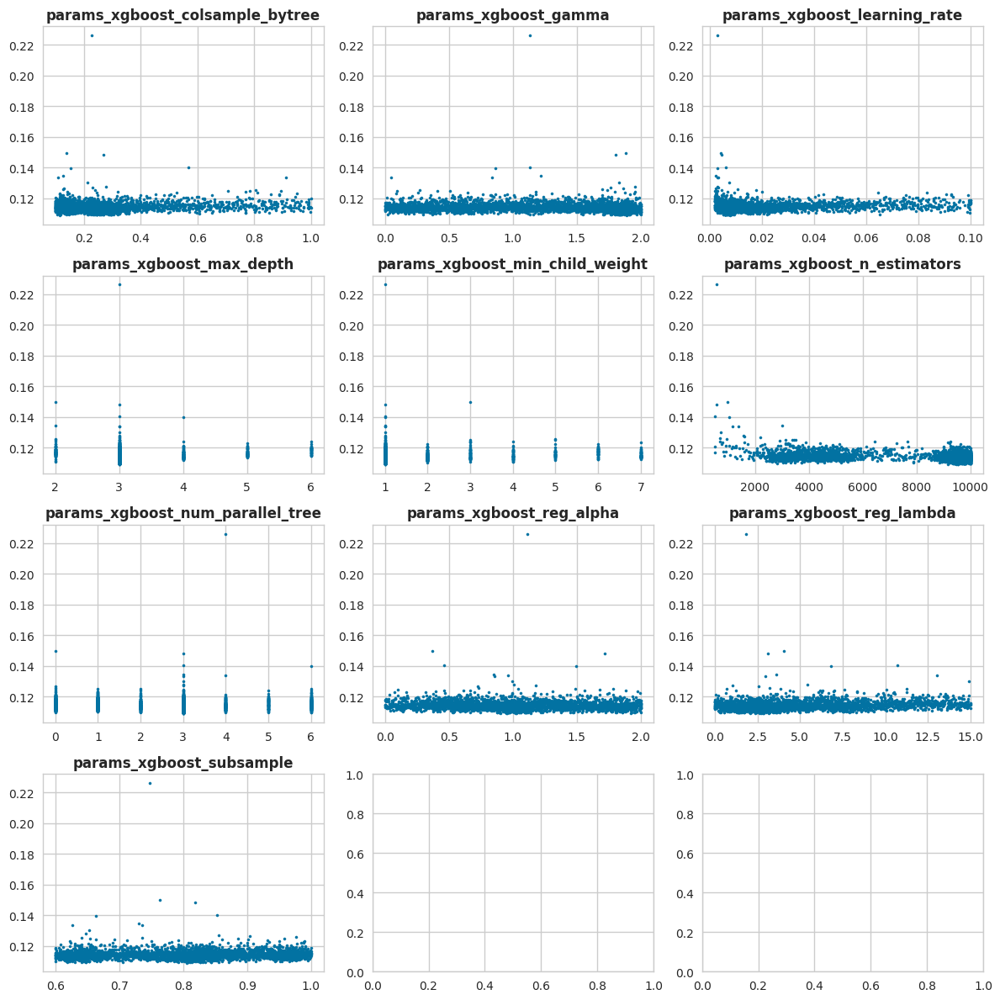

In [91]:
visualize_model_parameters('xgboost', log_x=False)

#### 22.4.4.2. <a id='toc22_4_4_2_'></a>[lgbm](#toc0_)

/tmp/ipykernel_35469/4190299772.py:26: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



['params_lgbm_bagging_fraction', 'params_lgbm_bagging_freq', 'params_lgbm_feature_fraction', 'params_lgbm_learning_rate', 'params_lgbm_max_bin', 'params_lgbm_max_depth', 'params_lgbm_min_data_in_leaf', 'params_lgbm_min_split_gain', 'params_lgbm_n_estimators', 'params_lgbm_num_leaves_frac_max_depth_exp', 'params_lgbm_reg_alpha', 'params_lgbm_reg_lambda']


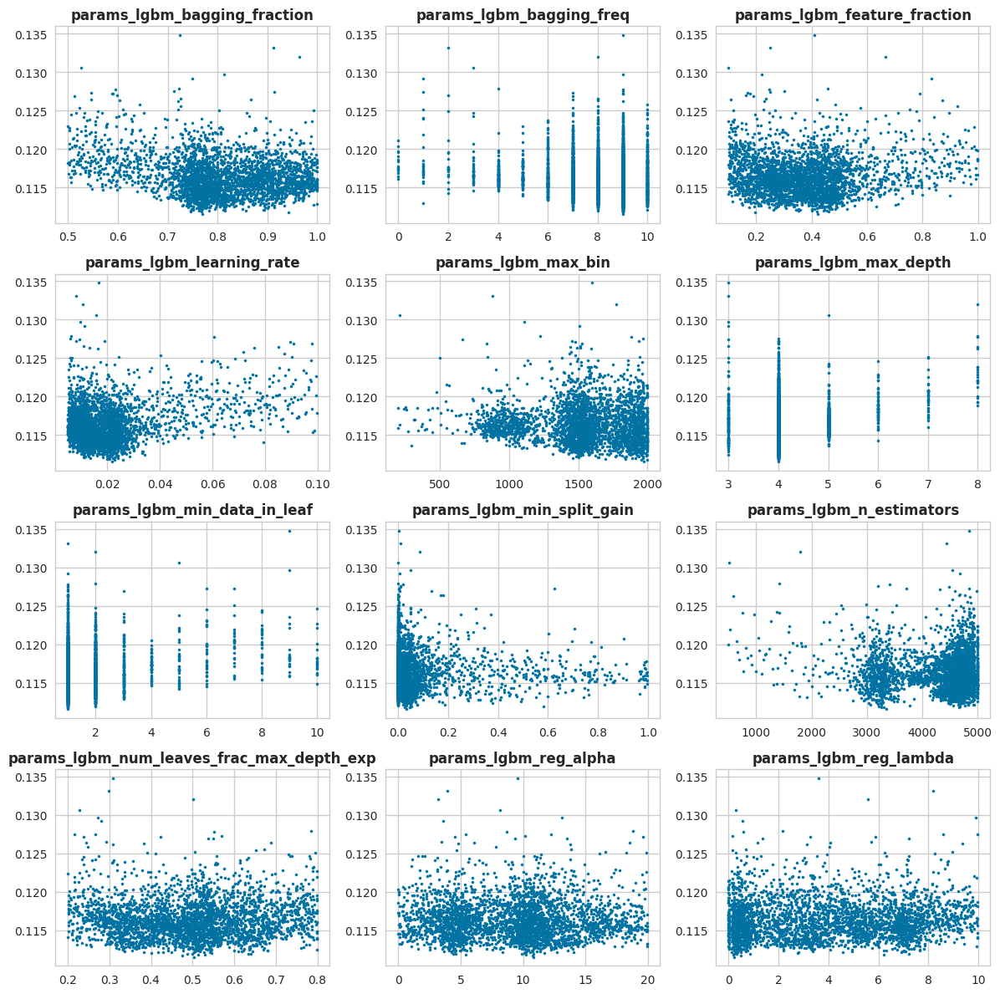

In [92]:
visualize_model_parameters('lgbm', log_x=False)

#### 22.4.4.3. <a id='toc22_4_4_3_'></a>[catboost](#toc0_)

/tmp/ipykernel_35469/4190299772.py:26: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



['params_catboost_bagging_temperature', 'params_catboost_colsample_bylevel', 'params_catboost_depth', 'params_catboost_early_stopping_rounds', 'params_catboost_iterations', 'params_catboost_l2_leaf_reg', 'params_catboost_learning_rate', 'params_catboost_min_data_in_leaf', 'params_catboost_random_strength', 'params_catboost_subsample']


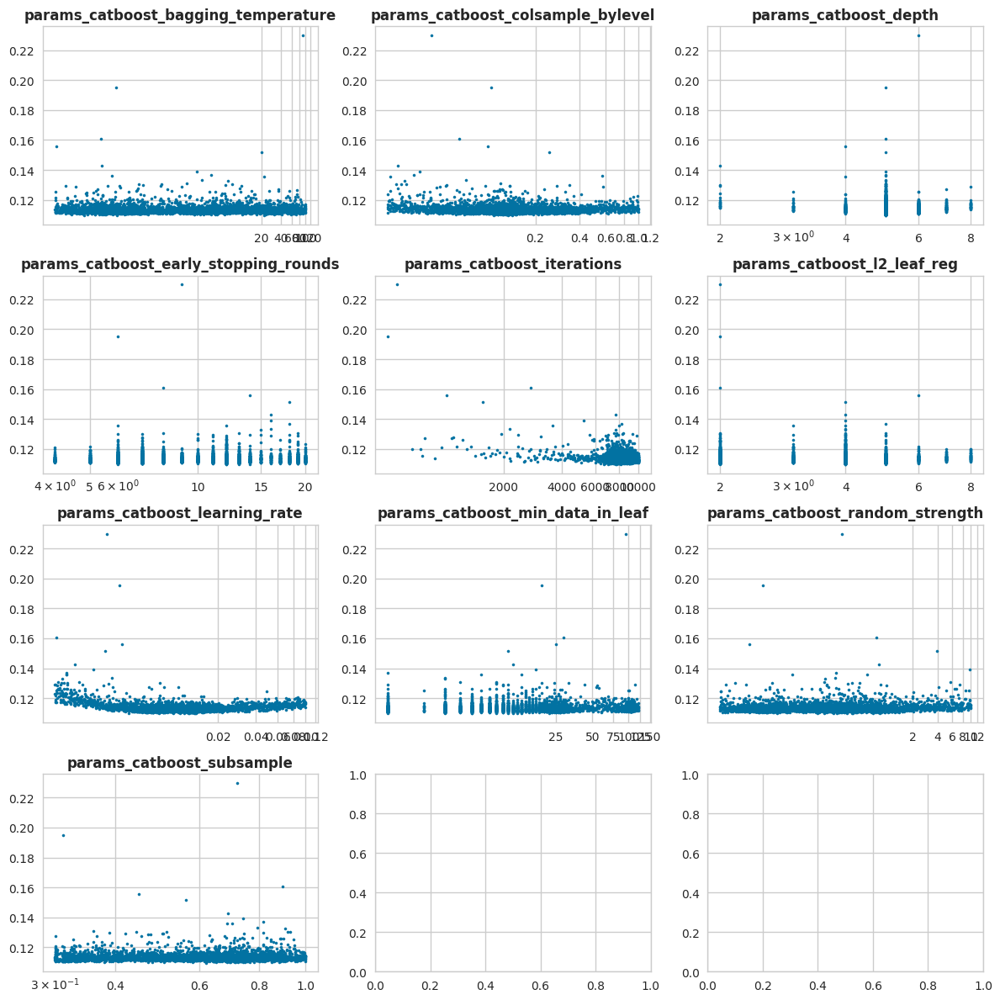

In [93]:
visualize_model_parameters('catboost', log_x=True)

#### 22.4.4.4. <a id='toc22_4_4_4_'></a>[ridge](#toc0_)

/tmp/ipykernel_35469/4190299772.py:26: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



['params_ridge_alpha']


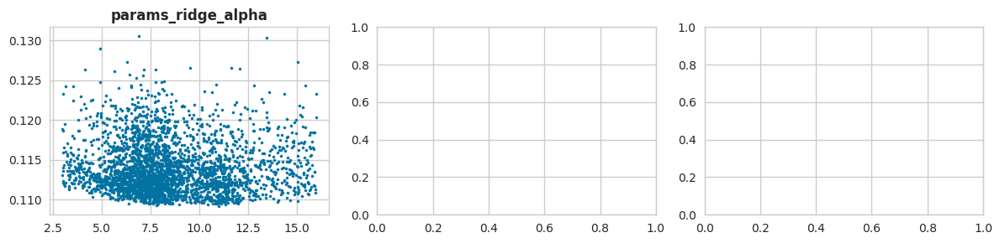

In [94]:
visualize_model_parameters('ridge', log_x=False)

#### 22.4.4.5. <a id='toc22_4_4_5_'></a>[enet](#toc0_)

/tmp/ipykernel_35469/4190299772.py:26: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



['params_enet_alpha', 'params_enet_l1_ratio', 'params_enet_selection']


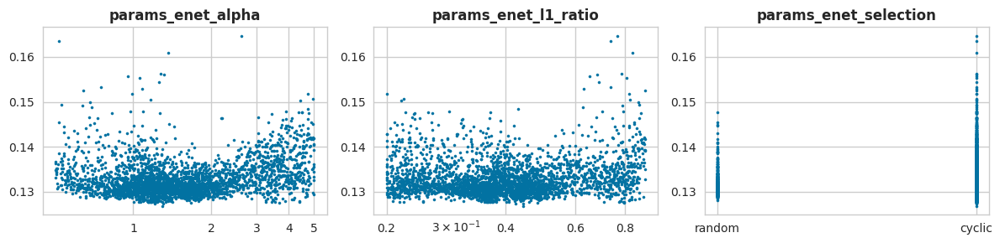

In [95]:
visualize_model_parameters('enet', log_x=True)

## 22.5. <a id='toc22_5_'></a>[Rebuild best models](#toc0_)

Using the best parameters discovered by Optuna, rebuild all single-model pipelines.

In [96]:
best_model = {}
for m in baseline_models:
    best_pipe_args = {}
    best_model_args = {}
    if m == 'xgboost':
        best_model_args = {'random_state': 0, 'verbosity': 0, 'n_jobs': 1}
    elif m == 'lgbm':
        best_model_args = {'random_state': 0, 'n_jobs': 1, 'verbose': -1}
    elif m == 'catboost':
        best_model_args = {
            'random_state': 0,
            'logging_level': 'Silent',
            'thread_count': 1,
        }
    elif m == 'ridge':
        best_model_args = {'random_state': 0}
    elif m == 'enet':
        best_model_args = {'random_state': 0, 'max_iter': 10000}
    for k, v in best_params[m].items():
        if k.startswith(m + '_'):
            best_model_args[k.split('_', 1)[1]] = v
        else:
            best_pipe_args[k] = v

    # TODO: fix these exceptions here and in make_model_args()
    if m == 'xgboost':
        if best_model_args['num_parallel_tree'] == 0:
            best_model_args['num_parallel_tree'] = None
    if m == 'lgbm':
        best_model_args['num_leaves'] = round(
            best_model_args['num_leaves_frac_max_depth_exp'] * (2 ** best_model_args['max_depth'])
        )
        del best_model_args['num_leaves_frac_max_depth_exp']

    print(best_model_args)
    pipe_preproc = rebuild_pipe_preproc_from_args(pipe_args=best_pipe_args)
    best_model[m] = rebuild_model_pipe_from_args(model_name=m, pipe_preproc=pipe_preproc, model_args=best_model_args)

{'random_state': 0, 'verbosity': 0, 'n_jobs': 1, 'n_estimators': 9167, 'max_depth': 3, 'learning_rate': 0.007954996213047077, 'gamma': 1.8878965142297428, 'min_child_weight': 1, 'subsample': 0.8057864465614245, 'colsample_bytree': 0.11573611124523174, 'reg_alpha': 1.9207869752515219, 'reg_lambda': 2.8588908361664043, 'num_parallel_tree': 3}
{'random_state': 0, 'n_jobs': 1, 'verbose': -1, 'learning_rate': 0.02165737167195487, 'reg_alpha': 10.850386698476989, 'reg_lambda': 0.2304919757106442, 'max_depth': 4, 'n_estimators': 3351, 'bagging_freq': 9, 'bagging_fraction': 0.7690824854888628, 'feature_fraction': 0.423111768380243, 'max_bin': 1974, 'min_data_in_leaf': 1, 'min_split_gain': 0.031341064357919134, 'num_leaves': 8}
{'random_state': 0, 'logging_level': 'Silent', 'thread_count': 1, 'iterations': 7657, 'learning_rate': 0.013038680410097994, 'l2_leaf_reg': 4, 'random_strength': 0.0479014817267622, 'early_stopping_rounds': 14, 'depth': 5, 'subsample': 0.6192770345762606, 'bagging_temper

/home/florin/.local/lib/python3.11/site-packages/sklearn/preprocessing/_function_transformer.py:345: UserWarning:

With transform="pandas", `func` should return a DataFrame to follow the set_output API.



In [97]:
best_model['xgboost']

Pipeline(steps=[('preprocessing',
                 Pipeline(steps=[('mark_pca_outliers',
                                  ColumnTransformer(transformers=[('mark_pca_outliers',
                                                                   Pipeline(steps=[('impute_num_ohe_cat_standard',
                                                                                    ColumnTransformer(n_jobs=1,
                                                                                                      transformers=[('impute_standardize_numeric',
                                                                                                                     Pipeline(steps=[('simple_imputer',
                                                                                                                                      SimpleImputer()),
                                                                                                                                     ('standard_scaler',
                                                                                                                                      StandardScaler())]),
                                                                                                                     <sklearn.compose._c...
                              gpu_id=None, grow_policy=None,
                              importance_type=None,
                              interaction_constraints=None,
                              learning_rate=0.007954996213047077, max_bin=None,
                              max_cat_threshold=None, max_cat_to_onehot=None,
                              max_delta_step=None, max_depth=3, max_leaves=None,
                              min_child_weight=1, missing=nan,
                              monotone_constraints=None, n_estimators=9167,
                              n_jobs=1, num_parallel_tree=3, predictor=None,
                              random_state=0, ...))])

In [98]:
best_model['lgbm']

Pipeline(steps=[('preprocessing',
                 Pipeline(steps=[('mark_pca_outliers',
                                  ColumnTransformer(transformers=[('mark_pca_outliers',
                                                                   Pipeline(steps=[('impute_num_ohe_cat_standard',
                                                                                    ColumnTransformer(n_jobs=1,
                                                                                                      transformers=[('impute_standardize_numeric',
                                                                                                                     Pipeline(steps=[('simple_imputer',
                                                                                                                                      SimpleImputer()),
                                                                                                                                     ('standard_scaler',
                                                                                                                                      StandardScaler())]),
                                                                                                                     <sklearn.compose._c...
                ('lgbm',
                 LGBMRegressor(bagging_fraction=0.7690824854888628,
                               bagging_freq=9,
                               feature_fraction=0.423111768380243,
                               learning_rate=0.02165737167195487, max_bin=1974,
                               max_depth=4, min_data_in_leaf=1,
                               min_split_gain=0.031341064357919134,
                               n_estimators=3351, n_jobs=1, num_leaves=8,
                               random_state=0, reg_alpha=10.850386698476989,
                               reg_lambda=0.2304919757106442, verbose=-1))])

In [99]:
best_model['catboost']

Pipeline(steps=[('preprocessing',
                 Pipeline(steps=[('mark_pca_outliers',
                                  ColumnTransformer(transformers=[('mark_pca_outliers',
                                                                   Pipeline(steps=[('impute_num_ohe_cat_standard',
                                                                                    ColumnTransformer(n_jobs=1,
                                                                                                      transformers=[('impute_standardize_numeric',
                                                                                                                     Pipeline(steps=[('simple_imputer',
                                                                                                                                      SimpleImputer()),
                                                                                                                                     ('standard_scaler',
                                                                                                                                      StandardScaler())]),
                                                                                                                     <sklearn.compose._c...
                                                                    'LandSlope',
                                                                    'YrMoSold',
                                                                    'LowQualFinSF',
                                                                    'PoolArea',
                                                                    'FireplaceQu',
                                                                    'MiscVal',
                                                                    'LotFrontage',
                                                                    'MiscFeature',
                                                                    'Condition2',
                                                                    'RoofMatl',
                                                                    'Fence',
                                                                    'MasVnrType',
                                                                    'PoolQC'])],
                                                    verbose_feature_names_out=False))])),
                ('categorical_to_numeric',
                 FunctionTransformer(func=<function cat_to_num at 0x7ff036d65bc0>)),
                ('catboost',
                 <catboost.core.CatBoostRegressor object at 0x7fefd5160210>)])

In [100]:
best_model['ridge']

Pipeline(steps=[('preprocessing',
                 Pipeline(steps=[('mark_pca_outliers',
                                  ColumnTransformer(transformers=[('mark_pca_outliers',
                                                                   Pipeline(steps=[('impute_num_ohe_cat_standard',
                                                                                    ColumnTransformer(n_jobs=1,
                                                                                                      transformers=[('impute_standardize_numeric',
                                                                                                                     Pipeline(steps=[('simple_imputer',
                                                                                                                                      SimpleImputer()),
                                                                                                                                     ('standard_scaler',
                                                                                                                                      StandardScaler())]),
                                                                                                                     <sklearn.compose._c...
                                                                handle_unknown='infrequent_if_exist',
                                                                min_frequency=1,
                                                                sparse_output=False),
                                                  <sklearn.compose._column_transformer.make_column_selector object at 0x7ff00ccd8250>)],
                                   verbose_feature_names_out=False)),
                ('ridge',
                 TransformedTargetRegressor(regressor=Ridge(alpha=10.996218159097683,
                                                            random_state=0),
                                            transformer=QuantileTransformer(output_distribution='normal',
                                                                            random_state=0)))])

In [101]:
best_model['enet']

Pipeline(steps=[('preprocessing',
                 Pipeline(steps=[('mark_pca_outliers',
                                  ColumnTransformer(transformers=[('mark_pca_outliers',
                                                                   Pipeline(steps=[('impute_num_ohe_cat_standard',
                                                                                    ColumnTransformer(n_jobs=1,
                                                                                                      transformers=[('impute_standardize_numeric',
                                                                                                                     Pipeline(steps=[('simple_imputer',
                                                                                                                                      SimpleImputer()),
                                                                                                                                     ('standard_scaler',
                                                                                                                                      StandardScaler())]),
                                                                                                                     <sklearn.compose._c...
                                                                   OneHotEncoder(dtype=<class 'int'>,
                                                                                 handle_unknown='infrequent_if_exist',
                                                                                 min_frequency=1,
                                                                                 sparse_output=False),
                                                                   <sklearn.compose._column_transformer.make_column_selector object at 0x7fefe649e3d0>)],
                                                    verbose_feature_names_out=False)),
                                 ('standard_scaler', StandardScaler())])),
                ('enet',
                 ElasticNet(alpha=1.300552633069198,
                            l1_ratio=0.44339141668657467, max_iter=10000,
                            random_state=0))])

## 22.6. <a id='toc22_6_'></a>[Best models performance test](#toc0_)

Test pipelines rebuilt from the best Optuna parameters. Their performance should match the results from the best Optuna trials.

In [132]:
test_all_models('Pipeline_Single_Model', pipe=best_model, X=X, y=y)

Pipeline_Single_Model
xgboost  0.10898826066371538
lgbm     0.11154989023087401
catboost 0.10978151743588008
ridge    0.10915505517186783
enet     0.1267509045592845



## 22.7. <a id='toc22_7_'></a>[Feature importance](#toc0_)

Fit the best pipelines to train data, extract feature importance from the models.

In [103]:
best_model_fi = best_model
fi = {}

for m in tqdm(baseline_models):
    best_model_fi[m].fit(X, y)

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:31<00:00,  6.34s/it]


### 22.7.1. <a id='toc22_7_1_'></a>[xgboost](#toc0_)

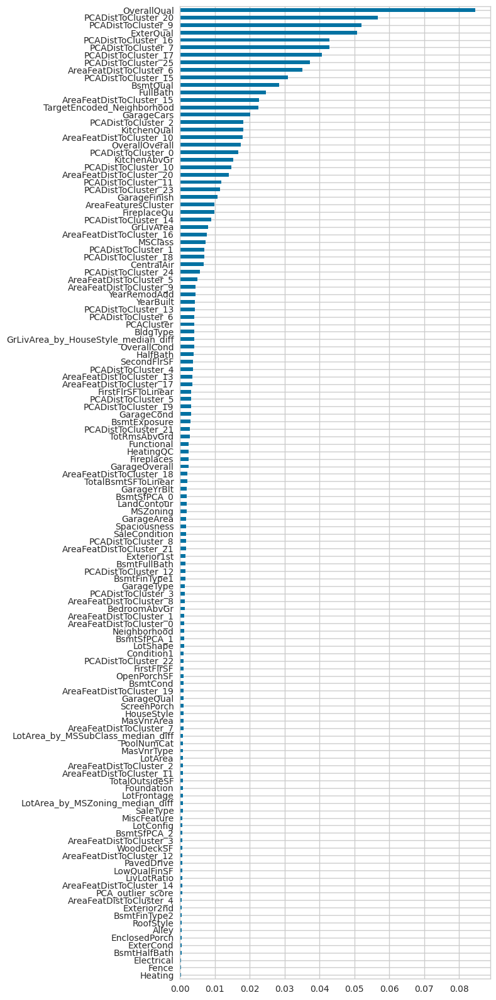

In [104]:
fi['xgboost'] = pd.DataFrame(
    {
        'importance': best_model_fi['xgboost']._final_estimator.feature_importances_,
    },
    index=best_model_fi['xgboost']._final_estimator.feature_names_in_,
).sort_values(by='importance')

_ = fi['xgboost'].plot(kind='barh', legend=False, figsize=(8, 16))

In [105]:
print('features dropped by the pipeline optimization:')
best_model_fi['xgboost'].named_steps['preprocessing'].named_steps['drop_features_final'].transformers[0][2]

features dropped by the pipeline optimization:


['ThreeSeasonPorch',
 'TotalBsmtSF',
 'Utilities',
 'Street',
 'Condition2',
 'RoofMatl',
 'LandSlope',
 'YrMoSold',
 'BsmtFinSF2',
 'PoolQC',
 'BsmtUnfSF',
 'PoolArea',
 'BsmtFinSF1',
 'MSSubClass',
 'MiscVal']

### 22.7.2. <a id='toc22_7_2_'></a>[lgbm](#toc0_)

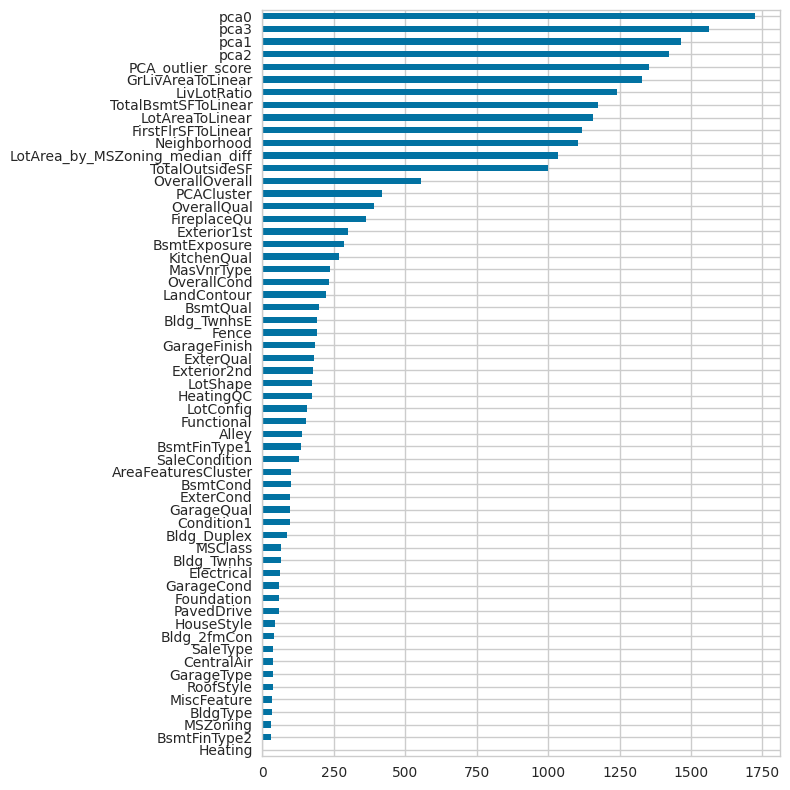

In [106]:
fi['lgbm'] = pd.DataFrame(
    {
        'importance': best_model_fi['lgbm']._final_estimator.feature_importances_,
    },
    index=best_model_fi['lgbm']._final_estimator.feature_name_,
).sort_values(by='importance')

_ = fi['lgbm'].plot(kind='barh', legend=False, figsize=(8, 8))

In [107]:
print('features dropped by the pipeline optimization:')
best_model_fi['lgbm'].named_steps['preprocessing'].named_steps['drop_features_final'].transformers[0][2]

features dropped by the pipeline optimization:


['ThreeSeasonPorch',
 'SecondFlrSF',
 'BsmtHalfBath',
 'BsmtFinSF2',
 'OpenPorchSF',
 'BsmtFinSF1',
 'KitchenAbvGr',
 'Utilities',
 'Street',
 'MasVnrArea',
 'WoodDeckSF',
 'HalfBath',
 'ScreenPorch',
 'LotArea',
 'LandSlope',
 'YrMoSold',
 'LowQualFinSF',
 'PoolArea',
 'BsmtUnfSF',
 'Fireplaces',
 'MiscVal',
 'LotFrontage',
 'YearBuilt',
 'TotRmsAbvGrd',
 'GarageCars',
 'TotalBsmtSF',
 'Condition2',
 'RoofMatl',
 'GrLivArea',
 'FullBath',
 'EnclosedPorch',
 'BsmtFullBath',
 'MSSubClass',
 'FirstFlrSF',
 'GarageYrBlt',
 'GarageArea',
 'BedroomAbvGr',
 'YearRemodAdd',
 'PoolQC']

### 22.7.3. <a id='toc22_7_3_'></a>[catboost](#toc0_)

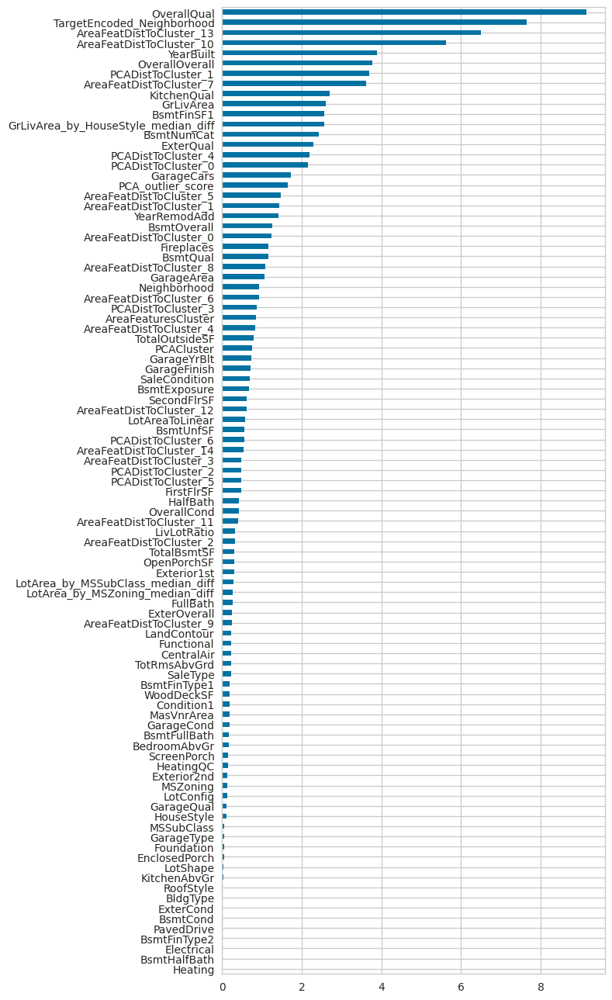

In [108]:
fi['catboost'] = pd.DataFrame(
    {
        'importance': best_model_fi['catboost']._final_estimator.feature_importances_,
    },
    index=best_model_fi['catboost']._final_estimator.feature_names_,
).sort_values(by='importance')

_ = fi['catboost'].plot(kind='barh', legend=False, figsize=(8, 13))

In [109]:
print('features dropped by the pipeline optimization:')
best_model_fi['catboost'].named_steps['preprocessing'].named_steps['drop_features_final'].transformers[0][2]

features dropped by the pipeline optimization:


['ThreeSeasonPorch',
 'Alley',
 'BsmtFinSF2',
 'Utilities',
 'Street',
 'LotArea',
 'LandSlope',
 'YrMoSold',
 'LowQualFinSF',
 'PoolArea',
 'FireplaceQu',
 'MiscVal',
 'LotFrontage',
 'MiscFeature',
 'Condition2',
 'RoofMatl',
 'Fence',
 'MasVnrType',
 'PoolQC']

### 22.7.4. <a id='toc22_7_4_'></a>[ridge](#toc0_)

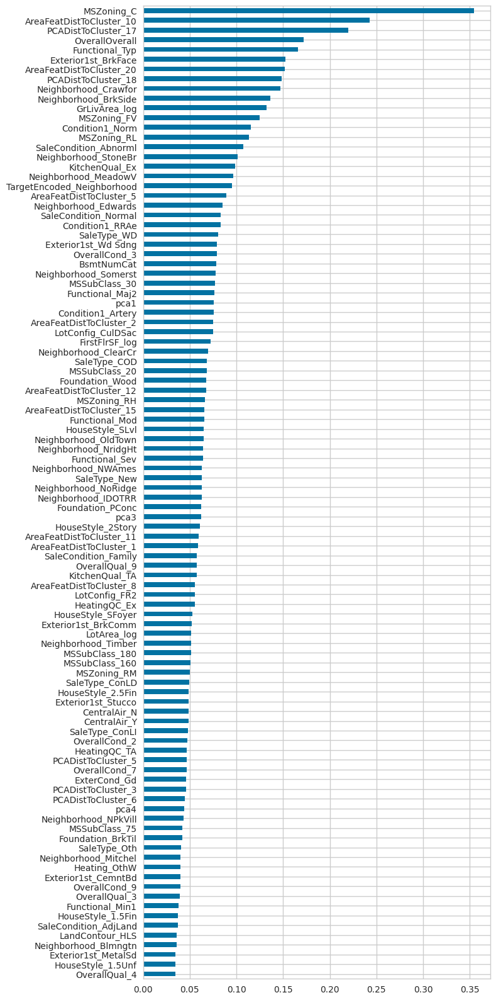

In [110]:
# features are scaled before the model
fi['ridge'] = pd.DataFrame(
    {
        'importance': np.abs(best_model_fi['ridge']._final_estimator.regressor_.coef_),
    },
    index=best_model_fi['ridge']._final_estimator.regressor_.feature_names_in_,
).sort_values(by='importance', ascending=False)

fi_ridge = fi['ridge'].head(100)
_ = fi_ridge.sort_values(by='importance').plot(kind='barh', legend=False, figsize=(8, 16))

In [111]:
print('features dropped by the pipeline optimization:')
best_model_fi['ridge'].named_steps['preprocessing'].named_steps['drop_features_final'].transformers[0][2]

features dropped by the pipeline optimization:


['ThreeSeasonPorch',
 'BsmtFinType1',
 'SecondFlrSF',
 'Alley',
 'GarageCond',
 'GarageFinish',
 'BsmtHalfBath',
 'BsmtExposure',
 'BsmtFinSF2',
 'OpenPorchSF',
 'BsmtFinSF1',
 'BsmtCond',
 'KitchenAbvGr',
 'Utilities',
 'Street',
 'MasVnrArea',
 'WoodDeckSF',
 'HalfBath',
 'ScreenPorch',
 'LotArea',
 'LandSlope',
 'YrMoSold',
 'LowQualFinSF',
 'PoolArea',
 'BsmtUnfSF',
 'FireplaceQu',
 'Fireplaces',
 'MiscVal',
 'LotFrontage',
 'YearBuilt',
 'TotRmsAbvGrd',
 'GarageCars',
 'GarageQual',
 'TotalBsmtSF',
 'MiscFeature',
 'BsmtQual',
 'Condition2',
 'Fence',
 'GrLivArea',
 'RoofMatl',
 'GarageType',
 'FullBath',
 'EnclosedPorch',
 'BsmtFullBath',
 'FirstFlrSF',
 'GarageYrBlt',
 'Electrical',
 'MasVnrType',
 'GarageArea',
 'BedroomAbvGr',
 'BsmtFinType2',
 'YearRemodAdd',
 'PoolQC']

### 22.7.5. <a id='toc22_7_5_'></a>[enet](#toc0_)

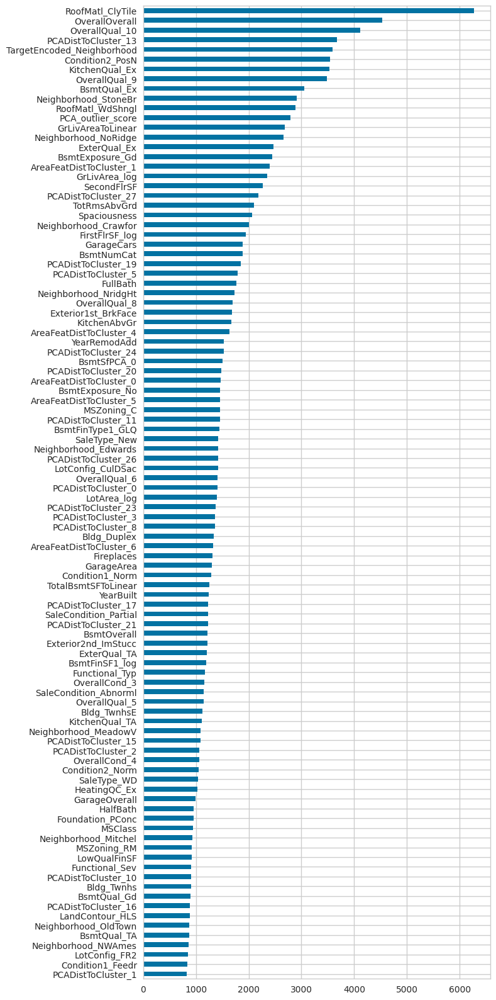

In [112]:
# features are scaled before the model
fi['enet'] = pd.DataFrame(
    {
        'importance': np.abs(best_model_fi['enet']._final_estimator.coef_),
    },
    index=best_model_fi['enet']._final_estimator.feature_names_in_,
).sort_values(by='importance', ascending=False)

fi_enet = fi['enet'].head(100)
_ = fi_enet.sort_values(by='importance').plot(kind='barh', legend=False, figsize=(8, 16))

In [113]:
print('features dropped by the pipeline optimization:')
best_model_fi['enet'].named_steps['preprocessing'].named_steps['drop_features_final'].transformers[0][2]

features dropped by the pipeline optimization:


['ThreeSeasonPorch',
 'BldgType',
 'Alley',
 'GarageCond',
 'GarageFinish',
 'BsmtFinSF2',
 'OpenPorchSF',
 'BsmtFinSF1',
 'Utilities',
 'Street',
 'MasVnrArea',
 'WoodDeckSF',
 'LandSlope',
 'LotArea',
 'YrMoSold',
 'PoolArea',
 'BsmtUnfSF',
 'FireplaceQu',
 'MiscVal',
 'GarageQual',
 'LotFrontage',
 'TotalBsmtSF',
 'MiscFeature',
 'Fence',
 'GrLivArea',
 'GarageType',
 'EnclosedPorch',
 'MSSubClass',
 'FirstFlrSF',
 'MasVnrType',
 'PoolQC']

# 23. <a id='toc23_'></a>[Ensemble models](#toc0_)

Create ensemble models (voting / stacking regressors), optimize them with Optuna, test performance.

## 23.1. <a id='toc23_1_'></a>[Voting regressor](#toc0_)

In [114]:
# if True, this will restart optimization from scratch
# and will delete all optimization history
OPTUNA_VOTING_REGRESSOR_RESET = False

if OPTUNA_VOTING_REGRESSOR_RESET:
    try:
        optuna.delete_study(
            study_name='vr',
            storage=OPTUNA_URL,
        )
    except:
        pass

study_vr = optuna.create_study(
    direction='minimize',
    study_name='vr',
    storage=OPTUNA_URL,
    load_if_exists=True,
)

[I 2023-08-14 13:20:32,869] Using an existing study with name 'vr' instead of creating a new one.


In [115]:
def objective_vr(trial, best_model):
    weight = {}
    for m in best_model.keys():
        weight[m] = trial.suggest_float('weight_' + m, 0.0, 1.0, log=False)

    vr = VotingRegressor(
        estimators=[('pipe_' + m, best_model[m]) for m in best_model.keys()],
        weights=[weight[m] for m in best_model.keys()],
        n_jobs=1,
    )

    return test_performance(pipe=vr, X=X, y=y, n_splits=num_folds, n_jobs=cpu_count)


# drop ElasticNet since it gets zeroed out anyway
best_model_short = {k: best_model[k] for k in best_model.keys() if k not in ['enet']}
# study_vr.optimize(lambda trial: objective_vr(trial, best_model_short), timeout=36000, catch=(ValueError,), show_progress_bar=False)

best trial: 211, best score: 0.10442150749133243


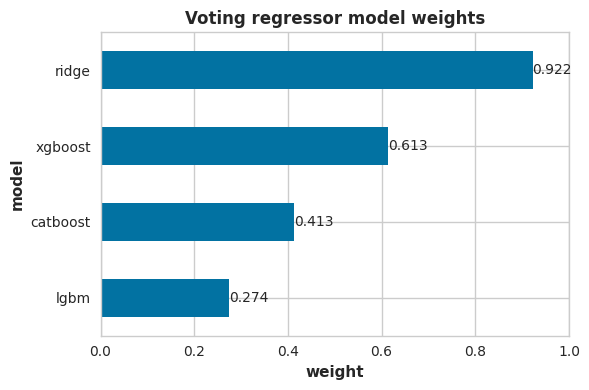

In [116]:
best_trial_vr = study_vr.best_trial
best_params_vr = best_trial_vr.params
print(f'best trial: {best_trial_vr.number}, best score: {best_trial_vr.value}')

best_params_vr_df = pd.DataFrame(
    {
        'model': [m.split('_')[1] for m in best_params_vr.keys()],
        'weight': [w for w in best_params_vr.values()],
    }
).sort_values(by='weight')

ax = best_params_vr_df.plot(
    kind='barh',
    y='weight',
    x='model',
    xlim=(0.0, 1.0),
    xlabel='weight',
    ylabel='model',
    legend=False,
    title='Voting regressor model weights',
    figsize=(6, 4),
)
ax.bar_label(container=ax.containers[0], labels=[f'{w:.3f}' for w in best_params_vr_df['weight']])
plt.show()

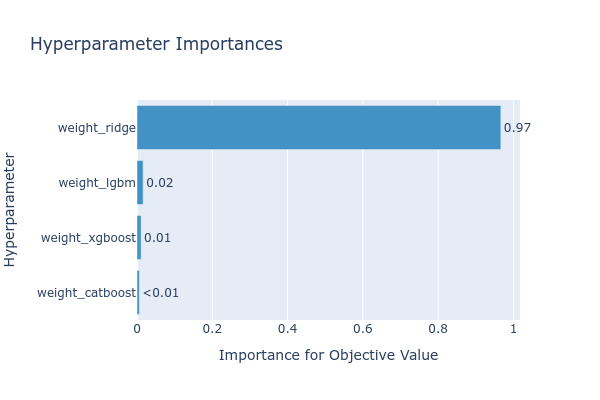

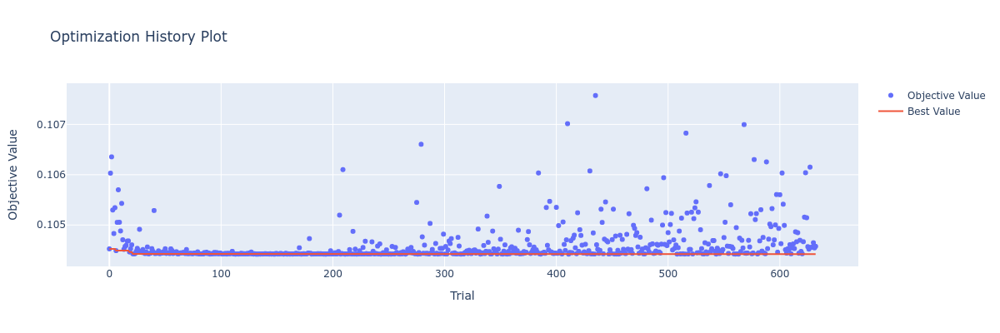

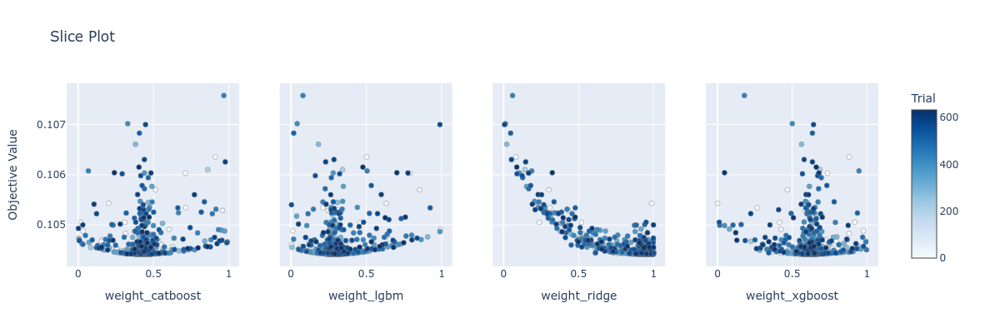

In [117]:
# default backend is way too slow here, use matplotlib instead
# optuna.visualization.matplotlib.plot_contour(study_vr)
optuna.visualization.plot_param_importances(study_vr).update_layout(width=600, height=400).show('png')
optuna.visualization.plot_optimization_history(study_vr).update_layout(width=1200, height=400).show('png')
optuna.visualization.plot_slice(study_vr).update_layout(width=1200, height=400).show('png')

In [118]:
vr = VotingRegressor(
    estimators=[('pipe_' + m, best_model_short[m]) for m in best_model_short.keys()],
    weights=[best_params_vr['weight_' + m] for m in best_model_short.keys()],
    n_jobs=1,
)

test_all_models(
    'VotingRegressor_optimized',
    {'VotingRegressor': vr},
    X,
    y,
    n_splits=num_folds,
    n_jobs=cpu_count,
)

VotingRegressor_optimized
VotingRegressor 0.10442150749133243



In [119]:
vr.weights

[0.6132624643750012,
 0.27392747363203707,
 0.4128720952346723,
 0.9222712355638678]

In [120]:
make_submission_all({'VotingRegressor': vr}, X, y, X_test, 'VotingRegressor_optimized')

## 23.2. <a id='toc23_2_'></a>[Stacking regressors](#toc0_)

### 23.2.1. <a id='toc23_2_1_'></a>[Ridge final estimator](#toc0_)

Use `Ridge()` as the final regressor, discover best alpha penalty, and best combo of base regressors, via Optuna.

#### 23.2.1.1. <a id='toc23_2_1_1_'></a>[All base estimators, no optimization](#toc0_)

Naive stacking regressor, default alpha penalty, default base regressor weights - no optimization.

In [121]:
sr_fe_pipe_ridge = Pipeline(
    [
        ('standard_scaler', StandardScaler()),
        ('ridge', Ridge(random_state=0)),
    ]
)

sr_ridge = StackingRegressor(
    estimators=[('pipe_' + m, best_model[m]) for m in best_model.keys() if m not in ['enet']],
    final_estimator=sr_fe_pipe_ridge,
    cv=KFold(n_splits=num_folds, shuffle=False),
    verbose=0,
    n_jobs=1,
)

# TEST_PIPELINES = True
test_all_models(
    'StackingRegressor_Ridge_full_models',
    {'StackingRegressor_Ridge_full_models': sr_ridge},
    X,
    y,
    n_splits=num_folds,
    n_jobs=cpu_count,
)
# TEST_PIPELINES = False

StackingRegressor_Ridge_full_models
StackingRegressor_Ridge_full_models 0.10570325701640888



#### 23.2.1.2. <a id='toc23_2_1_2_'></a>[Optuna loop](#toc0_)

Optimize all aspects of the stacking regressor.

In [122]:
# if True, this will restart optimization from scratch
# and will delete all optimization history
OPTUNA_SR_RIDGE_RESET = False

if OPTUNA_SR_RIDGE_RESET:
    try:
        optuna.delete_study(
            study_name='sr_ridge',
            storage=OPTUNA_URL,
        )
    except:
        pass

study_sr_ridge = optuna.create_study(
    direction='minimize',
    study_name='sr_ridge',
    storage=OPTUNA_URL,
    load_if_exists=True,
)

[I 2023-08-14 13:20:55,936] Using an existing study with name 'sr_ridge' instead of creating a new one.


In [123]:
def two_or_more(element_list):
    """
    From a given list of strings, return all combinations of 2 or more elements,
    joined by '_'.
    """
    combo_list = []
    for r in range(2, 1 + len(element_list)):
        combos = list(combinations(element_list, r))
        combos = ['_'.join(c) for c in combos]
        combo_list += combos
    return combo_list


def objective_sr_ridge(trial, best_model):
    model_args = {}
    model_args['alpha'] = trial.suggest_float('ridge_alpha', 0.1, 100.0)
    model_args['base_models'] = trial.suggest_categorical('base_models', two_or_more(best_model.keys()))

    estimators = [('pipe_' + m, best_model[m]) for m in best_model.keys() if m in model_args['base_models'].split('_')]

    sr_fe_pipe_ridge = Pipeline(
        [
            ('standard_scaler', StandardScaler()),
            ('ridge', Ridge(alpha=model_args['alpha'], random_state=0)),
        ]
    )

    sr_ridge = StackingRegressor(
        estimators=estimators,
        final_estimator=sr_fe_pipe_ridge,
        cv=KFold(n_splits=num_folds, shuffle=False),
        verbose=0,
        n_jobs=1,
    )

    # return np.random.random()
    return test_performance(pipe=sr_ridge, X=X, y=y, n_splits=num_folds, n_jobs=cpu_count)


# study_sr_ridge.optimize(lambda trial: objective_sr_ridge(trial, best_model_short), timeout=10*3600, catch=(ValueError,), show_progress_bar=False)

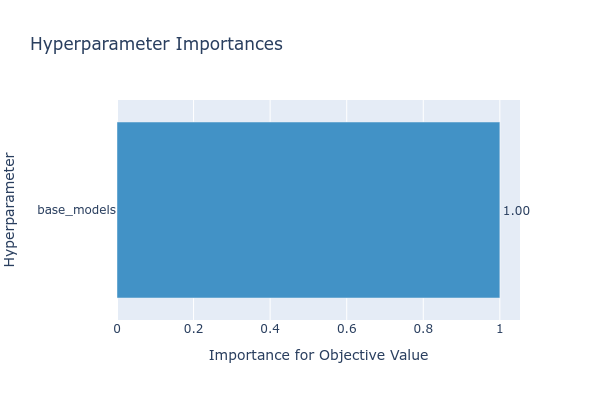

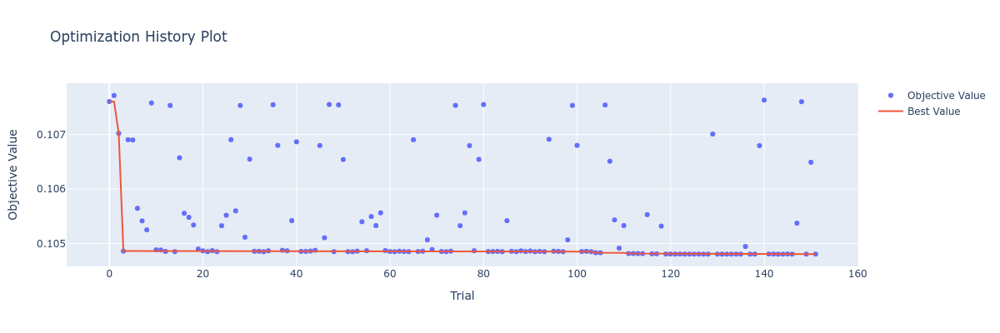

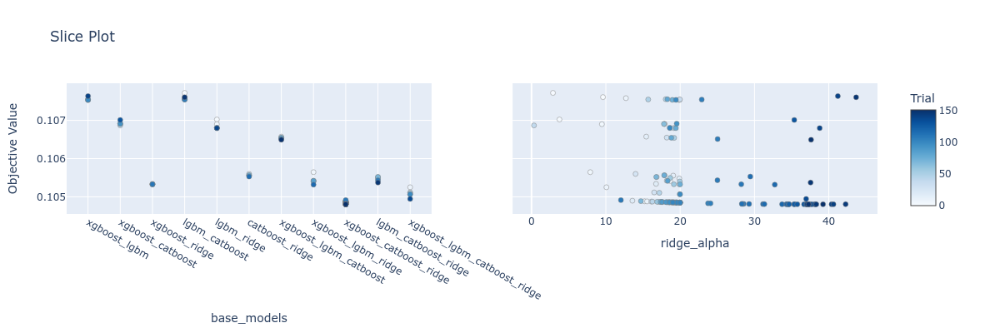

In [124]:
optuna.visualization.plot_param_importances(study_sr_ridge).update_layout(width=600, height=400).show('png')
optuna.visualization.plot_optimization_history(study_sr_ridge).update_layout(width=1200, height=400).show('png')
optuna.visualization.plot_slice(study_sr_ridge).update_layout(width=1200, height=400).show('png')

### 23.2.2. <a id='toc23_2_2_'></a>[ElasticNet final estimator](#toc0_)

Use `ElasticNet()` as the final regressor, discover best alpha penalty, and best combo of base regressors, via Optuna.

#### 23.2.2.1. <a id='toc23_2_2_1_'></a>[All base estimators, no optimization](#toc0_)

Naive stacking regressor, default alpha penalty, default base regressor weights - no optimization.

In [125]:
sr_fe_pipe_enet = Pipeline(
    [
        # ('standard_scaler', StandardScaler()),
        ('enet', ElasticNet(random_state=0, max_iter=10000)),
    ]
)

sr_enet = StackingRegressor(
    estimators=[('pipe_' + m, best_model_short[m]) for m in best_model_short.keys()],
    final_estimator=sr_fe_pipe_enet,
    cv=KFold(n_splits=num_folds, shuffle=False),
    verbose=0,
    n_jobs=1,
)

# TEST_PIPELINES = True
test_all_models(
    'StackingRegressor_ElasticNet_full_models',
    {'StackingRegressor_ElasticNet_full_models': sr_enet},
    X,
    y,
    n_splits=num_folds,
    n_jobs=cpu_count,
)
# TEST_PIPELINES = False

StackingRegressor_ElasticNet_full_models
StackingRegressor_ElasticNet_full_models 0.10580027270420111



#### 23.2.2.2. <a id='toc23_2_2_2_'></a>[Optuna loop](#toc0_)

Optimize all aspects of the stacking regressor.

In [126]:
# if True, this will restart optimization from scratch
# and will delete all optimization history
OPTUNA_SR_ENET_RESET = False

if OPTUNA_SR_ENET_RESET:
    try:
        optuna.delete_study(
            study_name='sr_enet',
            storage=OPTUNA_URL,
        )
    except:
        pass

study_sr_enet = optuna.create_study(
    direction='minimize',
    study_name='sr_enet',
    storage=OPTUNA_URL,
    load_if_exists=True,
)

[I 2023-08-14 13:20:59,043] Using an existing study with name 'sr_enet' instead of creating a new one.


In [127]:
def objective_sr_enet(trial, best_model):
    model_args = {}
    model_args['alpha'] = trial.suggest_float('enet_alpha', 0.1, 10.0, log=True)
    model_args['l1_ratio'] = trial.suggest_float('enet_l1_ratio', 0.001, 0.999, log=True)
    model_args['selection'] = trial.suggest_categorical('enet_selection', ['cyclic', 'random'])
    model_args['base_models'] = trial.suggest_categorical('base_models', two_or_more(best_model.keys()))

    estimators = [('pipe_' + m, best_model[m]) for m in best_model.keys() if m in model_args['base_models'].split('_')]

    sr_fe_pipe_enet = Pipeline(
        [
            # ('standard_scaler', StandardScaler()),
            (
                'enet',
                ElasticNet(
                    alpha=model_args['alpha'],
                    l1_ratio=model_args['l1_ratio'],
                    selection=model_args['selection'],
                    random_state=0,
                    max_iter=10000,
                ),
            ),
        ]
    )

    sr_enet = StackingRegressor(
        estimators=estimators,
        final_estimator=sr_fe_pipe_enet,
        cv=KFold(n_splits=num_folds, shuffle=False),
        verbose=0,
        n_jobs=1,
    )

    # return np.random.random()
    return test_performance(pipe=sr_enet, X=X, y=y, n_splits=num_folds, n_jobs=cpu_count)


# study_sr_enet.optimize(lambda trial: objective_sr_enet(trial, best_model_short), timeout=20*3600, catch=(ValueError,), show_progress_bar=False)

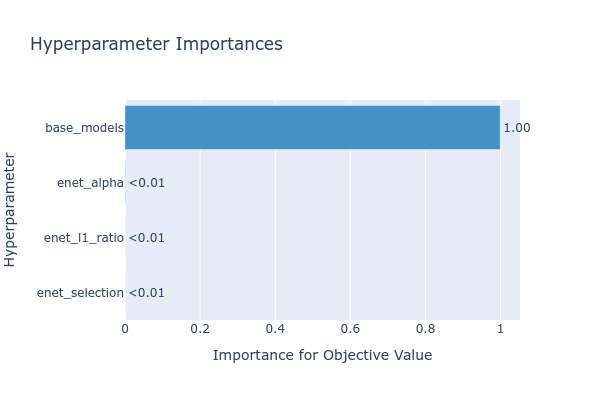

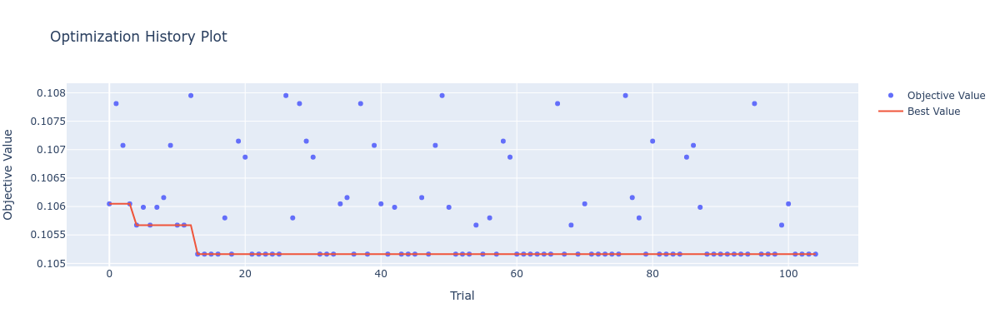

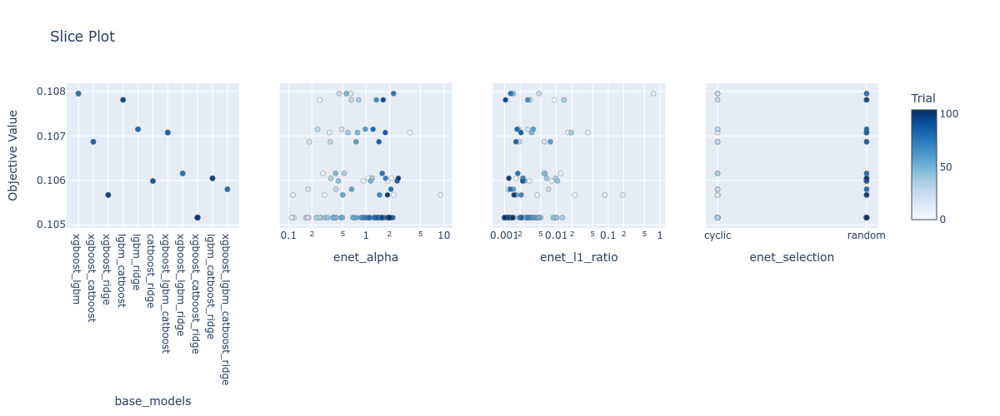

In [128]:
optuna.visualization.plot_param_importances(study_sr_enet).update_layout(width=600, height=400).show('png')
optuna.visualization.plot_optimization_history(study_sr_enet).update_layout(width=1200, height=400).show('png')
optuna.visualization.plot_slice(study_sr_enet).update_layout(width=1200, height=500).show('png')

### 23.2.3. <a id='toc23_2_3_'></a>[LightGBM final estimator](#toc0_)

Just using the plain LGBMRegressor with `passthrough=False` doesn't seem to benefit performance beyond what Ridge can do.

It would be interesting to use `StackingRegressor(passthrough=True)`, use the full pipeline `best_model['lgbm']` as the final estimator, with the features from X being processed by the lgbm pipeline, and the predictions from the base estimators being passthrough'ed directly to the final LGBMRegressor model, bypassing the preproc steps in `best_model['lgbm']`.

However, all code here assumes X is a Pandas dataframe with mixed feature types, and StackingRegressor cannot handle that.

https://github.com/scikit-learn/scikit-learn/issues/16473

# 24. <a id='toc24_'></a>[Final words](#toc0_)

The best overall performance in cross-validation was obtained with the **voting regressor**, using these base regressors:

- xgboost
- lgbm
- catboost
- ridge

The highest weight of the base regressors in the voting ensemble was given to **ridge**.

Among standalone models, **xgboost** was the best performer, with ridge a close second. ElasticNet was the worst performer.